In [1]:
import numpy as np
import tensorflow as tf
import math
import random
import os
from glob import glob
import matplotlib.pyplot as plt
import time

In [2]:
import cv2

In [3]:
from typeguard import typechecked

In [4]:
# import torch
# from torch.nn import functional as F
# from torchvision.transforms import ToTensor, ToPILImage
# from scipy import special

In [5]:
!gdown --id 1SeS07nyYKJigQNi6BY6CKGy1zz0JOCWl

Downloading...
From: https://drive.google.com/uc?id=1SeS07nyYKJigQNi6BY6CKGy1zz0JOCWl
To: /content/RealSGAN.zip
100% 1.91G/1.91G [00:11<00:00, 169MB/s]


In [6]:
# seed = 12345
# random.seed(seed)

In [7]:
# np.random.seed(seed)

In [8]:
# torch.manual_seed(seed)

In [9]:
# tf.random.set_seed(seed)

In [10]:
!unzip -q RealSGAN.zip

In [ ]:
!mkdir data

In [ ]:
!mv final_shots data

In [ ]:
!unzip -q lq_test_shots.zip

In [ ]:
!unzip -q gt_test_shots.zip

In [ ]:
# !unzip -q training_checkpoints.zip

In [ ]:
# !unzip -q ema_training_checkpoints.zip

In [11]:
!unzip -q anime_test.zip

In [116]:
!unzip -q training_gan_checkpoints.zip

In [117]:
!unzip -q ema_training_gan_checkpoints.zip

In [ ]:
len(glob("final_shots/*.png"))
# batch 14, 12

2058

In [ ]:
print(f"TensorFlow version {tf.__version__}")

device_name = tf.test.gpu_device_name()
if not device_name:
  print('GPU device not found')
else:
  !nvidia-smi

TensorFlow version 2.7.0
Tue Nov 23 21:21:52 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P0    32W / 250W |    703MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                               

In [ ]:
print(f"TensorFlow version {tf.__version__}")

device_name = tf.test.gpu_device_name()
if not device_name:
  print('GPU device not found')
else:
  !nvidia-smi

TensorFlow version 2.7.0
Fri Nov 12 00:17:25 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    32W / 250W |    375MiB / 16280MiB |      1%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                               

In [ ]:
print(f"TensorFlow version {tf.__version__}")

device_name = tf.test.gpu_device_name()
if not device_name:
  print('GPU device not found')
else:
  !nvidia-smi

TensorFlow version 2.7.0
Wed Nov 10 21:22:34 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P0    34W / 250W |    375MiB / 16280MiB |      1%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                               

In [ ]:
print(f"TensorFlow version {tf.__version__}")

device_name = tf.test.gpu_device_name()
if not device_name:
  print('GPU device not found')
else:
  !nvidia-smi

TensorFlow version 2.6.0
Mon Nov  8 23:22:33 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P0    32W / 250W |    345MiB / 16280MiB |      1%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                               

# Data Utils

In [12]:
!pip install tfa-nightly

     |████████████████████████████████| 1.1 MB 8.2 MB/s 


In [13]:
# <DataUtils>

In [14]:
#! import tensorflow as tf
#! import math
#! import numpy as np
#! import random
#! import cv2

In [15]:
from tensorflow.keras import layers

## Augmentation Utils

In [17]:
def mesh_grid(kernel_size):
  ax = tf.range(-kernel_size // 2 + 1., kernel_size // 2 + 1.)
  xx1, yy1 = tf.meshgrid(ax, ax)

  xx = tf.reshape(xx1, (kernel_size * kernel_size, 1))
  yy = tf.reshape(yy1, (kernel_size * kernel_size, 1))

  xy = tf.stack([xx, yy], axis=1)

  xy = tf.reshape(xy, (kernel_size, kernel_size, 2))

  return xy, xx1, yy1

In [18]:
def sigma_matrix2(sig_x, sig_y, theta):
  d_matrix = [[sig_x**2, 0], [0, sig_y**2]]
  u_matrix = [[tf.cos(theta), -tf.sin(theta)], [tf.sin(theta), tf.cos(theta)]]

  return tf.matmul(u_matrix, tf.matmul(d_matrix, tf.transpose(u_matrix)))

In [19]:
def pdf2(sigma_matrix, grid):
  inverse_sigma = tf.linalg.inv(sigma_matrix)
  x = tf.reduce_sum((tf.matmul(grid, inverse_sigma) * grid), 2) * -0.5 
  kernel = tf.exp(x)

  return kernel

In [20]:
def filter2D(imgs, kernels):
  b, h, w, c = imgs.shape
  k = kernels.shape[-1]
  pad_size = k // 2
  padding = [[0, 0], [pad_size, pad_size], [pad_size, pad_size], [0, 0]]
  imgs = tf.pad(imgs, padding, "REFLECT")

  _, ph, pw, _ = imgs.shape

  imgs = tf.transpose(imgs, [1, 2, 3, 0]) # H x W x C x B
  imgs = tf.reshape(imgs, (1, ph, pw, c * b)) # 1 x H x W x B*C

  kernels = tf.transpose(kernels, [1, 2, 0]) # k, k, b
  kernels = tf.reshape(kernels, [k, k, 1, b]) # k, k, 1, b
  kernels = tf.repeat(kernels, repeats=[c], axis=-1) # k, k, 1, b * c
  
  # kernel_height, kernel_width, input_filters, output_filters
  conv = layers.Conv2D(b*c, k, weights=[kernels], use_bias=False, groups=b*c)
  conv.trainable = False

  imgs = conv(imgs)

  imgs = tf.reshape(imgs, (h, w, c, b)) # H x W x C x B
  imgs = tf.transpose(imgs, [3, 0, 1, 2]) # B x H x W x C

  return imgs

In [21]:
def gaussian_filter2d(imgs, filter):
  b, h, w, c = imgs.shape
  k = filter.shape[-1]
  pad_size = k // 2
  padding = [[0, 0], [pad_size, pad_size], [pad_size, pad_size], [0, 0]]
  imgs = tf.pad(imgs, padding, "REFLECT")

  _, ph, pw, _ = imgs.shape

  imgs = tf.transpose(imgs, [0, 3, 1, 2]) # B x C x H x W 
  imgs = tf.reshape(imgs, (b*c, ph, pw, 1)) # B*C x H x W x 1 

  filter = tf.expand_dims(filter, axis=-1)
  filter = tf.expand_dims(filter, axis=-1) # k, k, 1, 1

  # kernel_height, kernel_width, input_filters, output_filters
  conv = layers.Conv2D(1, k, weights=[filter], use_bias=False)
  conv.trainable = False

  imgs = conv(imgs)

  imgs = tf.reshape(imgs, (b, c, h, w)) # B x C x H x W 
  imgs = tf.transpose(imgs, [0, 2, 3, 1]) # B x H x W x C

  return imgs

In [22]:
class USMSharp():
  def __init__(self, filter_size=51):
    self.filter_size = 51
    self.sigma = 0.3 * ((filter_size - 1) * 0.5 - 1) + 0.8

    kernel = cv2.getGaussianKernel(filter_size, 0)
    self.kernel = tf.matmul(kernel, tf.transpose(kernel))
    self.threshold = 10
    self.weight = 0.5
  
  def sharp(self, imgs):
    blur = gaussian_filter2d(imgs, self.kernel)

    residual = imgs - blur

    mask = tf.math.abs(residual) * 255 > self.threshold
    mask = tf.cast(mask, dtype=tf.float32)

    soft_mask = gaussian_filter2d(mask, self.kernel)

    sharp = imgs + (self.weight * residual)

    sharp = tf.clip_by_value(sharp, 0, 1)

    return soft_mask * sharp + (1 - soft_mask) * imgs

### Kernels

In [23]:
def lowpass_kernel(x, y, cutoff, kernel_size):
  return cutoff * tf.math.special.bessel_j1(cutoff * tf.sqrt(
          (x - (kernel_size - 1) / 2)**2 + (y - (kernel_size - 1) / 2)**2)) / (2 * np.pi * tf.sqrt(
              (x - (kernel_size - 1) / 2)**2 + (y - (kernel_size - 1) / 2)**2))

In [24]:
def inner_kernel_map(x1, y1, z, cutoff, kernel_size):
  def inner_func(arr):
    if arr[0] == x1 and arr[1] == y1:
      return z 
    else:
      return lowpass_kernel(arr[0], arr[1], cutoff, kernel_size)
  return inner_func

In [25]:
def circular_lowpass_kernel(cutoff, kernel_size, pad_to=0):
  assert kernel_size % 2 == 1, 'Kernel size must be an odd number.'

  x = [[i] * kernel_size for i in range(kernel_size)]
  x = tf.cast(x, dtype=tf.float32)
  y = tf.transpose(x)

  xy = tf.stack([x, y], axis=2)
  xy = tf.reshape(xy, (-1, 2))

  y1 = (kernel_size - 1) // 2
  x1 = (kernel_size - 1) // 2

  z = cutoff ** 2 / (4 * np.pi)

  inner_func_ = inner_kernel_map(x1, y1, z, cutoff, kernel_size)

  # kernel = [[z if i == x1 and j == y1 else lowpass_kernel(i, j, cutoff, kernel_size) for i, j in zip(ia, ja)] for ia, ja in zip(x, y)]
  # kernel = [z if i == x1 and j == y1 else lowpass_kernel(i, j, cutoff, kernel_size) for i, j in xy]
  kernel = tf.map_fn(inner_func_, xy, fn_output_signature=tf.float32)
  kernel = tf.reshape(kernel, (kernel_size, kernel_size))
  
  kernel = kernel / tf.reduce_sum(kernel)
  
  if pad_to > kernel_size:
    pad_size = (pad_to - kernel_size) // 2
    padding = [[pad_size, pad_size], [pad_size, pad_size]]
    kernel = tf.pad(kernel, padding) 
    
  return kernel

In [26]:
def bivariate_Gaussian(kernel_size, sig_x, sig_y, theta, isotropic=True):
  grid, _, _ = mesh_grid(kernel_size)

  if isotropic:
    sigma_matrix = [[sig_x**2, 0], [0, sig_x**2]]
    sigma_matrix = tf.convert_to_tensor(sigma_matrix, dtype=tf.float32)
  else:
    sigma_matrix = sigma_matrix2(sig_x, sig_y, theta)
  
  kernel = pdf2(sigma_matrix, grid)
  kernel = kernel / tf.reduce_sum(kernel)

  return kernel

In [27]:
def random_bivariate_Gaussian(kernel_size, kernel_props, isotropic=True):
  rotation_range = (-math.pi, math.pi)

  sigma_x_range = kernel_props["sigma_x_range"]
  sigma_y_range = kernel_props["sigma_y_range"]

  assert kernel_size % 2 == 1, 'Kernel size must be an odd number.'
  assert sigma_x_range[0] < sigma_x_range[1], 'Wrong sigma_x_range.'

  sigma_x = tf.random.uniform([], sigma_x_range[0], sigma_x_range[1])

  if isotropic is False:
    assert sigma_y_range[0] < sigma_y_range[1], 'Wrong sigma_y_range.'
    assert rotation_range[0] < rotation_range[1], 'Wrong rotation_range.'
    
    sigma_y = tf.random.uniform([], sigma_y_range[0], sigma_y_range[1])
    rotation = tf.random.uniform([], rotation_range[0], rotation_range[1])
  else:
    sigma_y = sigma_x
    rotation = 0

  kernel = bivariate_Gaussian(kernel_size, sigma_x, sigma_y, rotation, isotropic=isotropic)

  return kernel / tf.reduce_sum(kernel)

In [28]:
def bivariate_generalized_Gaussian(kernel_size, sig_x, sig_y, theta, beta, isotropic=True):
  grid, _, _ = mesh_grid(kernel_size)

  if isotropic:
    sigma_matrix = [[sig_x**2, 0], [0, sig_x**2]]
    sigma_matrix = tf.convert_to_tensor(sigma_matrix, dtype=tf.float32)
  else:
    sigma_matrix = sigma_matrix2(sig_x, sig_y, theta)

  inverse_sigma = tf.linalg.inv(sigma_matrix)

  x = tf.reduce_sum((tf.matmul(grid, inverse_sigma) * grid), 2)
  x = tf.pow(x, beta) * -0.5 
  kernel = tf.exp(x)

  return kernel / tf.reduce_sum(kernel)

In [29]:
def random_bivariate_generalized_Gaussian(kernel_size, kernel_props, isotropic=True):
  rotation_range = (-math.pi, math.pi)

  sigma_x_range = kernel_props["sigma_x_range"]
  sigma_y_range = kernel_props["sigma_y_range"]
  beta_range = kernel_props["betag_range"]

  assert kernel_size % 2 == 1, 'Kernel size must be an odd number.'
  assert sigma_x_range[0] < sigma_x_range[1], 'Wrong sigma_x_range.'

  sigma_x = tf.random.uniform([], sigma_x_range[0], sigma_x_range[1])

  if isotropic is False:
    assert sigma_y_range[0] < sigma_y_range[1], 'Wrong sigma_y_range.'
    assert rotation_range[0] < rotation_range[1], 'Wrong rotation_range.'

    sigma_y = tf.random.uniform([], sigma_y_range[0], sigma_y_range[1])
    rotation = tf.random.uniform([], rotation_range[0], rotation_range[1])
  else:
    sigma_y = sigma_x
    rotation = 0

  # assume beta_range[0] < 1 < beta_range[1]
  if tf.random.uniform([]) < 0.5:
    beta = tf.random.uniform([], beta_range[0], 1)
  else:
    beta = tf.random.uniform([], 1, beta_range[1])

  kernel = bivariate_generalized_Gaussian(kernel_size, sigma_x, sigma_y, rotation, beta, isotropic=isotropic)

  return kernel / tf.reduce_sum(kernel)

In [30]:
def bivariate_plateau(kernel_size, sig_x, sig_y, theta, beta, isotropic=True):
  grid, _, _ = mesh_grid(kernel_size)

  if isotropic:
    sigma_matrix = [[sig_x**2, 0], [0, sig_x**2]]
    sigma_matrix = tf.convert_to_tensor(sigma_matrix, dtype=tf.float32)
  else:
    sigma_matrix = sigma_matrix2(sig_x, sig_y, theta)

  inverse_sigma = tf.linalg.inv(sigma_matrix)

  x = tf.reduce_sum((tf.matmul(grid, inverse_sigma) * grid), 2)
  x = tf.pow(x, beta) + 1
  kernel = tf.math.reciprocal(x)
  
  return kernel / tf.reduce_sum(kernel)

In [31]:
def random_bivariate_plateau(kernel_size, kernel_props, isotropic=True):
  rotation_range = (-math.pi, math.pi)

  sigma_x_range = kernel_props["sigma_x_range"]
  sigma_y_range = kernel_props["sigma_y_range"]
  beta_range = kernel_props["betap_range"]

  assert kernel_size % 2 == 1, 'Kernel size must be an odd number.'
  assert sigma_x_range[0] < sigma_x_range[1], 'Wrong sigma_x_range.'

  sigma_x = tf.random.uniform([], sigma_x_range[0], sigma_x_range[1])

  if isotropic is False:
    assert sigma_y_range[0] < sigma_y_range[1], 'Wrong sigma_y_range.'
    assert rotation_range[0] < rotation_range[1], 'Wrong rotation_range.'

    sigma_y = tf.random.uniform([], sigma_y_range[0], sigma_y_range[1])
    rotation = tf.random.uniform([], rotation_range[0], rotation_range[1])
  else:
      sigma_y = sigma_x
      rotation = 0

  if tf.random.uniform([]) < 0.5:
    beta = tf.random.uniform([], beta_range[0], 1)
  else:
    beta = tf.random.uniform([], 1, beta_range[1])

  kernel = bivariate_plateau(kernel_size, sigma_x, sigma_y, rotation, beta, isotropic=isotropic)

  return kernel / tf.reduce_sum(kernel)

In [32]:
def random_mixed_kernels(kernel_size, kernel_props):
  kernel_type = random.choices(kernel_props["kernel_list"], kernel_props["kernel_prob"])[0]

  if kernel_type == 'iso':
    kernel = random_bivariate_Gaussian(kernel_size, kernel_props, isotropic=True)
  elif kernel_type == 'aniso':
    kernel = random_bivariate_Gaussian(kernel_size, kernel_props, isotropic=False)
  elif kernel_type == 'generalized_iso':
    kernel = random_bivariate_generalized_Gaussian(kernel_size, kernel_props, isotropic=True)
  elif kernel_type == 'generalized_aniso':
    kernel = random_bivariate_generalized_Gaussian(kernel_size, kernel_props, isotropic=False)
  elif kernel_type == 'plateau_iso':
    kernel = random_bivariate_plateau(kernel_size, kernel_props, isotropic=True)
  elif kernel_type == 'plateau_aniso':
    kernel = random_bivariate_plateau(kernel_size, kernel_props, isotropic=False)
  
  return kernel

## Noise

### Poisson

In [33]:
def generate_poisson_noise(img, scale=1.0, gray_noise=0):
  b, h, w, c = img.shape

  gray_noise = tf.reshape(gray_noise, (b, 1, 1, 1))
  cal_gray_noise = tf.reduce_sum(gray_noise) > 0

  base_2 = tf.math.log([2.])

  if cal_gray_noise:
    img_gray = tf.image.rgb_to_grayscale(img)
    img_gray = tf.clip_by_value(tf.math.round(img_gray * 255.0), 0, 255) / 255.

    vals_list = [len(tf.unique(tf.reshape(img_gray[i, :, :, :], h * w))[0]) for i in range(b)]

    vals_list = [2 ** tf.math.ceil(tf.math.log(tf.cast(vals, tf.float32)) / base_2) for vals in vals_list]

    vals = tf.reshape(vals_list, (b, 1, 1, 1))

    out = tf.random.poisson([], img_gray * vals) / vals
    noise_gray = out - img_gray
    noise_gray = tf.repeat(noise_gray, repeats=[3], axis=-1)

  # always calculate color noise
  # round and clip image for counting vals correctly
  img = tf.clip_by_value(tf.math.round(img * 255.0), 0, 255) / 255.

  # use for-loop to get the unique values for each sample
  vals_list = [len(tf.unique(tf.reshape(img[i, :, :, :], h * w * c))[0]) for i in range(b)]
  vals_list = [2 ** tf.math.ceil(tf.math.log(tf.cast(vals, tf.float32)) / base_2) for vals in vals_list]

  vals = tf.reshape(vals_list, (b, 1, 1, 1))

  out = tf.random.poisson([], img * vals) / vals
  noise = out - img

  if cal_gray_noise:
    noise = noise * (1 - gray_noise) + noise_gray * gray_noise

  scale = tf.reshape(scale, (b, 1, 1, 1))

  return noise * scale

In [34]:
def random_generate_poisson_noise(img, scale_range=(0, 1.0), gray_prob=0):
  scale = tf.random.uniform([img.shape[0]], dtype=img.dtype) * (scale_range[1] - scale_range[0]) + scale_range[0]

  gray_noise = tf.random.uniform([img.shape[0]], dtype=img.dtype)
  gray_noise = tf.cast((gray_noise < gray_prob), dtype=tf.float32)

  return generate_poisson_noise(img, scale, gray_noise)

In [35]:
def random_add_poisson_noise(img, scale_range=(0, 1.0), gray_prob=0):
  noise = random_generate_poisson_noise(img, scale_range, gray_prob)
  out = img + noise
  out = tf.clip_by_value(out, 0, 1)

  return out

### Gaussian

In [36]:
def generate_gaussian_noise(img, sigma=10, gray_noise=0):
  b, h, w, c = img.shape

  sigma = tf.reshape(sigma, (b, 1, 1, 1))
  gray_noise = tf.reshape(gray_noise, (b, 1, 1, 1))
  cal_gray_noise = tf.reduce_sum(gray_noise) > 0

  if cal_gray_noise:
    noise_gray = tf.random.normal([1, h, w, 1], dtype=img.dtype) * sigma / 255.

  # always calculate color noise
  noise = tf.random.normal([b, h, w, c], dtype=img.dtype) * sigma / 255.

  if cal_gray_noise:
    noise = noise * (1 - gray_noise) + noise_gray * gray_noise

  return noise

In [37]:
def random_generate_gaussian_noise(img, sigma_range=(0, 10), gray_prob=0):
  sigma = tf.random.uniform([img.shape[0]], dtype=img.dtype) * (sigma_range[1] - sigma_range[0]) + sigma_range[0]
  
  # gray_noise = torch.rand(img.size(0), dtype=img.dtype, device=img.device)
  # gray_noise = (gray_noise < gray_prob).float()

  gray_noise = tf.random.uniform([img.shape[0]], dtype=img.dtype)
  gray_noise = tf.cast((gray_noise < gray_prob), dtype=tf.float32)

  return generate_gaussian_noise(img, sigma, gray_noise)

In [38]:
def random_add_gaussian_noise(img, sigma_range=(0, 1.0), gray_prob=0):
  noise = random_generate_gaussian_noise(img, sigma_range, gray_prob)
  
  out = img + noise
  out = tf.clip_by_value(out, 0, 1)

  return out

## Kernel generator

In [39]:
def generate_kernel(kernel_props):
  kernel_range = [2 * v + 1 for v in range(3, 11)] # from 7 to 21
  kernel_size = random.choice(kernel_range)

  sinc_prob = kernel_props["sinc_prob"]

  if tf.random.uniform([]) < sinc_prob:
    if kernel_size < 13:
      omega_c = tf.random.uniform([], np.pi / 3, np.pi)
    else:
      omega_c = tf.random.uniform([], np.pi / 5, np.pi)
      
    kernel = circular_lowpass_kernel(omega_c, kernel_size, pad_to=False)
  
  else:
    kernel = random_mixed_kernels(kernel_size, kernel_props)

  if kernel_size < 21:
    pad_to = 21
    pad_size = (pad_to - kernel_size) // 2
    padding = [[pad_size, pad_size], [pad_size, pad_size]]
    kernel = tf.pad(kernel, padding)

  return kernel

In [40]:
def generate_sinc_kernel(sinc_prob):
  kernel_range = [2 * v + 1 for v in range(3, 11)] # from 7 to 21

  if tf.random.uniform([]) < sinc_prob:
    kernel_size = random.choice(kernel_range)
    omega_c = tf.random.uniform([], np.pi / 3, np.pi, dtype=tf.float32)

    sinc_kernel = circular_lowpass_kernel(omega_c, kernel_size, pad_to=21)
  else:
    pulse = tf.constant([[1], [0]], dtype=tf.float32)
    pad_size = 10
    padding = [[pad_size, pad_size - 1], [pad_size, pad_size]]
    pulse = tf.pad(pulse, padding) 
    sinc_kernel = pulse

  return sinc_kernel

In [41]:
final_sinc_prob = 0.8

kernel_props_1 = {
    "kernel_list": ['iso', 'aniso', 'generalized_iso', 'generalized_aniso', 'plateau_iso', 'plateau_aniso'],
    "kernel_prob": [0.45, 0.25, 0.12, 0.03, 0.12, 0.03],
    "sigma_x_range": [0.2, 3],
    "sigma_y_range": [0.2, 3],
    "betag_range": [0.5, 4],
    "betap_range": [1, 2],
    "sinc_prob": 0.1
}

kernel_props_2 = {
    "kernel_list": ['iso', 'aniso', 'generalized_iso', 'generalized_aniso', 'plateau_iso', 'plateau_aniso'],
    "kernel_prob": [0.45, 0.25, 0.12, 0.03, 0.12, 0.03],
    "sigma_x_range": [0.2, 1.5],
    "sigma_y_range": [0.2, 1.5],
    "betag_range": [0.5, 4],
    "betap_range": [1, 2],
    "sinc_prob": 0.1
}

In [42]:
# <DataUtilsEnd>

# Data Generator

In [43]:
# <DataGenerator>

In [44]:
#! import tensorflow as tf
#! import random
#! from glob import glob

In [45]:
#! from data_generator.data_utils import kernel_props_1, kernel_props_2, final_sinc_prob
#! from data_generator.data_utils import generate_sinc_kernel, generate_kernel
#! from data_generator.data_utils import random_add_gaussian_noise, random_add_poisson_noise
#! from data_generator.data_utils import filter2D, usm_sharpener

In [46]:
def augment_image(img, rotation=False):
  if tf.random.uniform([]) > 0.5:
    img = tf.image.flip_left_right(img)

  if rotation and tf.random.uniform([]) > 0.5:
    img = tf.image.flip_up_down(img)

  if rotation and tf.random.uniform([]) > 0.5:
    img = tf.image.rot90(img)

  return img

In [47]:
def load_image(image_path, crop_pad_size=400):
  img = tf.io.read_file(image_path)
  img = tf.image.decode_png(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  img = augment_image(img)

  size = tf.shape(img)
  height, width = size[0], size[1]

  if height < crop_pad_size or width < crop_pad_size:
    pad_h = tf.maximum(0, crop_pad_size - height)
    pad_w = tf.maximum(0, crop_pad_size - width)
              
        # height (top and bottom), width (left and right),   channels
    padding = [[0, pad_h], [0, pad_w], [0, 0]]
    img = tf.pad(img, padding, "REFLECT") 

  size = tf.shape(img)
  height, width = size[0], size[1]

  if height > crop_pad_size or width > crop_pad_size:
    if (height - crop_pad_size) <= 0:
      top = 0
    else:
      top = tf.random.uniform([], 0, height - crop_pad_size, dtype=tf.dtypes.int32)

    if (width - crop_pad_size) <= 0:
      left = 0
    else:
      left = tf.random.uniform([], 0, width - crop_pad_size, dtype=tf.dtypes.int32)
    
    img = tf.image.crop_to_bounding_box(img, top, left, crop_pad_size, crop_pad_size)

  return img

In [48]:
def load_test_img(image_path):
  img = tf.io.read_file(image_path)
  img = tf.image.decode_png(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  return img

In [49]:
def load_train_image(final_sinc_prob, kernel_props_1, kernel_props_2):
  def load_image_kernels(image_path):
    img = load_image(image_path)

    first_kernel = generate_kernel(kernel_props_1)
    second_kernel = generate_kernel(kernel_props_2)

    sinc_kernel = generate_sinc_kernel(final_sinc_prob)

    return img, first_kernel, second_kernel, sinc_kernel
    
  return load_image_kernels

In [50]:
load_function = load_train_image(final_sinc_prob, kernel_props_1, kernel_props_2)

In [51]:
train_images_paths = sorted(glob("final_shots/*.png"))

In [55]:
train_dataset = tf.data.Dataset.from_tensor_slices((train_images_paths))
train_dataset = train_dataset.shuffle(len(train_images_paths))
train_dataset = train_dataset.map(load_function, num_parallel_calls=tf.data.experimental.AUTOTUNE)

### Feed Data

In [56]:
feed_props_1 = {
  "resize_prob": [0.2, 0.7, 0.1],
  "resize_range": [0.15, 1.5],
  "gray_noise_prob": 0.4,
  "gaussian_noise_prob": 0.5,
  "noise_range": [1, 30],
  "poisson_scale_range": [0.05, 3],
}

feed_props_2 = {
  "resize_prob": [0.3, 0.4, 0.3],
  "resize_range": [0.3, 1.2],
  "gray_noise_prob": 0.4,
  "gaussian_noise_prob": 0.5,
  "noise_range": [1, 25],
  "poisson_scale_range": [0.05, 2.5],
}

In [57]:
def random_crop(imgs, out, final_size=256, scale=4):
  _, h_lq, w_lq, _ = out.shape

  lq_patch_size = final_size // scale # 64

  top = random.randint(0, h_lq - lq_patch_size)
  left = random.randint(0, w_lq - lq_patch_size)
  out = tf.image.crop_to_bounding_box(out, top, left, lq_patch_size, lq_patch_size)

  top_gt, left_gt = int(top * scale), int(left * scale)
  imgs = tf.image.crop_to_bounding_box(imgs, top_gt, left_gt, final_size, final_size)        

  return imgs, out

In [58]:
def degradation(imgs, kernels, opts_dict, blur_prob=1.0):
  if (blur_prob == 1.0) or ( tf.random.uniform([]) < blur_prob):
    imgs = filter2D(imgs, kernels)
  
  updown_type = random.choices(['up', 'down', 'keep'], opts_dict['resize_prob'])[0]

  if updown_type == 'up':
    scale = tf.random.uniform([], 1, opts_dict['resize_range'][1])
  elif updown_type == 'down':
    scale = tf.random.uniform([], opts_dict['resize_range'][0], 1)
  else:
    scale = 1

  mode = random.choice(['area', 'bilinear', 'bicubic'])

  if scale != 1:
    size = int(scale * imgs.shape[1])
    imgs = tf.image.resize(imgs, [size, size], method=mode)

  gray_noise_prob = opts_dict['gray_noise_prob']

  if tf.random.uniform([]) < opts_dict['gaussian_noise_prob']:
    imgs = random_add_gaussian_noise(imgs, sigma_range=opts_dict['noise_range'], gray_prob=gray_noise_prob)
  else:
    imgs = random_add_poisson_noise(imgs, scale_range=opts_dict['poisson_scale_range'], gray_prob=gray_noise_prob)
  
  return imgs

In [59]:
usm_sharpener = USMSharp()

In [60]:
def feed_data(imgs, first_kernels, second_kernels, sinc_kernels, feed_props, final_size=256, jpg_quality=(30, 95)):
  usm_imgs = usm_sharpener.sharp(imgs)
  batch, height, width, _ = usm_imgs.shape
  scale = 4

  out = degradation(usm_imgs, first_kernels, feed_props[0], blur_prob=1.0)

  out = tf.clip_by_value(out, 0, 1)
  out = [tf.image.random_jpeg_quality(out[i], jpg_quality[0], jpg_quality[1]) for i in range(0, batch)]

  out = tf.convert_to_tensor(out)

  out = degradation(out, second_kernels, feed_props[1], blur_prob=0.8)

  if tf.random.uniform([]) < 0.5:
    # resize back + the final sinc filter
    mode = random.choice(['area', 'bilinear', 'bicubic'])
    size = height // scale
    out = tf.image.resize(out, [size, size], method=mode)
    out = filter2D(out, sinc_kernels)
    
    # JPEG compression
    out = tf.clip_by_value(out, 0, 1)
    out = [tf.image.random_jpeg_quality(out[i], jpg_quality[0], jpg_quality[1]) for i in range(0, batch)]
    out = tf.convert_to_tensor(out)

  else:
    # JPEG compression
    out = tf.clip_by_value(out, 0, 1)
    out = [tf.image.random_jpeg_quality(out[i], jpg_quality[0], jpg_quality[1]) for i in range(0, batch)]
    out = tf.convert_to_tensor(out)
    # resize back + the final sinc filter
    
    mode = random.choice(['area', 'bilinear', 'bicubic'])
    size = height // scale
    out = tf.image.resize(out, [size, size], method=mode)
    out = filter2D(out, sinc_kernels)


  out = tf.clip_by_value(tf.math.round(out * 255.0), 0, 255) / 255.

  imgs, out = random_crop(imgs, out, final_size=final_size, scale=scale)
  
  return imgs, out

In [61]:
class PoolData():
  def __init__(self, pool_size, batch_size):
    self.pool_size = pool_size
    self.idx = list(range(self.pool_size))
    self.queue_gt = None
    self.queue_lr = None
    self.batch_size = batch_size

    if not pool_size % batch_size == 0:
      raise TypeError(
        f"pool_size ({pool_size}) % batch_size ({batch_size}) should be 0"
      )
  
  def get_pool_data(self, new_imgs, new_out):
    if self.queue_gt == None:
      self.queue_gt = new_imgs
      self.queue_lr = new_out

      return new_imgs, new_out

    elif self.queue_gt.shape[0] == self.pool_size:
      self.idx = tf.random.shuffle(self.idx)

      # shuffle
      self.queue_gt = tf.gather(self.queue_gt, self.idx)
      self.queue_lr = tf.gather(self.queue_lr, self.idx)

      o_new_imgs = self.queue_gt[0:self.batch_size]
      o_new_out = self.queue_lr[0:self.batch_size]

      self.queue_gt = tf.concat([new_imgs, self.queue_gt[self.batch_size:]], axis=0)
      self.queue_lr = tf.concat([new_out, self.queue_lr[self.batch_size:]], axis=0)
      
      assert self.queue_gt.shape[0] == self.pool_size

      return o_new_imgs, o_new_out

    else:
      self.queue_gt = tf.concat([self.queue_gt, new_imgs], axis=0)
      self.queue_lr = tf.concat([self.queue_lr, new_out], axis=0)

      return new_imgs, new_out

In [62]:
# <DataGeneratorEnd>

# Data Generator Test

In [152]:
# <DataGeneratorTest>

In [167]:
#! from data_generator.data_generator import train_dataset, feed_data, PoolData
#! from data_generator.data_generator import feed_props_1, feed_props_2
import unittest
import builtins

In [168]:
using_notebook = getattr(builtins, "__IPYTHON__", False)

In [183]:
test_batch_size = 4
pad_img_size = 400
final_gt_img_size = 256
final_lq_img_size = 64

kernel_size = 21

test_pool_size = test_batch_size * 2

In [184]:
class TestDataGenerator(unittest.TestCase):
  def setUp(self):
    test_generator = train_dataset.batch(test_batch_size)
    self.pool_test_data = PoolData(test_pool_size, test_batch_size)

    iterator = iter(test_generator)
    img, first_kernel, second_kernel, sinc_kernel = next(iterator)
    gt_img, lq_img = feed_data(img, first_kernel, second_kernel, sinc_kernel, [feed_props_1, feed_props_2])

    self.img = img
    self.first_kernel = first_kernel
    self.second_kernel = second_kernel
    self.sinc_kernel = sinc_kernel

    self.gt_img = gt_img
    self.lq_img = lq_img

    self.first_pool_gt_shape = (4, 256, 256, 3)
    self.first_pool_lq_shape = (4, 64, 64, 3)

    self.second_pool_gt_shape = (8, 256, 256, 3)
    self.second_pool_lq_shape = (8, 64, 64, 3)

  def test_gt_image_stats(self):
    np_gt_img = self.gt_img.numpy()
    t_min = np_gt_img.min()
    t_max = np_gt_img.max()

    self.assertTrue(t_min >= 0, t_min)
    self.assertTrue(t_max <= 1, t_min)

  def test_lq_image_stats(self):
    np_lq_img = self.lq_img.numpy()
    t_min = np_lq_img.min()
    t_max = np_lq_img.max()
    
    self.assertTrue(t_min >= 0, t_min)
    self.assertTrue(t_max <= 1, t_min)

  def test_sinc_kernel_stats(self):
    np_kernel = self.sinc_kernel.numpy()
    t_min = np_kernel.min()
    t_max = np_kernel.max()
    
    self.assertTrue(t_min >= -1, t_min)
    self.assertTrue(t_max <= 1, t_min)

  def test_first_kernel_stats(self):
    np_kernel = self.first_kernel.numpy()
    t_min = np_kernel.min()
    t_max = np_kernel.max()
    
    self.assertTrue(t_min >= -1, t_min)
    self.assertTrue(t_max <= 1, t_min)

  def test_second_kernel_stats(self):
    np_kernel = self.second_kernel.numpy()
    t_min = np_kernel.min()
    t_max = np_kernel.max()
    
    self.assertTrue(t_min >= -1, t_min)
    self.assertTrue(t_max <= 1, t_min)

  def test_pad_image_shape(self):
    self.assertEqual(self.img.shape, (test_batch_size, pad_img_size, pad_img_size, 3), self.img.shape)

  def test_gt_image_shape(self):
    self.assertEqual(self.gt_img.shape, (test_batch_size, final_gt_img_size, final_gt_img_size, 3), self.gt_img.shape)

  def test_lq_image_shape(self):
    self.assertEqual(self.lq_img.shape, (test_batch_size, final_lq_img_size, final_lq_img_size, 3), self.lq_img.shape)

  def test_kernel_shape(self):
    self.assertEqual(self.sinc_kernel.shape, (test_batch_size, kernel_size, kernel_size), self.sinc_kernel.shape)
    self.assertEqual(self.first_kernel.shape, (test_batch_size, kernel_size, kernel_size), self.first_kernel.shape)
    self.assertEqual(self.second_kernel.shape, (test_batch_size, kernel_size, kernel_size), self.second_kernel.shape)

  def test_pool_data(self):
    gt_img, lq_img = self.pool_test_data.get_pool_data(self.gt_img, self.lq_img)

    self.assertEqual(self.pool_test_data.queue_gt.shape, self.first_pool_gt_shape)
    self.assertEqual(self.pool_test_data.queue_lr.shape, self.first_pool_lq_shape)

    gt_img, lq_img = self.pool_test_data.get_pool_data(gt_img, lq_img)

    self.assertEqual(self.pool_test_data.queue_gt.shape, self.second_pool_gt_shape)
    self.assertEqual(self.pool_test_data.queue_lr.shape, self.second_pool_lq_shape)

    gt_img, lq_img = self.pool_test_data.get_pool_data(gt_img, lq_img)

    self.assertEqual(self.pool_test_data.queue_gt.shape, self.second_pool_gt_shape)
    self.assertEqual(self.pool_test_data.queue_lr.shape, self.second_pool_lq_shape)

In [185]:
if __name__ == "__main__" and not using_notebook:
  unittest.main()

In [186]:
# <DataGeneratorTestEnd>

In [187]:
unittest.main(TestDataGenerator(), argv=[''], verbosity=2, exit=False)

test_first_kernel_stats (__main__.TestDataGenerator) ... ok
test_gt_image_shape (__main__.TestDataGenerator) ... ok
test_gt_image_stats (__main__.TestDataGenerator) ... ok
test_kernel_shape (__main__.TestDataGenerator) ... ok
test_lq_image_shape (__main__.TestDataGenerator) ... ok
test_lq_image_stats (__main__.TestDataGenerator) ... ok
test_pad_image_shape (__main__.TestDataGenerator) ... ok
test_pool_data (__main__.TestDataGenerator) ... ok
test_second_kernel_stats (__main__.TestDataGenerator) ... ok
test_sinc_kernel_stats (__main__.TestDataGenerator) ... ok

----------------------------------------------------------------------
Ran 10 tests in 12.638s

OK


### Matplot plots

In [114]:
import matplotlib.pyplot as plt

In [115]:
def plot_images(images, vertical_size, horizontal_size, figsize=(15, 15)):
  vertical_axes = list(range(vertical_size))
  horizontal_axes = list(range(horizontal_size))

  fig, ax = plt.subplots(vertical_size, horizontal_size, figsize=figsize)
  counter = 0

  if vertical_size == 1:
    for x in horizontal_axes:
      ax[x].imshow(images[counter])
      ax[x].set_title('Image {}'.format(counter + 1))
      counter += 1
  else:
    for y in vertical_axes:
      for x in horizontal_axes:
        ax[y, x].imshow(images[counter])
        ax[y, x].set_title('Image {}'.format(counter + 1))
        counter += 1

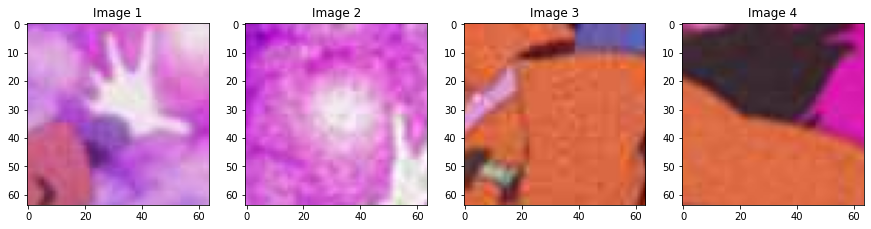

In [ ]:
plot_images(lq_img, 1, 4, figsize=(15, 5))

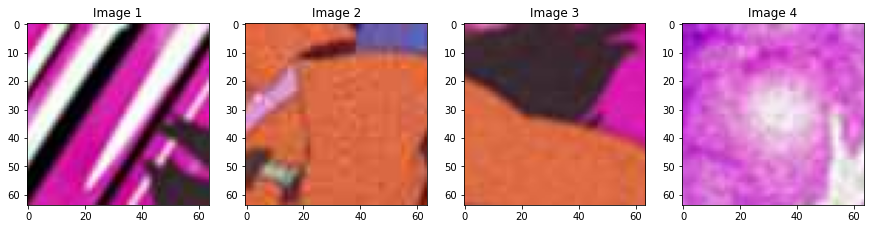

In [ ]:
plot_images(lq_img, 1, 4, figsize=(15, 5))

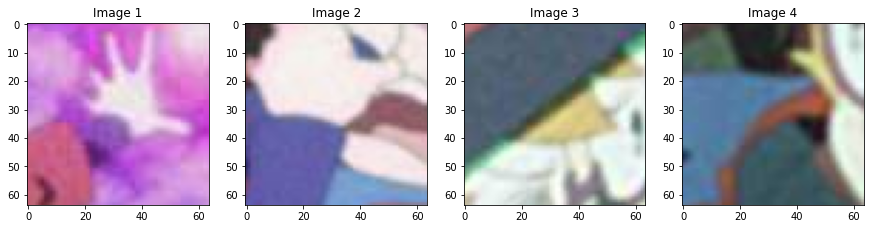

In [ ]:
plot_images(lq_img, 1, 4, figsize=(15, 5))

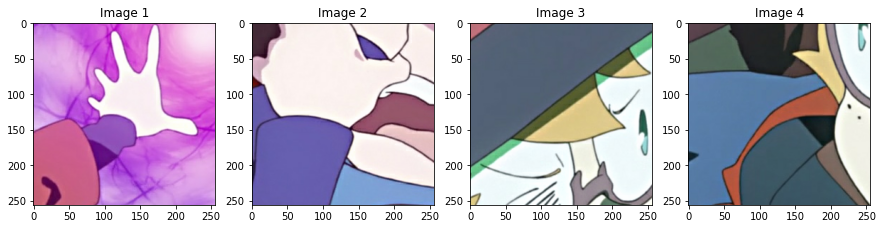

In [ ]:
plot_images(gt_img, 1, 4, figsize=(15, 5))

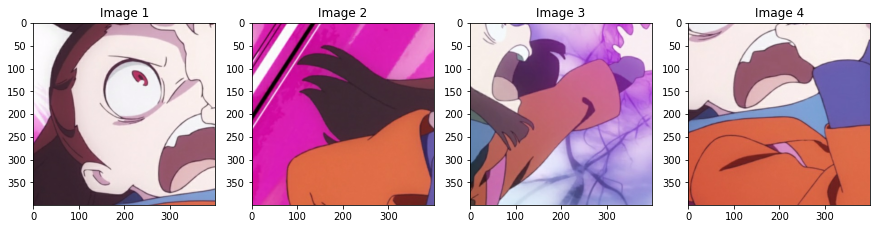

In [ ]:
plot_images(img, 1, 4, figsize=(15, 5))

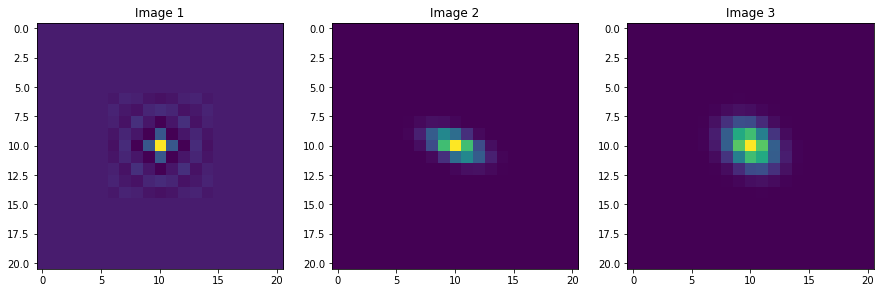

In [ ]:
plot_images(second_kernel, 1, 3, figsize=(15, 5))

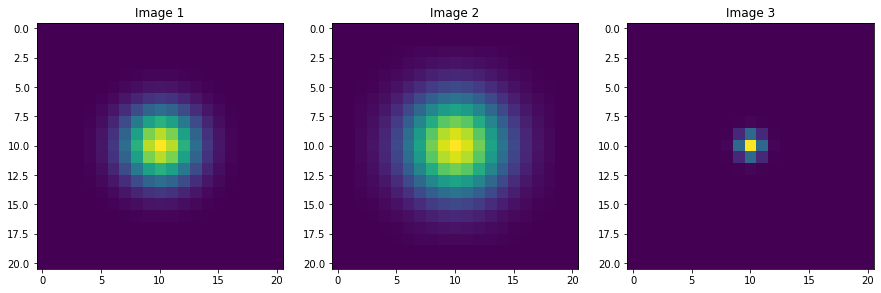

In [ ]:
plot_images(first_kernel, 1, 3, figsize=(15, 5))

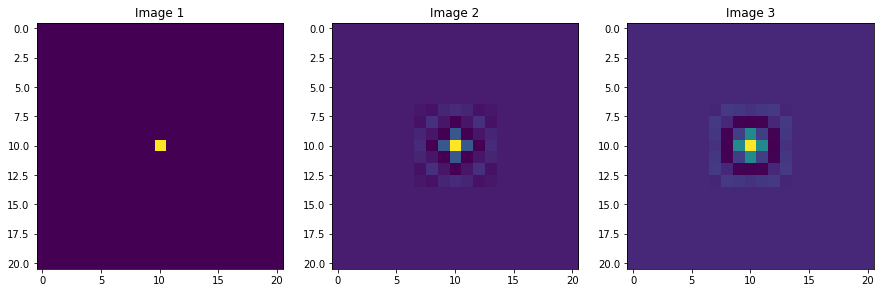

In [ ]:
plot_images(sinc_kernel, 1, 3, figsize=(15, 5))

In [ ]:
# Create test images

In [ ]:
def load_test_image(final_sinc_prob, kernel_props_1, kernel_props_2, crop_pad_size=400):
  def load_image_test_kernels(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_png(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    img = augment_image(img)

    size = tf.shape(img)
    height, width = size[0], size[1]

    if height < crop_pad_size or width < crop_pad_size:
      pad_h = tf.maximum(0, crop_pad_size - height)
      pad_w = tf.maximum(0, crop_pad_size - width)
                
          # height (top and bottom), width (left and right), channels
      padding = [[0, pad_h], [0, pad_w], [0, 0]]
      img = tf.pad(img, padding, "REFLECT") 

    size = tf.shape(img)
    height, width = size[0], size[1]

    top = height - crop_pad_size

    if height > crop_pad_size or width > crop_pad_size:
      if height > width:
        rest = (height - width) // 2
        img = tf.image.crop_to_bounding_box(img, rest, 0, width, width)
      else:
        rest = (width - height) // 2
        img = tf.image.crop_to_bounding_box(img, 0, rest, height, height)

      img = tf.image.resize(img, [crop_pad_size, crop_pad_size])

    first_kernel = generate_kernel(kernel_props_1)
    second_kernel = generate_kernel(kernel_props_2)

    sinc_kernel = generate_sinc_kernel(final_sinc_prob)

    return img, first_kernel, second_kernel, sinc_kernel
    
  return load_image_test_kernels

In [ ]:
load_test_function = load_test_image(final_sinc_prob, kernel_props_1, kernel_props_2)

In [ ]:
test_images_paths = sorted(glob("test_shots/*.png"), key=os.path.getmtime)

In [ ]:
test_dataset = tf.data.Dataset.from_tensor_slices((test_images_paths))
test_dataset = test_dataset.map(load_test_function, num_parallel_calls=tf.data.experimental.AUTOTUNE)

In [ ]:
test_generator = test_dataset.batch(12)

In [ ]:
img, first_kernel, second_kernel, sinc_kernel = next(iter(test_generator))

In [ ]:
gt_img, lq_img = feed_data(img, first_kernel, second_kernel, sinc_kernel, [feed_props_1, feed_props_2])

In [ ]:
for gtim, lqim, name in zip(gt_img, lq_img, test_images_paths):
  name = name.split("/")[-1]
  tf.keras.utils.save_img(f"gt_test_shots/gt_{name}", gtim)
  tf.keras.utils.save_img(f"lq_test_shots/lq_{name}", lqim)

In [ ]:
!zip -qr gt_test_shots.zip gt_test_shots

In [ ]:
!zip -qr lq_test_shots.zip lq_test_shots

# Blocks

In [63]:
# <Blocks>

In [64]:
#! import tensorflow as tf
#! from tensorflow.keras import layers

In [65]:
class ResidualDenseBlock(tf.keras.Model):
  def __init__(self):
    super(ResidualDenseBlock, self).__init__()
    self.conv_1 = layers.Conv2D(32, (3, 3), strides=(1, 1), padding="SAME")
    self.conv_2 = layers.Conv2D(32, (3, 3), strides=(1, 1), padding="SAME")
    self.conv_3 = layers.Conv2D(32, (3, 3), strides=(1, 1), padding="SAME")
    self.conv_4 = layers.Conv2D(32, (3, 3), strides=(1, 1), padding="SAME")
    self.conv_5 = layers.Conv2D(64, (3, 3), strides=(1, 1), padding="SAME")

    self.activation_1 = tf.keras.layers.LeakyReLU(alpha=0.2)
    self.activation_2 = tf.keras.layers.LeakyReLU(alpha=0.2)
    self.activation_3 = tf.keras.layers.LeakyReLU(alpha=0.2)
    self.activation_4 = tf.keras.layers.LeakyReLU(alpha=0.2)
  
  def call(self, x):
    x1 = self.activation_1(self.conv_1(x))
    x2 = self.activation_2(self.conv_2(layers.concatenate([x, x1])))
    x3 = self.activation_3(self.conv_3(layers.concatenate([x, x1, x2])))
    x4 = self.activation_4(self.conv_4(layers.concatenate([x, x1, x2, x3])))
    x5 = self.conv_5(layers.concatenate([x, x1, x2, x3, x4]))

    # Emperically, we use 0.2 to scale the residual for better performance
    return x5 * 0.2 + x

In [66]:
class RRDB(tf.keras.Model):
  def __init__(self):
    super(RRDB, self).__init__()
    self.res_1 = ResidualDenseBlock()
    self.res_2 = ResidualDenseBlock()
    self.res_3 = ResidualDenseBlock()
  
  def call(self, x_input):
    x = self.res_1(x_input)
    x = self.res_2(x)
    x = self.res_3(x)

    return x * 0.2 + x_input

In [67]:
# <BlocksEnd>

# Models

In [68]:
# <Model>

In [69]:
#! import tensorflow as tf
#! import tensorflow_addons as tfa
#! from tensorflow.keras import layers
#! from networks.model_blocks import RRDB

In [70]:
class RRDBNet(tf.keras.Model):
  def __init__(self):
    super(RRDBNet, self).__init__()
    self.first_conv = layers.Conv2D(64, 3, strides=(1, 1), padding="SAME") # padding 1
    self.rb_1 = RRDB()
    self.rb_2 = RRDB()
    self.rb_3 = RRDB()
    self.rb_4 = RRDB()
    self.rb_5 = RRDB()
    self.rb_6 = RRDB()
    self.conv_body = layers.Conv2D(64, 3, strides=(1, 1), padding="SAME") # padding 1

    self.up_1 = layers.UpSampling2D()
    self.conv_1 = layers.Conv2D(64, 3, strides=(1, 1), padding="SAME") # padding 1
    self.activation_1 = tf.keras.layers.LeakyReLU(alpha=0.2)

    self.up_2 = layers.UpSampling2D()
    self.conv_2 = layers.Conv2D(64, 3, strides=(1, 1), padding="SAME") # padding 1
    self.activation_2 = tf.keras.layers.LeakyReLU(alpha=0.2)

    self.conv_3 = layers.Conv2D(64, 3, strides=(1, 1), padding="SAME") # padding 1
    self.activation_3 = tf.keras.layers.LeakyReLU(alpha=0.2)
    self.conv_4 = layers.Conv2D(3, 3, strides=(1, 1), padding="SAME") # padding 1
    
  def call(self, x_input):
    x = self.first_conv(x_input)
    x1 = self.rb_1(x)
    x1 = self.rb_2(x1)
    x1 = self.rb_3(x1)
    x1 = self.rb_4(x1)
    x1 = self.rb_5(x1)
    x1 = self.rb_6(x1)
    x1 = self.conv_body(x1)

    x = x + x1

    x = self.up_1(x)
    x = self.conv_1(x)
    x = self.activation_1(x)

    x = self.up_2(x)
    x = self.conv_2(x)
    x = self.activation_2(x)

    x = self.conv_3(x)
    x = self.activation_3(x)
    x = self.conv_4(x)

    return x

In [71]:
class UNetDiscriminator(tf.keras.Model):
  def __init__(self):
    super(UNetDiscriminator, self).__init__()

    self.conv_0 = tfa.layers.SpectralNormalization(layers.Conv2D(64, 3, strides=(1, 1), padding="SAME", use_bias=False))
    self.conv_1 = tfa.layers.SpectralNormalization(layers.Conv2D(128, 4, strides=(2, 2), padding="SAME", use_bias=False))
    self.conv_2 = tfa.layers.SpectralNormalization(layers.Conv2D(256, 4, strides=(2, 2), padding="SAME", use_bias=False))
    self.conv_3 = tfa.layers.SpectralNormalization(layers.Conv2D(512, 4, strides=(2, 2), padding="SAME", use_bias=False))

    self.conv_4 = tfa.layers.SpectralNormalization(layers.Conv2D(256, 3, strides=(1, 1), padding="SAME", use_bias=False))
    self.conv_5 = tfa.layers.SpectralNormalization(layers.Conv2D(128, 3, strides=(1, 1), padding="SAME", use_bias=False))
    self.conv_6 = tfa.layers.SpectralNormalization(layers.Conv2D(64, 3, strides=(1, 1), padding="SAME", use_bias=False))

    self.conv_7 = tfa.layers.SpectralNormalization(layers.Conv2D(64, 3, strides=(1, 1), padding="SAME", use_bias=False))
    self.conv_8 = tfa.layers.SpectralNormalization(layers.Conv2D(64, 3, strides=(1, 1), padding="SAME", use_bias=False))

    self.conv_9 = tfa.layers.SpectralNormalization(layers.Conv2D(1, 3, strides=(1, 1), padding="SAME", use_bias=False))

  def call(self, x):
    x0 = tf.keras.layers.LeakyReLU(alpha=0.2)(self.conv_0(x)) # 256x256
    x1 = tf.keras.layers.LeakyReLU(alpha=0.2)(self.conv_1(x0)) # 128x128
    x2 = tf.keras.layers.LeakyReLU(alpha=0.2)(self.conv_2(x1))  # 64x64
    x3 = tf.keras.layers.LeakyReLU(alpha=0.2)(self.conv_3(x2)) # 32x32

    x3 = tf.keras.layers.UpSampling2D(interpolation="bilinear")(x3)
    x4 = tf.keras.layers.LeakyReLU(alpha=0.2)(self.conv_4(x3)) # 64x64

    x4 = x4 + x2

    x4 = tf.keras.layers.UpSampling2D(interpolation="bilinear")(x4)
    x5 = tf.keras.layers.LeakyReLU(alpha=0.2)(self.conv_5(x4)) # 128x128

    x5 = x5 + x1

    x5 = tf.keras.layers.UpSampling2D(interpolation="bilinear")(x5)
    x6 = tf.keras.layers.LeakyReLU(alpha=0.2)(self.conv_6(x5)) # 256x256

    x6 = x6 + x0

    out = tf.keras.layers.LeakyReLU(alpha=0.2)(self.conv_7(x6)) # 256x256
    out = tf.keras.layers.LeakyReLU(alpha=0.2)(self.conv_8(out)) # 256x256
    out = self.conv_9(out)

    return out

In [72]:
def create_vgg19_custom_model():
  # Block 1
  input = tf.keras.Input(shape=(None, None, 3))
  x = layers.Conv2D(
      64, (3, 3), padding='same', name='block1_conv1')(
          input)
  x = tf.keras.layers.ReLU()(x)
  x = layers.Conv2D(
      64, (3, 3), padding='same', name='block1_conv2')(x)
  x = tf.keras.layers.ReLU()(x)
  x = layers.MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool')(x)

  # Block 2
  x = layers.Conv2D(
      128, (3, 3), padding='same', name='block2_conv1')(x)
  x = tf.keras.layers.ReLU()(x)
  x = layers.Conv2D(
      128, (3, 3), padding='same', name='block2_conv2')(x)
  x = tf.keras.layers.ReLU()(x)
  x = layers.MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool')(x)

  # Block 3
  x = layers.Conv2D(
      256, (3, 3), padding='same', name='block3_conv1')(x)
  x = tf.keras.layers.ReLU()(x)
  x = layers.Conv2D(
      256, (3, 3), padding='same', name='block3_conv2')(x)
  x = tf.keras.layers.ReLU()(x)
  x = layers.Conv2D(
      256, (3, 3), padding='same', name='block3_conv3')(x)
  x = tf.keras.layers.ReLU()(x)
  x = layers.Conv2D(
      256, (3, 3), padding='same', name='block3_conv4')(x)
  x = tf.keras.layers.ReLU()(x)
  x = layers.MaxPooling2D((2, 2), strides=(2, 2), name='block3_pool')(x)

  # Block 4
  x = layers.Conv2D(
      512, (3, 3), padding='same', name='block4_conv1')(x)
  x = tf.keras.layers.ReLU()(x)
  x = layers.Conv2D(
      512, (3, 3), padding='same', name='block4_conv2')(x)
  x = tf.keras.layers.ReLU()(x)
  x = layers.Conv2D(
      512, (3, 3), padding='same', name='block4_conv3')(x)
  x = tf.keras.layers.ReLU()(x)
  x = layers.Conv2D(
      512, (3, 3), padding='same', name='block4_conv4')(x)
  x = tf.keras.layers.ReLU()(x)
  x = layers.MaxPooling2D((2, 2), strides=(2, 2), name='block4_pool')(x)

  # Block 5
  x = layers.Conv2D(
      512, (3, 3), padding='same', name='block5_conv1')(x)
  x = tf.keras.layers.ReLU()(x)
  x = layers.Conv2D(
      512, (3, 3), padding='same', name='block5_conv2')(x)
  x = tf.keras.layers.ReLU()(x)
  x = layers.Conv2D(
      512, (3, 3), padding='same', name='block5_conv3')(x)
  x = tf.keras.layers.ReLU()(x)
  x = layers.Conv2D(
      512, (3, 3), padding='same', name='block5_conv4')(x)
  x = tf.keras.layers.ReLU()(x)
  x = layers.MaxPooling2D((2, 2), strides=(2, 2), name='block5_pool')(x)

  return tf.keras.Model(input, x, name="vgg19_features")

In [73]:
class Vgg19FeaturesModel(tf.keras.Model):
  def __init__(self):
    super(Vgg19FeaturesModel, self).__init__()
    original_vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
    self.vgg_model = create_vgg19_custom_model()
    self.vgg_model.set_weights(original_vgg.get_weights())

    layers = ["block1_conv2", "block2_conv2", "block3_conv4", "block4_conv4", "block5_conv4"]
    outputs = [self.vgg_model.get_layer(name).output for name in layers]

    self.model = tf.keras.Model([self.vgg_model.input], outputs)
    self.model.trainable = False
      
  def call(self, x):
    x = tf.keras.applications.vgg19.preprocess_input(x * 255.0)
    return self.model(x)

In [74]:
# <ModelEnd>

# Model Test

In [ ]:
# <ModelTest>

In [ ]:
#! import tensorflow as tf
#! from networks.models import RRDBNet, UNetDiscriminator, Vgg19FeaturesModel

import unittest
import builtins

In [ ]:
using_notebook = getattr(builtins, "__IPYTHON__", False)

In [188]:
test_batch_size = 4

In [191]:
class TestModels(unittest.TestCase):
  def setUp(self):
    self.generator_test = RRDBNet()
    self.discriminator_test = UNetDiscriminator()
    self.vgg_test = Vgg19FeaturesModel()

    self.generator_input = tf.random.normal((test_batch_size, 64, 64, 3))
    self.discriminator_input = tf.random.normal((test_batch_size, 256, 256, 3))

    self.generator_output_shape = (test_batch_size, 256, 256, 3)
    self.discriminator_output_shape = (test_batch_size, 256, 256, 1)

  def test_generator(self):
    gen_out = self.generator_test(self.generator_input)
    self.assertEqual(gen_out.shape, self.generator_output_shape)

  def test_discriminator(self):
    disc_out = self.discriminator_test(self.discriminator_input)
    self.assertEqual(disc_out.shape, self.discriminator_output_shape)

  def test_vgg(self):
    vgg_out = self.vgg_test(self.discriminator_input)

    self.assertEqual(vgg_out[0].shape, (test_batch_size, 256, 256, 64))
    self.assertEqual(vgg_out[1].shape, (test_batch_size, 128, 128, 128))
    self.assertEqual(vgg_out[2].shape, (test_batch_size, 64, 64, 256))
    self.assertEqual(vgg_out[3].shape, (test_batch_size, 32, 32, 512))
    self.assertEqual(vgg_out[4].shape, (test_batch_size, 16, 16, 512))

In [ ]:
if __name__ == "__main__" and not using_notebook:
  unittest.main()

In [ ]:
# <ModelTestEnd>

In [194]:
unittest.main(TestModels(), argv=[''], verbosity=2, exit=False)

test_discriminator (__main__.TestModels) ... ok
test_generator (__main__.TestModels) ... ok
test_vgg (__main__.TestModels) ... ok

----------------------------------------------------------------------
Ran 3 tests in 2.784s

OK


# Loss Functions

In [75]:
# <Loss>

In [76]:
#! import tensorflow as tf

In [77]:
def compute_l1_loss(y_true, y_fake):
  return tf.reduce_mean(tf.math.abs(y_true - y_fake))

In [78]:
def compute_perceptual_loss(y_list, y_trans_list):
  vgg_layers_weights = [0.1, 0.1, 1, 1, 1]
  loss = 0

  for feature_map_y, feature_map_y_trans, layer_weight in zip(y_list, y_trans_list, vgg_layers_weights):
    loss += tf.reduce_mean(tf.math.abs(feature_map_y - feature_map_y_trans)) * layer_weight
  
  return loss

In [215]:
def compute_gan_loss(real_logits, generated_logits, generator_loss_weight=1e-1, from_logits=True):
  real_labels = tf.ones_like(real_logits)
  generated_labels = tf.zeros_like(real_logits)

  generator_loss = tf.keras.losses.binary_crossentropy(
      real_labels, generated_logits, from_logits=from_logits
  )
  
  disc_real_loss = tf.keras.losses.binary_crossentropy(
      real_labels, real_logits, from_logits=from_logits
  )

  disc_fake_loss = tf.keras.losses.binary_crossentropy(
      generated_labels, generated_logits, from_logits=from_logits
  )

  discriminator_loss = disc_real_loss + disc_fake_loss

  return tf.reduce_mean(generator_loss) * generator_loss_weight, tf.reduce_mean(discriminator_loss)

In [80]:
# <LossEnd>

# Loss Testing

In [ ]:
# <LossTest>

In [ ]:
#! import tensorflow as tf

In [ ]:
#! from networks.loss_functions import compute_l1_loss, compute_perceptual_loss, compute_gan_loss

In [ ]:
import unittest
import builtins

In [ ]:
using_notebook = getattr(builtins, "__IPYTHON__", False)

In [195]:
test_batch_size = 4

In [219]:
class TestLossFunction(unittest.TestCase):
  def test_l1_loss(self):
    rand_input = tf.random.normal((test_batch_size, 256, 256, 3))
    same_out = compute_l1_loss(rand_input, rand_input)
    diff_out = compute_l1_loss(rand_input, rand_input - 1)

    self.assertEqual(same_out, 0)
    self.assertNotEqual(diff_out, 0)

  def test_gan_loss(self):
    ones = tf.ones((test_batch_size, 256, 256, 1))
    zeros = tf.zeros((test_batch_size, 256, 256, 1))

    gen_loss, disc_loss = compute_gan_loss(ones, zeros, from_logits=False)

    self.assertEqual(disc_loss, 0)
    self.assertTrue(gen_loss > 0)

    gen_loss, disc_loss = compute_gan_loss(ones, ones, from_logits=False)

    self.assertTrue(disc_loss > 0)
    self.assertEqual(gen_loss, 0)

    gen_loss, disc_loss = compute_gan_loss(zeros, ones, from_logits=False)

    self.assertTrue(disc_loss > 0)

In [ ]:
if __name__ == "__main__" and not using_notebook:
  unittest.main()

In [220]:
# <LossTestEnd>

In [221]:
unittest.main(TestLossFunction(), argv=[''], verbosity=2, exit=False)

test_gan_loss (__main__.TestLossFunction) ... ok
test_l1_loss (__main__.TestLossFunction) ... ok

----------------------------------------------------------------------
Ran 2 tests in 0.019s

OK


# Training Utils

In [81]:
# <TrainingUtils>

In [82]:
#! import tensorflow as tf

#! from networks.loss_functions import compute_l1_loss, compute_gan_loss, compute_perceptual_loss

In [83]:
def no_gan_inner_step(gt_images,
                      lq_images,
                      main_model,
                      optimizer):
  with tf.GradientTape() as tape:
    generated_images = main_model(lq_images)
    loss = compute_l1_loss(gt_images, generated_images)

  gradients = tape.gradient(loss, main_model.trainable_variables)

  optimizer.apply_gradients(zip(gradients, main_model.trainable_variables))

  return loss

In [84]:
def gan_inner_step(gt_images, usm_gt_images, lq_images, generator, discriminator, vgg_model, gen_opt, disc_opt):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_images = generator(lq_images)
    l1_loss = compute_l1_loss(usm_gt_images, generated_images)

    true_features = vgg_model(usm_gt_images)
    fake_features = vgg_model(tf.clip_by_value(generated_images, 0.0, 1.0))

    perceptual_loss = compute_perceptual_loss(true_features, fake_features)

    true_logits = discriminator(gt_images)
    fake_logits = discriminator(generated_images)

    gen_loss, disc_loss = compute_gan_loss(true_logits, fake_logits)

    total_generator_loss = gen_loss + perceptual_loss + l1_loss

  generator_gradients = gen_tape.gradient(total_generator_loss, generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

  gen_opt.apply_gradients(zip(generator_gradients, generator.trainable_variables))
  disc_opt.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

  return total_generator_loss, gen_loss, perceptual_loss, l1_loss, disc_loss

In [85]:
class AverageModelWeights():
  def __init__(self, model, weights, decay=0.999):
    self.ema_model = model
    self.decay = decay

    self.ema_model.set_weights(weights) 
  
  def compute_ema_weights(self, normal_model):
    normal_weights = normal_model.get_weights()
    weights = self.ema_model.get_weights()

    weights_list = [weight * self.decay + normal_weight * (1 - self.decay) for normal_weight, weight in zip(normal_weights, weights)]

    self.ema_model.set_weights(weights_list)

In [ ]:
# def lr_decay(optimizer, learning_rate):
#   current_lr = optimizer.lr
#   new_lr = current_lr - (learning_rate / 8000)
#   optimizer.lr = new_lr

#   return optimizer

In [ ]:
# <TrainingUtilsEnd>

# Training Test

# Training

In [ ]:
# <Train>

In [86]:
#! import tensorflow as tf
#! import time
#! import os
#! from train_utils import no_gan_inner_step, AverageModelWeights

In [87]:
#! from networks.models import RRDBNet
#! from data_generator.data_generator import train_dataset, feed_data, PoolData
#! from data_generator.data_generator import feed_props_1, feed_props_2, train_images_paths
#! from data_generator.data_utils import usm_sharpener

In [88]:
import argparse
import builtins

In [89]:
parser = argparse.ArgumentParser()

In [90]:
parser.add_argument('--epochs', type=int, default=12000, help='Number of epochs to train the model')
parser.add_argument('--batch_size', type=int, default=14, help='Number batches')
parser.add_argument('--continue_training', default=True, action='store_true', help='Use training checkpoints to continue training the model')
parser.add_argument('--save_gan_model', default=True, action='store_true', help='Save the generator model')
parser.add_argument('--save_ema_model', default=True, action='store_true', help='Save the generator ema model')

_StoreTrueAction(option_strings=['--save_ema_model'], dest='save_ema_model', nargs=0, const=True, default=True, type=None, choices=None, help='Save the generator ema model', metavar=None)

In [91]:
using_notebook = getattr(builtins, "__IPYTHON__", False)

In [92]:
opts = parser.parse_args([]) if using_notebook else parser.parse_args()

In [93]:
batch_size = opts.batch_size
epochs = opts.epochs
lr = 2e-4

optimizer = tf.keras.optimizers.Adam(learning_rate=lr, beta_1=0.9, beta_2=0.99)

pool_size = 182

In [ ]:
no_gan_model = RRDBNet()
no_gan_model.build((None, 256, 256, 3))

In [ ]:
ema_no_gan_model = RRDBNet()
ema_no_gan_model.build((None, 256, 256, 3))

In [ ]:
# When called, ema_no_gan_model will have the same weights as no_gan_model
# if we have checkpoints available, the value of the inner model ema_no_gan_model
# will change to the model saved in the checkpoints
ema_api = AverageModelWeights(ema_no_gan_model, no_gan_model.get_weights())

In [ ]:
train_generator = train_dataset.batch(batch_size)

In [ ]:
pool_train_data = PoolData(pool_size, batch_size)

### Checkpoints

In [ ]:
checkpoint_dir = './training_checkpoints'
ema_checkpoint_dir = './ema_training_checkpoints'

In [ ]:
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(model=no_gan_model, optimizer=optimizer)

In [ ]:
ema_checkpoint_prefix = os.path.join(ema_checkpoint_dir, "ema_ckpt")
ema_checkpoint = tf.train.Checkpoint(model=ema_no_gan_model)

In [ ]:
if opts.continue_training:
  print("loading training checkpoints: ")                   
  print(tf.train.latest_checkpoint(checkpoint_dir))
  checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

  print("loading EMA training checkpoints: ")                   
  print(tf.train.latest_checkpoint(ema_checkpoint_dir))
  ema_checkpoint.restore(tf.train.latest_checkpoint(ema_checkpoint_dir))

loading training checkpoints: 
./training_checkpoints/ckpt-880
loading EMA training checkpoints: 
./ema_training_checkpoints/ema_ckpt-830


### Train

In [ ]:
@tf.function
def train_step(gt_images, lq_images):
  return no_gan_inner_step(gt_images,
                      lq_images,
                      no_gan_model,
                      optimizer)

In [ ]:
epochs = opts.epochs
start_epoch = 0

In [ ]:
train_steps = int(len(train_images_paths) // batch_size)

In [ ]:
pool_train_data = PoolData(pool_size, batch_size)

In [ ]:
train_loss_metric = tf.keras.metrics.Mean()
loss_results = []

In [ ]:
def train(epochs):
  for epoch in range(start_epoch, epochs):
    train_loss_metric.reset_states()
    epoch_time = time.time()
    batch_time = time.time()
    step = 0
    
    epoch_count = f"0{epoch + 1}/{epochs}" if epoch < 9 else f"{epoch + 1}/{epochs}"

    for img, first_kernel, second_kernel, sinc_kernel in train_generator:
      gt_img, lq_img = feed_data(img, first_kernel, second_kernel, sinc_kernel, [feed_props_1, feed_props_2])
      gt_img, lq_img = pool_train_data.get_pool_data(gt_img, lq_img)
      gt_img = usm_sharpener.sharp(gt_img)
      loss = train_step(gt_img, lq_img)

      print('\r', 'Epoch', epoch_count, '| Step', f"{step}/{train_steps}",
            '| Loss:', f"{loss:.5f}", "| Step Time:", f"{time.time() - batch_time:.2f}", end='')  
      
      train_loss_metric.update_state(loss)
      loss = train_loss_metric.result().numpy()
      step += 1

      loss_results.append(loss)

      batch_time = time.time()

    checkpoint.save(file_prefix=checkpoint_prefix)
    ema_api.compute_ema_weights(no_gan_model)
    ema_checkpoint.save(file_prefix=ema_checkpoint_prefix)

    print('\r', 'Epoch', epoch_count, '| Step', f"{step}/{train_steps}",
          '| Loss:', f"{loss:.5f}", "| Epoch Time:", f"{time.time() - epoch_time:.2f}")

In [ ]:
#! train(epochs)

In [ ]:
if opts.save_gan_model:
  no_gan_model.save_weights('./checkpoint_weights/last_weights')

In [ ]:
if opts.save_ema_model:
  ema_no_gan_model.save("no_gan_ema_model")

In [ ]:
# <TrainEnd>

In [ ]:
plot_images(output_img, 3, 4, figsize=(15, 15))

In [ ]:
# train_steps
# iterations = 1000000

In [ ]:
train(50)

 Epoch 01/50 | Step 147/147 | Loss: 0.07057 | Epoch Time: 271.28
INFO:tensorflow:Assets written to: ./training_av_checkpoints/assets
 Epoch 02/50 | Step 147/147 | Loss: 0.05907 | Epoch Time: 250.15
INFO:tensorflow:Assets written to: ./training_av_checkpoints/assets
 Epoch 03/50 | Step 147/147 | Loss: 0.05476 | Epoch Time: 262.57
INFO:tensorflow:Assets written to: ./training_av_checkpoints/assets
 Epoch 04/50 | Step 147/147 | Loss: 0.05237 | Epoch Time: 221.75
INFO:tensorflow:Assets written to: ./training_av_checkpoints/assets
 Epoch 05/50 | Step 147/147 | Loss: 0.05029 | Epoch Time: 262.58
INFO:tensorflow:Assets written to: ./training_av_checkpoints/assets
 Epoch 06/50 | Step 147/147 | Loss: 0.04865 | Epoch Time: 210.56
INFO:tensorflow:Assets written to: ./training_av_checkpoints/assets
 Epoch 07/50 | Step 147/147 | Loss: 0.04751 | Epoch Time: 230.36
INFO:tensorflow:Assets written to: ./training_av_checkpoints/assets
 Epoch 08/50 | Step 147/147 | Loss: 0.04660 | Epoch Time: 262.58
INFO

In [ ]:
train(25)

 Epoch 01/25 | Step 147/147 | Loss: 0.03261 | Epoch Time: 202.74
 Epoch 02/25 | Step 147/147 | Loss: 0.03283 | Epoch Time: 181.24
 Epoch 03/25 | Step 147/147 | Loss: 0.03290 | Epoch Time: 188.32
 Epoch 04/25 | Step 147/147 | Loss: 0.03277 | Epoch Time: 202.97
 Epoch 05/25 | Step 147/147 | Loss: 0.03269 | Epoch Time: 182.58
 Epoch 06/25 | Step 147/147 | Loss: 0.03267 | Epoch Time: 202.77
 Epoch 07/25 | Step 147/147 | Loss: 0.03272 | Epoch Time: 179.89
 Epoch 08/25 | Step 147/147 | Loss: 0.03258 | Epoch Time: 186.85
 Epoch 09/25 | Step 147/147 | Loss: 0.03250 | Epoch Time: 202.79
 Epoch 10/25 | Step 147/147 | Loss: 0.03251 | Epoch Time: 202.79
 Epoch 11/25 | Step 147/147 | Loss: 0.03248 | Epoch Time: 202.77
 Epoch 12/25 | Step 147/147 | Loss: 0.03249 | Epoch Time: 202.77
 Epoch 13/25 | Step 147/147 | Loss: 0.03234 | Epoch Time: 201.38
 Epoch 14/25 | Step 147/147 | Loss: 0.03232 | Epoch Time: 192.34
 Epoch 15/25 | Step 147/147 | Loss: 0.03226 | Epoch Time: 193.86
 Epoch 16/25 | Step 147/1

In [ ]:
train(20)

 Epoch 01/20 | Step 147/147 | Loss: 0.03118 | Epoch Time: 202.81
 Epoch 02/20 | Step 147/147 | Loss: 0.03101 | Epoch Time: 179.08
 Epoch 03/20 | Step 147/147 | Loss: 0.03100 | Epoch Time: 202.78
 Epoch 04/20 | Step 147/147 | Loss: 0.03131 | Epoch Time: 202.78
 Epoch 05/20 | Step 147/147 | Loss: 0.03118 | Epoch Time: 184.16
 Epoch 06/20 | Step 147/147 | Loss: 0.03122 | Epoch Time: 190.83
 Epoch 07/20 | Step 147/147 | Loss: 0.03108 | Epoch Time: 202.75
 Epoch 08/20 | Step 147/147 | Loss: 0.03102 | Epoch Time: 191.64
 Epoch 09/20 | Step 147/147 | Loss: 0.03108 | Epoch Time: 202.78
 Epoch 10/20 | Step 147/147 | Loss: 0.03110 | Epoch Time: 185.08
 Epoch 11/20 | Step 147/147 | Loss: 0.03113 | Epoch Time: 202.77
 Epoch 12/20 | Step 147/147 | Loss: 0.03115 | Epoch Time: 190.67
 Epoch 13/20 | Step 147/147 | Loss: 0.03113 | Epoch Time: 187.33
 Epoch 14/20 | Step 147/147 | Loss: 0.03115 | Epoch Time: 202.76
 Epoch 15/20 | Step 147/147 | Loss: 0.03114 | Epoch Time: 194.30
 Epoch 16/20 | Step 147/1

In [ ]:
train(15)

 Epoch 01/15 | Step 147/147 | Loss: 0.03030 | Epoch Time: 211.94
 Epoch 02/15 | Step 147/147 | Loss: 0.03048 | Epoch Time: 203.67
 Epoch 03/15 | Step 147/147 | Loss: 0.03055 | Epoch Time: 202.78
 Epoch 04/15 | Step 147/147 | Loss: 0.03055 | Epoch Time: 202.77
 Epoch 05/15 | Step 147/147 | Loss: 0.03062 | Epoch Time: 173.39
 Epoch 06/15 | Step 147/147 | Loss: 0.03058 | Epoch Time: 202.78
 Epoch 07/15 | Step 147/147 | Loss: 0.03065 | Epoch Time: 262.79
 Epoch 08/15 | Step 147/147 | Loss: 0.03070 | Epoch Time: 196.32
 Epoch 09/15 | Step 147/147 | Loss: 0.03069 | Epoch Time: 195.25
 Epoch 10/15 | Step 147/147 | Loss: 0.03072 | Epoch Time: 188.08
 Epoch 11/15 | Step 147/147 | Loss: 0.03085 | Epoch Time: 174.36
 Epoch 12/15 | Step 147/147 | Loss: 0.03082 | Epoch Time: 202.76
 Epoch 13/15 | Step 147/147 | Loss: 0.03085 | Epoch Time: 189.04
 Epoch 14/15 | Step 147/147 | Loss: 0.03085 | Epoch Time: 181.74
 Epoch 15/15 | Step 147/147 | Loss: 0.03080 | Epoch Time: 188.29


In [ ]:
train(10)

 Epoch 01/10 | Step 147/147 | Loss: 0.02995 | Epoch Time: 187.59
 Epoch 02/10 | Step 147/147 | Loss: 0.02976 | Epoch Time: 209.51
 Epoch 03/10 | Step 147/147 | Loss: 0.03003 | Epoch Time: 202.73
 Epoch 04/10 | Step 147/147 | Loss: 0.03024 | Epoch Time: 202.73
 Epoch 05/10 | Step 147/147 | Loss: 0.03038 | Epoch Time: 202.76
 Epoch 06/10 | Step 147/147 | Loss: 0.03024 | Epoch Time: 202.77
 Epoch 07/10 | Step 147/147 | Loss: 0.03036 | Epoch Time: 188.98
 Epoch 08/10 | Step 147/147 | Loss: 0.03041 | Epoch Time: 202.74
 Epoch 09/10 | Step 147/147 | Loss: 0.03045 | Epoch Time: 175.78
 Epoch 10/10 | Step 147/147 | Loss: 0.03033 | Epoch Time: 202.74


In [ ]:
train(50)

 Epoch 01/50 | Step 147/147 | Loss: 0.02834 | Epoch Time: 323.35
 Epoch 02/50 | Step 147/147 | Loss: 0.02877 | Epoch Time: 323.18
 Epoch 03/50 | Step 147/147 | Loss: 0.02848 | Epoch Time: 271.84
 Epoch 04/50 | Step 147/147 | Loss: 0.02871 | Epoch Time: 263.18
 Epoch 05/50 | Step 147/147 | Loss: 0.02880 | Epoch Time: 259.80
 Epoch 06/50 | Step 147/147 | Loss: 0.02870 | Epoch Time: 263.18
 Epoch 07/50 | Step 147/147 | Loss: 0.02863 | Epoch Time: 252.04
 Epoch 08/50 | Step 147/147 | Loss: 0.02855 | Epoch Time: 255.37
 Epoch 09/50 | Step 147/147 | Loss: 0.02844 | Epoch Time: 245.85
 Epoch 10/50 | Step 147/147 | Loss: 0.02841 | Epoch Time: 263.20
 Epoch 11/50 | Step 147/147 | Loss: 0.02843 | Epoch Time: 250.81
 Epoch 12/50 | Step 147/147 | Loss: 0.02844 | Epoch Time: 244.43
 Epoch 13/50 | Step 147/147 | Loss: 0.02856 | Epoch Time: 240.07
 Epoch 14/50 | Step 147/147 | Loss: 0.02848 | Epoch Time: 239.51
 Epoch 15/50 | Step 147/147 | Loss: 0.02849 | Epoch Time: 216.46
 Epoch 16/50 | Step 147/1

In [ ]:
train(50)

 Epoch 01/50 | Step 147/147 | Loss: 0.02886 | Epoch Time: 323.18
 Epoch 02/50 | Step 147/147 | Loss: 0.02863 | Epoch Time: 225.03
 Epoch 03/50 | Step 147/147 | Loss: 0.02853 | Epoch Time: 262.86
 Epoch 04/50 | Step 147/147 | Loss: 0.02849 | Epoch Time: 262.87
 Epoch 05/50 | Step 147/147 | Loss: 0.02837 | Epoch Time: 262.90
 Epoch 06/50 | Step 147/147 | Loss: 0.02832 | Epoch Time: 202.90
 Epoch 07/50 | Step 147/147 | Loss: 0.02821 | Epoch Time: 205.60
 Epoch 08/50 | Step 147/147 | Loss: 0.02813 | Epoch Time: 178.63
 Epoch 09/50 | Step 147/147 | Loss: 0.02812 | Epoch Time: 262.90
 Epoch 10/50 | Step 147/147 | Loss: 0.02811 | Epoch Time: 202.90
 Epoch 11/50 | Step 147/147 | Loss: 0.02811 | Epoch Time: 202.95
 Epoch 12/50 | Step 147/147 | Loss: 0.02808 | Epoch Time: 262.96
 Epoch 13/50 | Step 147/147 | Loss: 0.02805 | Epoch Time: 202.94
 Epoch 14/50 | Step 147/147 | Loss: 0.02806 | Epoch Time: 202.92
 Epoch 15/50 | Step 147/147 | Loss: 0.02802 | Epoch Time: 169.08
 Epoch 16/50 | Step 147/1

In [ ]:
train(15)

 Epoch 01/15 | Step 147/147 | Loss: 0.02629 | Epoch Time: 203.07
 Epoch 02/15 | Step 147/147 | Loss: 0.02690 | Epoch Time: 181.13
 Epoch 03/15 | Step 147/147 | Loss: 0.02699 | Epoch Time: 172.64
 Epoch 04/15 | Step 147/147 | Loss: 0.02716 | Epoch Time: 185.74
 Epoch 05/15 | Step 147/147 | Loss: 0.02713 | Epoch Time: 192.84
 Epoch 06/15 | Step 147/147 | Loss: 0.02699 | Epoch Time: 202.92
 Epoch 07/15 | Step 147/147 | Loss: 0.02699 | Epoch Time: 202.89
 Epoch 08/15 | Step 147/147 | Loss: 0.02709 | Epoch Time: 164.73
 Epoch 09/15 | Step 147/147 | Loss: 0.02713 | Epoch Time: 183.12
 Epoch 10/15 | Step 147/147 | Loss: 0.02709 | Epoch Time: 188.13
 Epoch 11/15 | Step 147/147 | Loss: 0.02709 | Epoch Time: 202.90
 Epoch 12/15 | Step 147/147 | Loss: 0.02705 | Epoch Time: 202.89
 Epoch 13/15 | Step 147/147 | Loss: 0.02713 | Epoch Time: 192.58
 Epoch 14/15 | Step 147/147 | Loss: 0.02718 | Epoch Time: 202.90
 Epoch 15/15 | Step 147/147 | Loss: 0.02720 | Epoch Time: 187.46


In [ ]:
train(15)

 Epoch 01/15 | Step 147/147 | Loss: 0.02701 | Epoch Time: 191.96
 Epoch 02/15 | Step 147/147 | Loss: 0.02673 | Epoch Time: 181.14
 Epoch 03/15 | Step 147/147 | Loss: 0.02665 | Epoch Time: 202.91
 Epoch 04/15 | Step 147/147 | Loss: 0.02678 | Epoch Time: 202.89
 Epoch 05/15 | Step 147/147 | Loss: 0.02675 | Epoch Time: 188.46
 Epoch 06/15 | Step 147/147 | Loss: 0.02671 | Epoch Time: 184.46
 Epoch 07/15 | Step 147/147 | Loss: 0.02683 | Epoch Time: 202.89
 Epoch 08/15 | Step 147/147 | Loss: 0.02692 | Epoch Time: 179.86
 Epoch 09/15 | Step 147/147 | Loss: 0.02693 | Epoch Time: 202.89
 Epoch 10/15 | Step 147/147 | Loss: 0.02688 | Epoch Time: 169.29
 Epoch 11/15 | Step 147/147 | Loss: 0.02688 | Epoch Time: 190.77
 Epoch 12/15 | Step 147/147 | Loss: 0.02691 | Epoch Time: 202.91
 Epoch 13/15 | Step 147/147 | Loss: 0.02688 | Epoch Time: 166.27
 Epoch 14/15 | Step 147/147 | Loss: 0.02683 | Epoch Time: 202.93
 Epoch 15/15 | Step 147/147 | Loss: 0.02673 | Epoch Time: 202.89


In [ ]:
train(15)

 Epoch 01/15 | Step 147/147 | Loss: 0.02643 | Epoch Time: 192.12
 Epoch 02/15 | Step 147/147 | Loss: 0.02650 | Epoch Time: 202.89
 Epoch 03/15 | Step 147/147 | Loss: 0.02625 | Epoch Time: 202.89
 Epoch 04/15 | Step 147/147 | Loss: 0.02639 | Epoch Time: 178.96
 Epoch 05/15 | Step 147/147 | Loss: 0.02649 | Epoch Time: 190.54
 Epoch 06/15 | Step 147/147 | Loss: 0.02650 | Epoch Time: 203.06
 Epoch 07/15 | Step 147/147 | Loss: 0.02660 | Epoch Time: 202.89
 Epoch 08/15 | Step 147/147 | Loss: 0.02660 | Epoch Time: 202.88
 Epoch 09/15 | Step 147/147 | Loss: 0.02660 | Epoch Time: 179.94
 Epoch 10/15 | Step 147/147 | Loss: 0.02658 | Epoch Time: 189.66
 Epoch 11/15 | Step 147/147 | Loss: 0.02653 | Epoch Time: 202.91
 Epoch 12/15 | Step 147/147 | Loss: 0.02652 | Epoch Time: 188.99
 Epoch 13/15 | Step 147/147 | Loss: 0.02646 | Epoch Time: 166.11
 Epoch 14/15 | Step 147/147 | Loss: 0.02648 | Epoch Time: 202.95
 Epoch 15/15 | Step 147/147 | Loss: 0.02652 | Epoch Time: 202.91


In [ ]:
train(15)

 Epoch 01/15 | Step 147/147 | Loss: 0.02639 | Epoch Time: 202.91
 Epoch 02/15 | Step 147/147 | Loss: 0.02635 | Epoch Time: 190.29
 Epoch 03/15 | Step 147/147 | Loss: 0.02670 | Epoch Time: 169.47
 Epoch 04/15 | Step 147/147 | Loss: 0.02683 | Epoch Time: 202.90
 Epoch 05/15 | Step 147/147 | Loss: 0.02674 | Epoch Time: 202.93
 Epoch 06/15 | Step 147/147 | Loss: 0.02678 | Epoch Time: 202.93
 Epoch 07/15 | Step 147/147 | Loss: 0.02675 | Epoch Time: 172.41
 Epoch 08/15 | Step 147/147 | Loss: 0.02680 | Epoch Time: 182.96
 Epoch 09/15 | Step 147/147 | Loss: 0.02681 | Epoch Time: 202.91
 Epoch 10/15 | Step 147/147 | Loss: 0.02670 | Epoch Time: 202.93
 Epoch 11/15 | Step 147/147 | Loss: 0.02666 | Epoch Time: 180.27
 Epoch 12/15 | Step 147/147 | Loss: 0.02669 | Epoch Time: 162.40
 Epoch 13/15 | Step 147/147 | Loss: 0.02667 | Epoch Time: 202.94
 Epoch 14/15 | Step 147/147 | Loss: 0.02666 | Epoch Time: 180.83
 Epoch 15/15 | Step 147/147 | Loss: 0.02666 | Epoch Time: 202.90


In [ ]:
train(15)

 Epoch 01/15 | Step 147/147 | Loss: 0.02597 | Epoch Time: 202.92
 Epoch 02/15 | Step 147/147 | Loss: 0.02653 | Epoch Time: 179.42
 Epoch 03/15 | Step 147/147 | Loss: 0.02656 | Epoch Time: 186.72
 Epoch 04/15 | Step 147/147 | Loss: 0.02656 | Epoch Time: 202.89
 Epoch 05/15 | Step 147/147 | Loss: 0.02643 | Epoch Time: 198.53
 Epoch 06/15 | Step 147/147 | Loss: 0.02648 | Epoch Time: 202.88
 Epoch 07/15 | Step 147/147 | Loss: 0.02636 | Epoch Time: 202.93
 Epoch 08/15 | Step 147/147 | Loss: 0.02640 | Epoch Time: 202.91
 Epoch 09/15 | Step 147/147 | Loss: 0.02635 | Epoch Time: 192.02
 Epoch 10/15 | Step 147/147 | Loss: 0.02640 | Epoch Time: 203.08
 Epoch 11/15 | Step 147/147 | Loss: 0.02632 | Epoch Time: 193.53
 Epoch 12/15 | Step 147/147 | Loss: 0.02635 | Epoch Time: 182.62
 Epoch 13/15 | Step 147/147 | Loss: 0.02636 | Epoch Time: 169.00
 Epoch 14/15 | Step 147/147 | Loss: 0.02635 | Epoch Time: 177.70
 Epoch 15/15 | Step 147/147 | Loss: 0.02642 | Epoch Time: 171.10


In [ ]:
train(15)

 Epoch 01/15 | Step 147/147 | Loss: 0.02690 | Epoch Time: 202.91
 Epoch 02/15 | Step 147/147 | Loss: 0.02729 | Epoch Time: 178.36
 Epoch 03/15 | Step 147/147 | Loss: 0.02709 | Epoch Time: 202.93
 Epoch 04/15 | Step 147/147 | Loss: 0.02698 | Epoch Time: 186.00
 Epoch 05/15 | Step 147/147 | Loss: 0.02716 | Epoch Time: 202.90
 Epoch 06/15 | Step 147/147 | Loss: 0.02705 | Epoch Time: 202.92
 Epoch 07/15 | Step 147/147 | Loss: 0.02701 | Epoch Time: 181.78
 Epoch 08/15 | Step 147/147 | Loss: 0.02695 | Epoch Time: 177.57
 Epoch 09/15 | Step 147/147 | Loss: 0.02687 | Epoch Time: 202.91
 Epoch 10/15 | Step 147/147 | Loss: 0.02677 | Epoch Time: 179.46
 Epoch 11/15 | Step 147/147 | Loss: 0.02680 | Epoch Time: 176.90
 Epoch 12/15 | Step 147/147 | Loss: 0.02676 | Epoch Time: 180.50
 Epoch 13/15 | Step 147/147 | Loss: 0.02674 | Epoch Time: 187.52
 Epoch 14/15 | Step 147/147 | Loss: 0.02676 | Epoch Time: 177.08
 Epoch 15/15 | Step 147/147 | Loss: 0.02668 | Epoch Time: 202.91


In [ ]:
train(15)

 Epoch 01/15 | Step 147/147 | Loss: 0.02644 | Epoch Time: 191.29
 Epoch 02/15 | Step 147/147 | Loss: 0.02633 | Epoch Time: 179.95
 Epoch 03/15 | Step 147/147 | Loss: 0.02636 | Epoch Time: 182.52
 Epoch 04/15 | Step 147/147 | Loss: 0.02628 | Epoch Time: 189.95
 Epoch 05/15 | Step 147/147 | Loss: 0.02613 | Epoch Time: 202.93
 Epoch 06/15 | Step 147/147 | Loss: 0.02624 | Epoch Time: 202.94
 Epoch 07/15 | Step 147/147 | Loss: 0.02609 | Epoch Time: 189.84
 Epoch 08/15 | Step 147/147 | Loss: 0.02615 | Epoch Time: 202.92
 Epoch 09/15 | Step 147/147 | Loss: 0.02623 | Epoch Time: 202.89
 Epoch 10/15 | Step 147/147 | Loss: 0.02627 | Epoch Time: 202.91
 Epoch 11/15 | Step 147/147 | Loss: 0.02631 | Epoch Time: 177.40
 Epoch 12/15 | Step 147/147 | Loss: 0.02628 | Epoch Time: 178.27
 Epoch 13/15 | Step 147/147 | Loss: 0.02622 | Epoch Time: 193.94
 Epoch 14/15 | Step 147/147 | Loss: 0.02622 | Epoch Time: 202.91
 Epoch 15/15 | Step 147/147 | Loss: 0.02623 | Epoch Time: 203.04


In [ ]:
train(5)

 Epoch 01/5 | Step 147/147 | Loss: 0.02642 | Epoch Time: 180.14
 Epoch 02/5 | Step 147/147 | Loss: 0.02595 | Epoch Time: 195.43
 Epoch 03/5 | Step 147/147 | Loss: 0.02620 | Epoch Time: 202.90
 Epoch 04/5 | Step 147/147 | Loss: 0.02594 | Epoch Time: 202.92
 Epoch 05/5 | Step 147/147 | Loss: 0.02598 | Epoch Time: 202.90


In [ ]:
train(10)

 Epoch 01/10 | Step 147/147 | Loss: 0.02687 | Epoch Time: 189.49
 Epoch 02/10 | Step 147/147 | Loss: 0.02677 | Epoch Time: 181.68
 Epoch 03/10 | Step 147/147 | Loss: 0.02642 | Epoch Time: 202.91
 Epoch 04/10 | Step 147/147 | Loss: 0.02619 | Epoch Time: 176.34
 Epoch 05/10 | Step 147/147 | Loss: 0.02624 | Epoch Time: 187.25
 Epoch 06/10 | Step 147/147 | Loss: 0.02625 | Epoch Time: 175.45
 Epoch 07/10 | Step 147/147 | Loss: 0.02631 | Epoch Time: 176.53
 Epoch 08/10 | Step 147/147 | Loss: 0.02617 | Epoch Time: 202.91
 Epoch 09/10 | Step 147/147 | Loss: 0.02620 | Epoch Time: 202.93
 Epoch 10/10 | Step 147/147 | Loss: 0.02618 | Epoch Time: 262.90


In [ ]:
train(5)

 Epoch 01/5 | Step 147/147 | Loss: 0.02557 | Epoch Time: 186.01
 Epoch 02/5 | Step 147/147 | Loss: 0.02566 | Epoch Time: 203.11
 Epoch 03/5 | Step 147/147 | Loss: 0.02586 | Epoch Time: 202.90
 Epoch 04/5 | Step 147/147 | Loss: 0.02588 | Epoch Time: 202.89
 Epoch 05/5 | Step 147/147 | Loss: 0.02584 | Epoch Time: 170.22


In [ ]:
train(25)

 Epoch 01/25 | Step 147/147 | Loss: 0.02766 | Epoch Time: 256.40
 Epoch 02/25 | Step 147/147 | Loss: 0.02735 | Epoch Time: 262.85
 Epoch 03/25 | Step 147/147 | Loss: 0.02679 | Epoch Time: 262.89
 Epoch 04/25 | Step 147/147 | Loss: 0.02658 | Epoch Time: 229.72
 Epoch 05/25 | Step 147/147 | Loss: 0.02650 | Epoch Time: 263.02
 Epoch 06/25 | Step 147/147 | Loss: 0.02640 | Epoch Time: 262.87
 Epoch 07/25 | Step 147/147 | Loss: 0.02636 | Epoch Time: 202.92
 Epoch 08/25 | Step 147/147 | Loss: 0.02630 | Epoch Time: 213.20
 Epoch 09/25 | Step 147/147 | Loss: 0.02638 | Epoch Time: 262.88
 Epoch 10/25 | Step 147/147 | Loss: 0.02632 | Epoch Time: 204.29
 Epoch 11/25 | Step 147/147 | Loss: 0.02625 | Epoch Time: 202.89
 Epoch 12/25 | Step 147/147 | Loss: 0.02625 | Epoch Time: 189.55
 Epoch 13/25 | Step 147/147 | Loss: 0.02624 | Epoch Time: 196.16
 Epoch 14/25 | Step 147/147 | Loss: 0.02622 | Epoch Time: 202.90
 Epoch 15/25 | Step 147/147 | Loss: 0.02620 | Epoch Time: 197.79
 Epoch 16/25 | Step 147/1

In [ ]:
train(25)

 Epoch 01/25 | Step 147/147 | Loss: 0.02562 | Epoch Time: 202.91
 Epoch 02/25 | Step 147/147 | Loss: 0.02563 | Epoch Time: 202.89
 Epoch 03/25 | Step 147/147 | Loss: 0.02598 | Epoch Time: 202.92
 Epoch 04/25 | Step 147/147 | Loss: 0.02605 | Epoch Time: 202.92
 Epoch 05/25 | Step 147/147 | Loss: 0.02601 | Epoch Time: 182.56
 Epoch 06/25 | Step 147/147 | Loss: 0.02586 | Epoch Time: 200.96
 Epoch 07/25 | Step 147/147 | Loss: 0.02587 | Epoch Time: 202.88
 Epoch 08/25 | Step 147/147 | Loss: 0.02596 | Epoch Time: 202.90
 Epoch 09/25 | Step 147/147 | Loss: 0.02594 | Epoch Time: 183.09
 Epoch 10/25 | Step 147/147 | Loss: 0.02589 | Epoch Time: 187.51
 Epoch 11/25 | Step 147/147 | Loss: 0.02590 | Epoch Time: 202.89
 Epoch 12/25 | Step 147/147 | Loss: 0.02589 | Epoch Time: 179.82
 Epoch 13/25 | Step 147/147 | Loss: 0.02595 | Epoch Time: 180.28
 Epoch 14/25 | Step 147/147 | Loss: 0.02589 | Epoch Time: 175.44
 Epoch 15/25 | Step 147/147 | Loss: 0.02590 | Epoch Time: 174.71
 Epoch 16/25 | Step 147/1

In [ ]:
train(20)

 Epoch 01/20 | Step 147/147 | Loss: 0.02663 | Epoch Time: 202.90
 Epoch 02/20 | Step 147/147 | Loss: 0.02651 | Epoch Time: 177.17
 Epoch 03/20 | Step 147/147 | Loss: 0.02640 | Epoch Time: 174.06
 Epoch 04/20 | Step 147/147 | Loss: 0.02633 | Epoch Time: 202.92
 Epoch 05/20 | Step 147/147 | Loss: 0.02635 | Epoch Time: 202.89
 Epoch 06/20 | Step 147/147 | Loss: 0.02622 | Epoch Time: 202.92
 Epoch 07/20 | Step 147/147 | Loss: 0.02622 | Epoch Time: 186.80
 Epoch 08/20 | Step 147/147 | Loss: 0.02618 | Epoch Time: 203.07
 Epoch 09/20 | Step 147/147 | Loss: 0.02633 | Epoch Time: 202.91
 Epoch 10/20 | Step 147/147 | Loss: 0.02617 | Epoch Time: 202.91
 Epoch 11/20 | Step 147/147 | Loss: 0.02612 | Epoch Time: 186.67
 Epoch 12/20 | Step 147/147 | Loss: 0.02605 | Epoch Time: 178.37
 Epoch 13/20 | Step 147/147 | Loss: 0.02602 | Epoch Time: 189.15
 Epoch 14/20 | Step 147/147 | Loss: 0.02599 | Epoch Time: 182.60
 Epoch 15/20 | Step 147/147 | Loss: 0.02604 | Epoch Time: 202.90
 Epoch 16/20 | Step 147/1

In [ ]:
train(5)

 Epoch 01/5 | Step 147/147 | Loss: 0.02634 | Epoch Time: 202.89
 Epoch 02/5 | Step 147/147 | Loss: 0.02600 | Epoch Time: 202.87
 Epoch 03/5 | Step 147/147 | Loss: 0.02594 | Epoch Time: 174.77
 Epoch 04/5 | Step 147/147 | Loss: 0.02595 | Epoch Time: 194.76
 Epoch 05/5 | Step 147/147 | Loss: 0.02592 | Epoch Time: 184.81


In [ ]:
train(50)

 Epoch 01/50 | Step 147/147 | Loss: 0.02722 | Epoch Time: 331.64
 Epoch 02/50 | Step 147/147 | Loss: 0.02689 | Epoch Time: 288.94
 Epoch 03/50 | Step 147/147 | Loss: 0.02658 | Epoch Time: 290.73
 Epoch 04/50 | Step 147/147 | Loss: 0.02668 | Epoch Time: 263.20
 Epoch 05/50 | Step 147/147 | Loss: 0.02682 | Epoch Time: 263.24
 Epoch 06/50 | Step 147/147 | Loss: 0.02679 | Epoch Time: 263.27
 Epoch 07/50 | Step 147/147 | Loss: 0.02684 | Epoch Time: 246.81
 Epoch 08/50 | Step 147/147 | Loss: 0.02677 | Epoch Time: 263.24
 Epoch 09/50 | Step 147/147 | Loss: 0.02680 | Epoch Time: 225.25
 Epoch 10/50 | Step 147/147 | Loss: 0.02686 | Epoch Time: 244.54
 Epoch 11/50 | Step 147/147 | Loss: 0.02686 | Epoch Time: 263.44
 Epoch 12/50 | Step 147/147 | Loss: 0.02679 | Epoch Time: 234.71
 Epoch 13/50 | Step 147/147 | Loss: 0.02674 | Epoch Time: 263.24
 Epoch 14/50 | Step 147/147 | Loss: 0.02675 | Epoch Time: 263.23
 Epoch 15/50 | Step 147/147 | Loss: 0.02678 | Epoch Time: 263.24
 Epoch 16/50 | Step 147/1

In [ ]:
train(15)

 Epoch 01/15 | Step 147/147 | Loss: 0.02670 | Epoch Time: 230.34
 Epoch 02/15 | Step 147/147 | Loss: 0.02724 | Epoch Time: 263.25
 Epoch 03/15 | Step 147/147 | Loss: 0.02681 | Epoch Time: 263.26
 Epoch 04/15 | Step 147/147 | Loss: 0.02660 | Epoch Time: 263.26
 Epoch 05/15 | Step 147/147 | Loss: 0.02655 | Epoch Time: 263.25
 Epoch 06/15 | Step 147/147 | Loss: 0.02655 | Epoch Time: 263.30
 Epoch 07/15 | Step 147/147 | Loss: 0.02666 | Epoch Time: 232.76
 Epoch 08/15 | Step 147/147 | Loss: 0.02658 | Epoch Time: 220.90
 Epoch 09/15 | Step 147/147 | Loss: 0.02645 | Epoch Time: 215.97
 Epoch 10/15 | Step 147/147 | Loss: 0.02652 | Epoch Time: 263.26
 Epoch 11/15 | Step 147/147 | Loss: 0.02645 | Epoch Time: 263.24
 Epoch 12/15 | Step 147/147 | Loss: 0.02635 | Epoch Time: 263.43
 Epoch 13/15 | Step 147/147 | Loss: 0.02639 | Epoch Time: 263.26
 Epoch 14/15 | Step 147/147 | Loss: 0.02639 | Epoch Time: 227.60
 Epoch 15/15 | Step 147/147 | Loss: 0.02637 | Epoch Time: 218.11


In [ ]:
train(15)

 Epoch 01/15 | Step 147/147 | Loss: 0.02629 | Epoch Time: 249.00
 Epoch 02/15 | Step 147/147 | Loss: 0.02612 | Epoch Time: 263.29
 Epoch 03/15 | Step 147/147 | Loss: 0.02618 | Epoch Time: 263.28
 Epoch 04/15 | Step 147/147 | Loss: 0.02620 | Epoch Time: 226.74
 Epoch 05/15 | Step 147/147 | Loss: 0.02610 | Epoch Time: 263.29
 Epoch 06/15 | Step 147/147 | Loss: 0.02610 | Epoch Time: 232.60
 Epoch 07/15 | Step 147/147 | Loss: 0.02609 | Epoch Time: 263.30
 Epoch 08/15 | Step 147/147 | Loss: 0.02608 | Epoch Time: 263.28
 Epoch 09/15 | Step 147/147 | Loss: 0.02608 | Epoch Time: 227.12
 Epoch 10/15 | Step 147/147 | Loss: 0.02599 | Epoch Time: 222.96
 Epoch 11/15 | Step 147/147 | Loss: 0.02598 | Epoch Time: 240.60
 Epoch 12/15 | Step 147/147 | Loss: 0.02604 | Epoch Time: 222.48
 Epoch 13/15 | Step 147/147 | Loss: 0.02604 | Epoch Time: 263.30
 Epoch 14/15 | Step 147/147 | Loss: 0.02607 | Epoch Time: 244.61
 Epoch 15/15 | Step 147/147 | Loss: 0.02605 | Epoch Time: 228.55


In [ ]:
train(15)

 Epoch 01/15 | Step 147/147 | Loss: 0.02688 | Epoch Time: 229.96
 Epoch 02/15 | Step 147/147 | Loss: 0.02659 | Epoch Time: 234.98
 Epoch 03/15 | Step 147/147 | Loss: 0.02643 | Epoch Time: 263.24
 Epoch 04/15 | Step 147/147 | Loss: 0.02658 | Epoch Time: 263.29
 Epoch 05/15 | Step 147/147 | Loss: 0.02649 | Epoch Time: 231.47
 Epoch 06/15 | Step 147/147 | Loss: 0.02643 | Epoch Time: 263.30
 Epoch 07/15 | Step 147/147 | Loss: 0.02629 | Epoch Time: 263.48
 Epoch 08/15 | Step 147/147 | Loss: 0.02627 | Epoch Time: 250.71
 Epoch 09/15 | Step 147/147 | Loss: 0.02630 | Epoch Time: 263.30
 Epoch 10/15 | Step 147/147 | Loss: 0.02631 | Epoch Time: 263.28
 Epoch 11/15 | Step 147/147 | Loss: 0.02632 | Epoch Time: 263.28
 Epoch 12/15 | Step 147/147 | Loss: 0.02632 | Epoch Time: 263.30
 Epoch 13/15 | Step 147/147 | Loss: 0.02629 | Epoch Time: 263.28
 Epoch 14/15 | Step 147/147 | Loss: 0.02633 | Epoch Time: 229.72
 Epoch 15/15 | Step 147/147 | Loss: 0.02633 | Epoch Time: 263.30


In [ ]:
train(10)

 Epoch 01/10 | Step 147/147 | Loss: 0.02570 | Epoch Time: 234.01
 Epoch 02/10 | Step 147/147 | Loss: 0.02619 | Epoch Time: 263.29
 Epoch 03/10 | Step 147/147 | Loss: 0.02614 | Epoch Time: 246.65
 Epoch 04/10 | Step 147/147 | Loss: 0.02587 | Epoch Time: 263.27
 Epoch 05/10 | Step 147/147 | Loss: 0.02592 | Epoch Time: 244.93
 Epoch 06/10 | Step 147/147 | Loss: 0.02590 | Epoch Time: 263.29
 Epoch 07/10 | Step 147/147 | Loss: 0.02596 | Epoch Time: 220.04
 Epoch 08/10 | Step 147/147 | Loss: 0.02615 | Epoch Time: 228.99
 Epoch 09/10 | Step 147/147 | Loss: 0.02619 | Epoch Time: 263.26
 Epoch 10/10 | Step 147/147 | Loss: 0.02627 | Epoch Time: 263.28


In [ ]:
train(10)

 Epoch 01/10 | Step 147/147 | Loss: 0.02602 | Epoch Time: 263.26
 Epoch 02/10 | Step 147/147 | Loss: 0.02604 | Epoch Time: 244.19
 Epoch 03/10 | Step 147/147 | Loss: 0.02632 | Epoch Time: 263.28
 Epoch 04/10 | Step 147/147 | Loss: 0.02615 | Epoch Time: 263.30
 Epoch 05/10 | Step 147/147 | Loss: 0.02629 | Epoch Time: 263.52
 Epoch 06/10 | Step 147/147 | Loss: 0.02647 | Epoch Time: 242.37
 Epoch 07/10 | Step 147/147 | Loss: 0.02647 | Epoch Time: 237.41
 Epoch 08/10 | Step 147/147 | Loss: 0.02646 | Epoch Time: 228.30
 Epoch 09/10 | Step 147/147 | Loss: 0.02644 | Epoch Time: 229.59
 Epoch 10/10 | Step 147/147 | Loss: 0.02638 | Epoch Time: 263.31


In [ ]:
train(10)

 Epoch 01/10 | Step 147/147 | Loss: 0.02600 | Epoch Time: 220.45
 Epoch 02/10 | Step 147/147 | Loss: 0.02570 | Epoch Time: 263.24
 Epoch 03/10 | Step 147/147 | Loss: 0.02568 | Epoch Time: 263.25
 Epoch 04/10 | Step 147/147 | Loss: 0.02593 | Epoch Time: 263.26
 Epoch 05/10 | Step 147/147 | Loss: 0.02617 | Epoch Time: 214.54
 Epoch 06/10 | Step 147/147 | Loss: 0.02602 | Epoch Time: 263.25
 Epoch 07/10 | Step 147/147 | Loss: 0.02603 | Epoch Time: 225.35
 Epoch 08/10 | Step 147/147 | Loss: 0.02597 | Epoch Time: 263.25
 Epoch 09/10 | Step 147/147 | Loss: 0.02586 | Epoch Time: 263.24
 Epoch 10/10 | Step 147/147 | Loss: 0.02585 | Epoch Time: 263.26


In [ ]:
train(10)

 Epoch 01/10 | Step 147/147 | Loss: 0.02632 | Epoch Time: 229.26
 Epoch 02/10 | Step 147/147 | Loss: 0.02580 | Epoch Time: 242.51
 Epoch 03/10 | Step 147/147 | Loss: 0.02579 | Epoch Time: 248.57
 Epoch 04/10 | Step 147/147 | Loss: 0.02606 | Epoch Time: 225.67
 Epoch 05/10 | Step 147/147 | Loss: 0.02611 | Epoch Time: 245.53
 Epoch 06/10 | Step 147/147 | Loss: 0.02624 | Epoch Time: 263.30
 Epoch 07/10 | Step 147/147 | Loss: 0.02615 | Epoch Time: 231.42
 Epoch 08/10 | Step 147/147 | Loss: 0.02608 | Epoch Time: 263.28
 Epoch 09/10 | Step 147/147 | Loss: 0.02612 | Epoch Time: 211.79
 Epoch 10/10 | Step 147/147 | Loss: 0.02622 | Epoch Time: 242.13


In [ ]:
train(50)

 Epoch 01/50 | Step 147/147 | Loss: 0.02658 | Epoch Time: 383.40
 Epoch 02/50 | Step 147/147 | Loss: 0.02720 | Epoch Time: 323.22
 Epoch 03/50 | Step 147/147 | Loss: 0.02705 | Epoch Time: 323.21
 Epoch 04/50 | Step 147/147 | Loss: 0.02715 | Epoch Time: 269.62
 Epoch 05/50 | Step 147/147 | Loss: 0.02715 | Epoch Time: 263.23
 Epoch 06/50 | Step 147/147 | Loss: 0.02711 | Epoch Time: 272.67
 Epoch 07/50 | Step 147/147 | Loss: 0.02715 | Epoch Time: 240.16
 Epoch 08/50 | Step 147/147 | Loss: 0.02702 | Epoch Time: 257.11
 Epoch 09/50 | Step 147/147 | Loss: 0.02700 | Epoch Time: 263.29
 Epoch 10/50 | Step 147/147 | Loss: 0.02707 | Epoch Time: 227.01
 Epoch 11/50 | Step 147/147 | Loss: 0.02703 | Epoch Time: 263.20
 Epoch 12/50 | Step 147/147 | Loss: 0.02708 | Epoch Time: 263.22
 Epoch 13/50 | Step 147/147 | Loss: 0.02716 | Epoch Time: 263.21
 Epoch 14/50 | Step 147/147 | Loss: 0.02725 | Epoch Time: 263.21
 Epoch 15/50 | Step 147/147 | Loss: 0.02730 | Epoch Time: 263.25
 Epoch 16/50 | Step 147/1

In [ ]:
train(15)

 Epoch 01/15 | Step 147/147 | Loss: 0.02695 | Epoch Time: 225.28
 Epoch 02/15 | Step 147/147 | Loss: 0.02733 | Epoch Time: 223.93
 Epoch 03/15 | Step 147/147 | Loss: 0.02687 | Epoch Time: 228.45
 Epoch 04/15 | Step 147/147 | Loss: 0.02698 | Epoch Time: 263.26
 Epoch 05/15 | Step 147/147 | Loss: 0.02695 | Epoch Time: 263.25
 Epoch 06/15 | Step 147/147 | Loss: 0.02690 | Epoch Time: 244.54
 Epoch 07/15 | Step 147/147 | Loss: 0.02692 | Epoch Time: 218.46
 Epoch 08/15 | Step 147/147 | Loss: 0.02699 | Epoch Time: 228.28
 Epoch 09/15 | Step 147/147 | Loss: 0.02698 | Epoch Time: 263.27
 Epoch 10/15 | Step 147/147 | Loss: 0.02698 | Epoch Time: 216.89
 Epoch 11/15 | Step 147/147 | Loss: 0.02689 | Epoch Time: 227.59
 Epoch 12/15 | Step 147/147 | Loss: 0.02680 | Epoch Time: 263.23
 Epoch 13/15 | Step 147/147 | Loss: 0.02677 | Epoch Time: 215.63
 Epoch 14/15 | Step 147/147 | Loss: 0.02680 | Epoch Time: 225.58
 Epoch 15/15 | Step 147/147 | Loss: 0.02691 | Epoch Time: 232.65


In [ ]:
train(15)

 Epoch 01/15 | Step 147/147 | Loss: 0.02680 | Epoch Time: 238.77
 Epoch 02/15 | Step 147/147 | Loss: 0.02677 | Epoch Time: 263.20
 Epoch 03/15 | Step 147/147 | Loss: 0.02668 | Epoch Time: 263.21
 Epoch 04/15 | Step 147/147 | Loss: 0.02671 | Epoch Time: 263.43
 Epoch 05/15 | Step 147/147 | Loss: 0.02673 | Epoch Time: 227.46
 Epoch 06/15 | Step 147/147 | Loss: 0.02682 | Epoch Time: 263.22
 Epoch 07/15 | Step 147/147 | Loss: 0.02699 | Epoch Time: 263.24
 Epoch 08/15 | Step 147/147 | Loss: 0.02694 | Epoch Time: 263.23
 Epoch 09/15 | Step 147/147 | Loss: 0.02687 | Epoch Time: 229.67
 Epoch 10/15 | Step 147/147 | Loss: 0.02689 | Epoch Time: 214.36
 Epoch 11/15 | Step 147/147 | Loss: 0.02688 | Epoch Time: 263.22
 Epoch 12/15 | Step 147/147 | Loss: 0.02697 | Epoch Time: 236.83
 Epoch 13/15 | Step 147/147 | Loss: 0.02714 | Epoch Time: 215.42
 Epoch 14/15 | Step 147/147 | Loss: 0.02718 | Epoch Time: 212.42
 Epoch 15/15 | Step 147/147 | Loss: 0.02722 | Epoch Time: 217.83


In [ ]:
train(10)

 Epoch 01/10 | Step 147/147 | Loss: 0.02662 | Epoch Time: 225.84
 Epoch 02/10 | Step 147/147 | Loss: 0.02637 | Epoch Time: 219.84
 Epoch 03/10 | Step 147/147 | Loss: 0.02685 | Epoch Time: 223.31
 Epoch 04/10 | Step 147/147 | Loss: 0.02689 | Epoch Time: 263.25
 Epoch 05/10 | Step 147/147 | Loss: 0.02684 | Epoch Time: 223.60
 Epoch 06/10 | Step 147/147 | Loss: 0.02683 | Epoch Time: 263.27
 Epoch 07/10 | Step 147/147 | Loss: 0.02679 | Epoch Time: 246.27
 Epoch 08/10 | Step 147/147 | Loss: 0.02673 | Epoch Time: 230.75
 Epoch 09/10 | Step 147/147 | Loss: 0.02674 | Epoch Time: 216.46
 Epoch 10/10 | Step 147/147 | Loss: 0.02677 | Epoch Time: 263.24


In [ ]:
train(25)

 Epoch 01/25 | Step 147/147 | Loss: 0.02517 | Epoch Time: 265.09
 Epoch 02/25 | Step 147/147 | Loss: 0.02500 | Epoch Time: 229.76
 Epoch 03/25 | Step 147/147 | Loss: 0.02508 | Epoch Time: 241.39
 Epoch 04/25 | Step 147/147 | Loss: 0.02509 | Epoch Time: 256.13
 Epoch 05/25 | Step 147/147 | Loss: 0.02498 | Epoch Time: 210.83
 Epoch 06/25 | Step 147/147 | Loss: 0.02493 | Epoch Time: 212.57
 Epoch 07/25 | Step 147/147 | Loss: 0.02499 | Epoch Time: 218.60
 Epoch 08/25 | Step 147/147 | Loss: 0.02504 | Epoch Time: 263.16
 Epoch 09/25 | Step 147/147 | Loss: 0.02502 | Epoch Time: 202.94
 Epoch 10/25 | Step 147/147 | Loss: 0.02489 | Epoch Time: 263.00
 Epoch 11/25 | Step 147/147 | Loss: 0.02487 | Epoch Time: 195.98
 Epoch 12/25 | Step 147/147 | Loss: 0.02479 | Epoch Time: 202.97
 Epoch 13/25 | Step 147/147 | Loss: 0.02479 | Epoch Time: 202.95
 Epoch 14/25 | Step 147/147 | Loss: 0.02477 | Epoch Time: 205.64
 Epoch 15/25 | Step 147/147 | Loss: 0.02479 | Epoch Time: 202.96
 Epoch 16/25 | Step 147/1

In [ ]:
train(25)

 Epoch 01/25 | Step 147/147 | Loss: 0.02426 | Epoch Time: 208.58
 Epoch 02/25 | Step 147/147 | Loss: 0.02445 | Epoch Time: 185.78
 Epoch 03/25 | Step 147/147 | Loss: 0.02460 | Epoch Time: 186.79
 Epoch 04/25 | Step 147/147 | Loss: 0.02462 | Epoch Time: 202.94
 Epoch 05/25 | Step 147/147 | Loss: 0.02462 | Epoch Time: 185.61
 Epoch 06/25 | Step 147/147 | Loss: 0.02460 | Epoch Time: 199.88
 Epoch 07/25 | Step 147/147 | Loss: 0.02463 | Epoch Time: 202.98
 Epoch 08/25 | Step 147/147 | Loss: 0.02446 | Epoch Time: 202.95
 Epoch 09/25 | Step 147/147 | Loss: 0.02450 | Epoch Time: 202.96
 Epoch 10/25 | Step 147/147 | Loss: 0.02453 | Epoch Time: 201.96
 Epoch 11/25 | Step 147/147 | Loss: 0.02456 | Epoch Time: 167.49
 Epoch 12/25 | Step 147/147 | Loss: 0.02462 | Epoch Time: 202.94
 Epoch 13/25 | Step 147/147 | Loss: 0.02465 | Epoch Time: 179.88
 Epoch 14/25 | Step 147/147 | Loss: 0.02465 | Epoch Time: 193.15
 Epoch 15/25 | Step 147/147 | Loss: 0.02454 | Epoch Time: 202.11
 Epoch 16/25 | Step 147/1

In [ ]:
train(10)

 Epoch 01/10 | Step 147/147 | Loss: 0.02477 | Epoch Time: 202.97
 Epoch 02/10 | Step 147/147 | Loss: 0.02481 | Epoch Time: 202.99
 Epoch 03/10 | Step 147/147 | Loss: 0.02477 | Epoch Time: 202.98
 Epoch 04/10 | Step 147/147 | Loss: 0.02461 | Epoch Time: 198.85
 Epoch 05/10 | Step 147/147 | Loss: 0.02469 | Epoch Time: 202.97
 Epoch 06/10 | Step 147/147 | Loss: 0.02468 | Epoch Time: 191.38
 Epoch 07/10 | Step 147/147 | Loss: 0.02451 | Epoch Time: 203.00
 Epoch 08/10 | Step 147/147 | Loss: 0.02454 | Epoch Time: 202.96
 Epoch 09/10 | Step 147/147 | Loss: 0.02468 | Epoch Time: 202.98
 Epoch 10/10 | Step 147/147 | Loss: 0.02466 | Epoch Time: 202.99


In [ ]:
train(10)

 Epoch 01/10 | Step 147/147 | Loss: 0.02468 | Epoch Time: 192.36
 Epoch 02/10 | Step 147/147 | Loss: 0.02444 | Epoch Time: 204.89
 Epoch 03/10 | Step 147/147 | Loss: 0.02467 | Epoch Time: 203.03
 Epoch 04/10 | Step 147/147 | Loss: 0.02488 | Epoch Time: 198.13
 Epoch 05/10 | Step 147/147 | Loss: 0.02497 | Epoch Time: 202.96
 Epoch 06/10 | Step 147/147 | Loss: 0.02495 | Epoch Time: 200.01
 Epoch 07/10 | Step 147/147 | Loss: 0.02486 | Epoch Time: 186.22
 Epoch 08/10 | Step 147/147 | Loss: 0.02473 | Epoch Time: 192.29
 Epoch 09/10 | Step 147/147 | Loss: 0.02475 | Epoch Time: 188.24
 Epoch 10/10 | Step 147/147 | Loss: 0.02480 | Epoch Time: 202.99


In [ ]:
train(10)

 Epoch 01/10 | Step 147/147 | Loss: 0.02570 | Epoch Time: 185.57
 Epoch 02/10 | Step 147/147 | Loss: 0.02473 | Epoch Time: 186.89
 Epoch 03/10 | Step 147/147 | Loss: 0.02471 | Epoch Time: 202.98
 Epoch 04/10 | Step 147/147 | Loss: 0.02488 | Epoch Time: 202.96
 Epoch 05/10 | Step 147/147 | Loss: 0.02474 | Epoch Time: 213.14
 Epoch 06/10 | Step 147/147 | Loss: 0.02468 | Epoch Time: 203.16
 Epoch 07/10 | Step 147/147 | Loss: 0.02475 | Epoch Time: 203.05
 Epoch 08/10 | Step 147/147 | Loss: 0.02484 | Epoch Time: 189.84
 Epoch 09/10 | Step 147/147 | Loss: 0.02474 | Epoch Time: 201.43
 Epoch 10/10 | Step 147/147 | Loss: 0.02469 | Epoch Time: 183.89


In [ ]:
train(10)

 Epoch 01/10 | Step 147/147 | Loss: 0.02475 | Epoch Time: 202.97
 Epoch 02/10 | Step 147/147 | Loss: 0.02418 | Epoch Time: 202.96
 Epoch 03/10 | Step 147/147 | Loss: 0.02446 | Epoch Time: 194.59
 Epoch 04/10 | Step 147/147 | Loss: 0.02434 | Epoch Time: 200.11
 Epoch 05/10 | Step 147/147 | Loss: 0.02428 | Epoch Time: 199.39
 Epoch 06/10 | Step 147/147 | Loss: 0.02454 | Epoch Time: 177.68
 Epoch 07/10 | Step 147/147 | Loss: 0.02458 | Epoch Time: 202.97
 Epoch 08/10 | Step 147/147 | Loss: 0.02455 | Epoch Time: 189.64
 Epoch 09/10 | Step 147/147 | Loss: 0.02461 | Epoch Time: 188.68
 Epoch 10/10 | Step 147/147 | Loss: 0.02459 | Epoch Time: 203.16


In [ ]:
train(10)

 Epoch 01/10 | Step 147/147 | Loss: 0.02529 | Epoch Time: 202.97
 Epoch 02/10 | Step 147/147 | Loss: 0.02473 | Epoch Time: 202.97
 Epoch 03/10 | Step 147/147 | Loss: 0.02451 | Epoch Time: 204.69
 Epoch 04/10 | Step 147/147 | Loss: 0.02441 | Epoch Time: 202.97
 Epoch 05/10 | Step 147/147 | Loss: 0.02461 | Epoch Time: 202.99
 Epoch 06/10 | Step 147/147 | Loss: 0.02440 | Epoch Time: 202.97
 Epoch 07/10 | Step 147/147 | Loss: 0.02442 | Epoch Time: 210.12
 Epoch 08/10 | Step 147/147 | Loss: 0.02439 | Epoch Time: 201.62
 Epoch 09/10 | Step 147/147 | Loss: 0.02436 | Epoch Time: 202.98
 Epoch 10/10 | Step 147/147 | Loss: 0.02436 | Epoch Time: 202.97


In [ ]:
train(10)

 Epoch 01/10 | Step 147/147 | Loss: 0.02472 | Epoch Time: 179.55
 Epoch 02/10 | Step 147/147 | Loss: 0.02504 | Epoch Time: 202.98
 Epoch 03/10 | Step 147/147 | Loss: 0.02510 | Epoch Time: 202.99
 Epoch 04/10 | Step 147/147 | Loss: 0.02513 | Epoch Time: 195.77
 Epoch 05/10 | Step 147/147 | Loss: 0.02499 | Epoch Time: 196.19
 Epoch 06/10 | Step 147/147 | Loss: 0.02503 | Epoch Time: 184.01
 Epoch 07/10 | Step 147/147 | Loss: 0.02485 | Epoch Time: 202.98
 Epoch 08/10 | Step 147/147 | Loss: 0.02474 | Epoch Time: 202.99
 Epoch 09/10 | Step 147/147 | Loss: 0.02473 | Epoch Time: 202.98
 Epoch 10/10 | Step 147/147 | Loss: 0.02468 | Epoch Time: 186.44


In [ ]:
train(5)

 Epoch 01/5 | Step 147/147 | Loss: 0.02526 | Epoch Time: 175.81
 Epoch 02/5 | Step 147/147 | Loss: 0.02509 | Epoch Time: 190.56
 Epoch 03/5 | Step 147/147 | Loss: 0.02495 | Epoch Time: 189.28
 Epoch 04/5 | Step 147/147 | Loss: 0.02464 | Epoch Time: 190.50
 Epoch 05/5 | Step 147/147 | Loss: 0.02449 | Epoch Time: 203.02


In [ ]:
train(5)

 Epoch 01/5 | Step 147/147 | Loss: 0.02392 | Epoch Time: 201.55
 Epoch 02/5 | Step 147/147 | Loss: 0.02421 | Epoch Time: 203.18
 Epoch 03/5 | Step 147/147 | Loss: 0.02463 | Epoch Time: 202.98
 Epoch 04/5 | Step 147/147 | Loss: 0.02449 | Epoch Time: 204.41
 Epoch 05/5 | Step 147/147 | Loss: 0.02471 | Epoch Time: 202.98


In [ ]:
train(15)

 Epoch 01/15 | Step 147/147 | Loss: 0.02364 | Epoch Time: 291.52
 Epoch 02/15 | Step 147/147 | Loss: 0.02464 | Epoch Time: 237.16
 Epoch 03/15 | Step 147/147 | Loss: 0.02519 | Epoch Time: 248.62
 Epoch 04/15 | Step 147/147 | Loss: 0.02528 | Epoch Time: 241.47
 Epoch 05/15 | Step 147/147 | Loss: 0.02523 | Epoch Time: 220.73
 Epoch 06/15 | Step 147/147 | Loss: 0.02511 | Epoch Time: 217.50
 Epoch 07/15 | Step 147/147 | Loss: 0.02510 | Epoch Time: 201.37
 Epoch 08/15 | Step 147/147 | Loss: 0.02510 | Epoch Time: 192.50
 Epoch 09/15 | Step 147/147 | Loss: 0.02516 | Epoch Time: 199.73
 Epoch 10/15 | Step 147/147 | Loss: 0.02513 | Epoch Time: 189.52
 Epoch 11/15 | Step 147/147 | Loss: 0.02510 | Epoch Time: 203.01
 Epoch 12/15 | Step 147/147 | Loss: 0.02507 | Epoch Time: 193.77
 Epoch 13/15 | Step 147/147 | Loss: 0.02501 | Epoch Time: 193.64
 Epoch 14/15 | Step 147/147 | Loss: 0.02501 | Epoch Time: 202.98
 Epoch 15/15 | Step 147/147 | Loss: 0.02493 | Epoch Time: 203.08


In [ ]:
train(20)

 Epoch 01/20 | Step 147/147 | Loss: 0.02446 | Epoch Time: 202.95
 Epoch 02/20 | Step 147/147 | Loss: 0.02476 | Epoch Time: 176.34
 Epoch 03/20 | Step 147/147 | Loss: 0.02485 | Epoch Time: 194.66
 Epoch 04/20 | Step 147/147 | Loss: 0.02498 | Epoch Time: 204.48
 Epoch 05/20 | Step 147/147 | Loss: 0.02489 | Epoch Time: 202.98
 Epoch 06/20 | Step 147/147 | Loss: 0.02489 | Epoch Time: 181.36
 Epoch 07/20 | Step 147/147 | Loss: 0.02493 | Epoch Time: 202.99
 Epoch 08/20 | Step 147/147 | Loss: 0.02492 | Epoch Time: 200.31
 Epoch 09/20 | Step 147/147 | Loss: 0.02495 | Epoch Time: 190.31
 Epoch 10/20 | Step 147/147 | Loss: 0.02488 | Epoch Time: 181.43
 Epoch 11/20 | Step 147/147 | Loss: 0.02494 | Epoch Time: 203.14
 Epoch 12/20 | Step 147/147 | Loss: 0.02494 | Epoch Time: 202.96
 Epoch 13/20 | Step 147/147 | Loss: 0.02490 | Epoch Time: 202.97
 Epoch 14/20 | Step 147/147 | Loss: 0.02493 | Epoch Time: 202.97
 Epoch 15/20 | Step 147/147 | Loss: 0.02488 | Epoch Time: 202.98
 Epoch 16/20 | Step 147/1

In [ ]:
train(20)

 Epoch 01/20 | Step 147/147 | Loss: 0.02540 | Epoch Time: 202.99
 Epoch 02/20 | Step 147/147 | Loss: 0.02492 | Epoch Time: 190.34
 Epoch 03/20 | Step 147/147 | Loss: 0.02488 | Epoch Time: 202.97
 Epoch 04/20 | Step 147/147 | Loss: 0.02508 | Epoch Time: 177.43
 Epoch 05/20 | Step 147/147 | Loss: 0.02491 | Epoch Time: 202.95
 Epoch 06/20 | Step 147/147 | Loss: 0.02478 | Epoch Time: 186.81
 Epoch 07/20 | Step 147/147 | Loss: 0.02475 | Epoch Time: 197.77
 Epoch 08/20 | Step 147/147 | Loss: 0.02477 | Epoch Time: 183.97
 Epoch 09/20 | Step 147/147 | Loss: 0.02487 | Epoch Time: 178.43
 Epoch 10/20 | Step 147/147 | Loss: 0.02488 | Epoch Time: 188.11
 Epoch 11/20 | Step 147/147 | Loss: 0.02495 | Epoch Time: 179.58
 Epoch 12/20 | Step 147/147 | Loss: 0.02495 | Epoch Time: 181.83
 Epoch 13/20 | Step 147/147 | Loss: 0.02493 | Epoch Time: 202.94
 Epoch 14/20 | Step 147/147 | Loss: 0.02497 | Epoch Time: 177.88
 Epoch 15/20 | Step 147/147 | Loss: 0.02499 | Epoch Time: 188.83
 Epoch 16/20 | Step 147/1

In [ ]:
train(40)

 Epoch 01/40 | Step 147/147 | Loss: 0.02465 | Epoch Time: 190.05
 Epoch 02/40 | Step 147/147 | Loss: 0.02461 | Epoch Time: 203.13
 Epoch 03/40 | Step 147/147 | Loss: 0.02468 | Epoch Time: 202.98
 Epoch 04/40 | Step 147/147 | Loss: 0.02467 | Epoch Time: 195.57
 Epoch 05/40 | Step 147/147 | Loss: 0.02466 | Epoch Time: 202.95
 Epoch 06/40 | Step 147/147 | Loss: 0.02476 | Epoch Time: 202.97
 Epoch 07/40 | Step 147/147 | Loss: 0.02466 | Epoch Time: 183.34
 Epoch 08/40 | Step 147/147 | Loss: 0.02467 | Epoch Time: 203.00
 Epoch 09/40 | Step 147/147 | Loss: 0.02462 | Epoch Time: 202.94
 Epoch 10/40 | Step 147/147 | Loss: 0.02462 | Epoch Time: 177.91
 Epoch 11/40 | Step 147/147 | Loss: 0.02466 | Epoch Time: 202.96
 Epoch 12/40 | Step 147/147 | Loss: 0.02471 | Epoch Time: 202.94
 Epoch 13/40 | Step 147/147 | Loss: 0.02473 | Epoch Time: 202.95
 Epoch 14/40 | Step 147/147 | Loss: 0.02475 | Epoch Time: 202.99
 Epoch 15/40 | Step 147/147 | Loss: 0.02482 | Epoch Time: 202.96
 Epoch 16/40 | Step 147/1

In [ ]:
train(20)

 Epoch 01/20 | Step 147/147 | Loss: 0.02452 | Epoch Time: 202.97
 Epoch 02/20 | Step 147/147 | Loss: 0.02420 | Epoch Time: 202.94
 Epoch 03/20 | Step 147/147 | Loss: 0.02420 | Epoch Time: 202.95
 Epoch 04/20 | Step 147/147 | Loss: 0.02424 | Epoch Time: 202.95
 Epoch 05/20 | Step 147/147 | Loss: 0.02430 | Epoch Time: 201.01
 Epoch 06/20 | Step 147/147 | Loss: 0.02462 | Epoch Time: 202.95
 Epoch 07/20 | Step 147/147 | Loss: 0.02471 | Epoch Time: 202.97
 Epoch 08/20 | Step 147/147 | Loss: 0.02460 | Epoch Time: 202.97
 Epoch 09/20 | Step 147/147 | Loss: 0.02462 | Epoch Time: 202.95
 Epoch 10/20 | Step 147/147 | Loss: 0.02452 | Epoch Time: 202.96
 Epoch 11/20 | Step 147/147 | Loss: 0.02456 | Epoch Time: 202.95
 Epoch 12/20 | Step 147/147 | Loss: 0.02464 | Epoch Time: 185.36
 Epoch 13/20 | Step 147/147 | Loss: 0.02467 | Epoch Time: 186.32
 Epoch 14/20 | Step 147/147 | Loss: 0.02462 | Epoch Time: 194.72
 Epoch 15/20 | Step 147/147 | Loss: 0.02470 | Epoch Time: 202.97
 Epoch 16/20 | Step 147/1

In [ ]:
from google.colab import output
output.eval_js('new Audio("https://upload.wikimedia.org/wikipedia/commons/0/05/Beep-09.ogg").play()')

In [ ]:
print(tf.train.latest_checkpoint(checkpoint_dir))
                
print(tf.train.latest_checkpoint(ema_checkpoint_dir))

./training_checkpoints/ckpt-880
./ema_training_checkpoints/ema_ckpt-830


Text(0.5, 1.0, 'Loss')

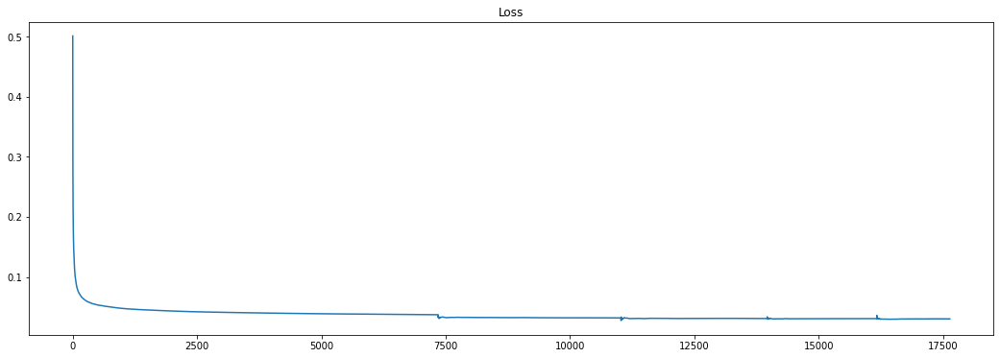

In [ ]:
fig, (ax1) = plt.subplots(1, 1, figsize=(18, 6))

ax1.plot(np.arange(len(loss_results)), loss_results)
ax1.set_title('Loss')

Text(0.5, 1.0, 'Loss')

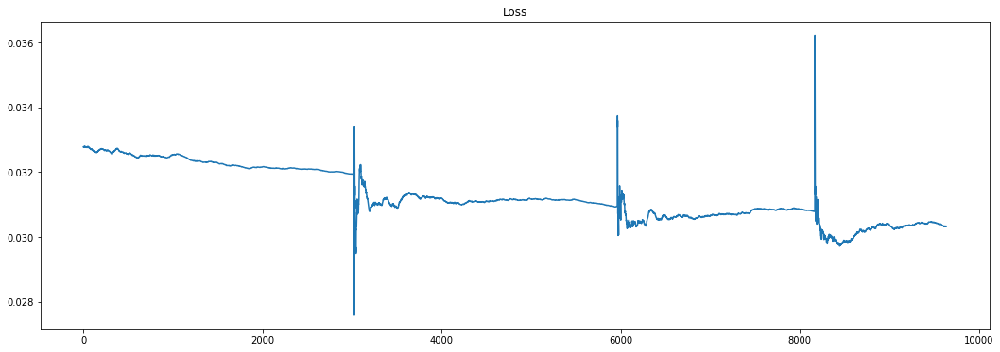

In [ ]:
fig, (ax1) = plt.subplots(1, 1, figsize=(18, 6))

ax1.plot(np.arange(len(loss_results[8000:])), loss_results[8000:])
ax1.set_title('Loss')

Text(0.5, 1.0, 'Loss')

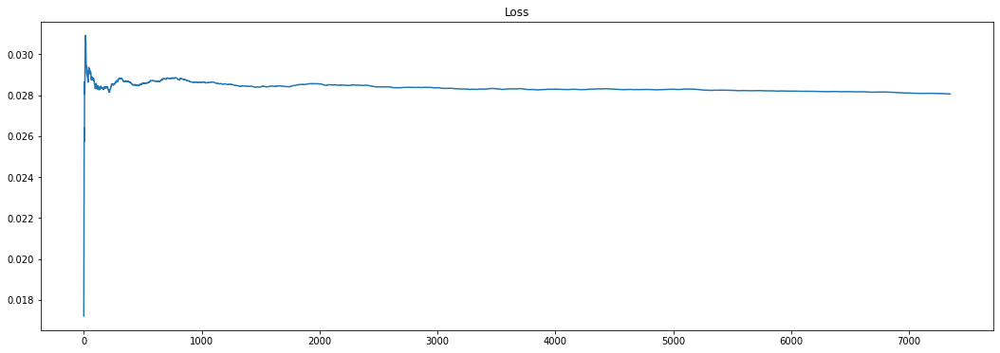

In [ ]:
fig, (ax1) = plt.subplots(1, 1, figsize=(18, 6))

ax1.plot(np.arange(len(loss_results)), loss_results)
ax1.set_title('Loss')

Text(0.5, 1.0, 'Loss')

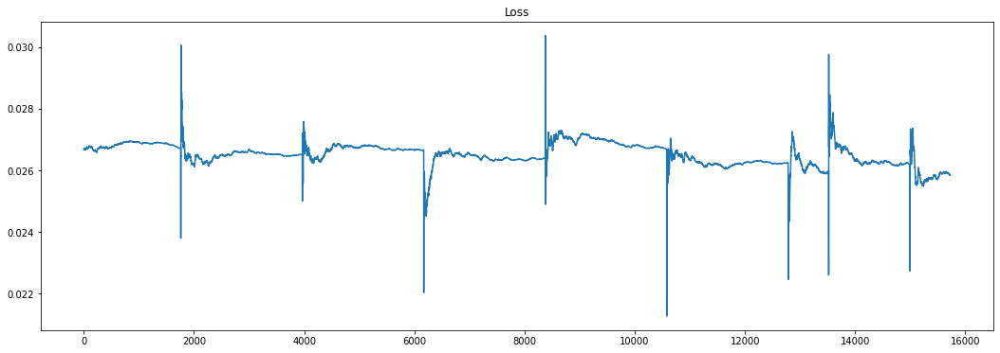

In [ ]:
fig, (ax1) = plt.subplots(1, 1, figsize=(18, 6))

ax1.plot(np.arange(len(loss_results[10000:])), loss_results[10000:])
ax1.set_title('Loss')

Text(0.5, 1.0, 'Loss')

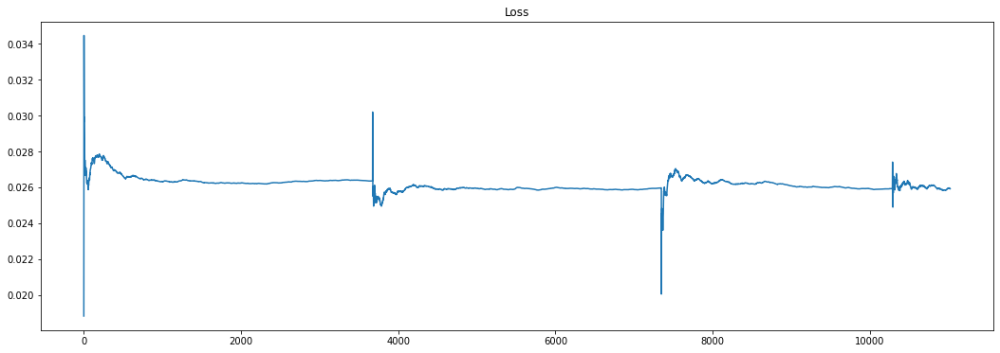

In [ ]:
fig, (ax1) = plt.subplots(1, 1, figsize=(18, 6))

ax1.plot(np.arange(len(loss_results)), loss_results)
ax1.set_title('Loss')

Text(0.5, 1.0, 'Loss')

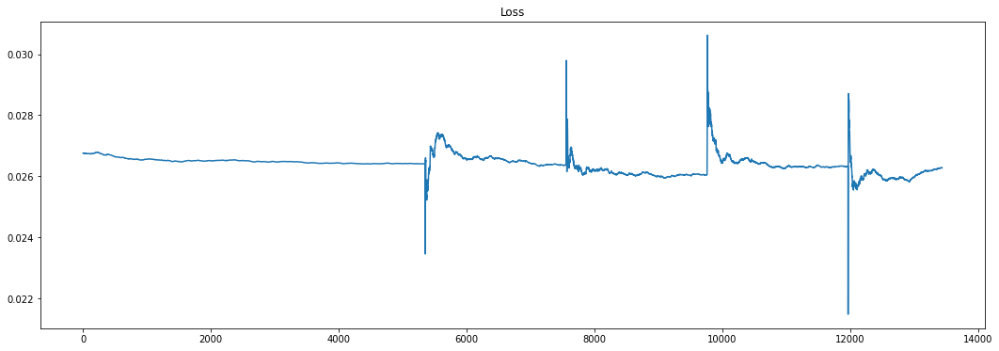

In [ ]:
fig, (ax1) = plt.subplots(1, 1, figsize=(18, 6))

ax1.plot(np.arange(len(loss_results[2000:])), loss_results[2000:])
ax1.set_title('Loss')

Text(0.5, 1.0, 'Loss')

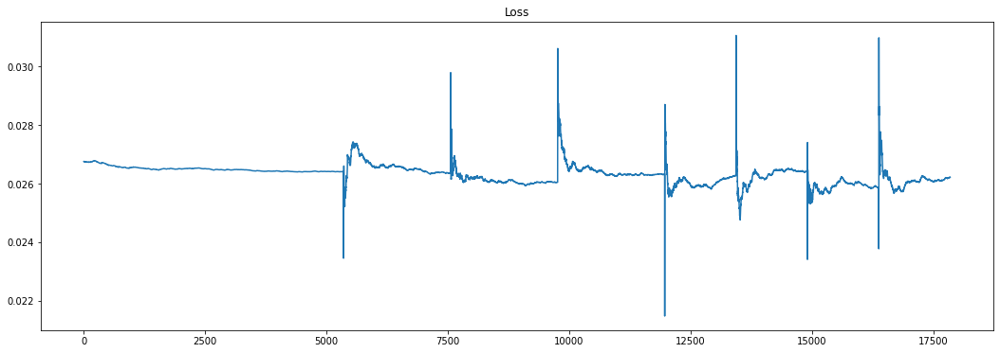

In [ ]:
fig, (ax1) = plt.subplots(1, 1, figsize=(18, 6))

ax1.plot(np.arange(len(loss_results[2000:])), loss_results[2000:])
ax1.set_title('Loss')

Text(0.5, 1.0, 'Loss')

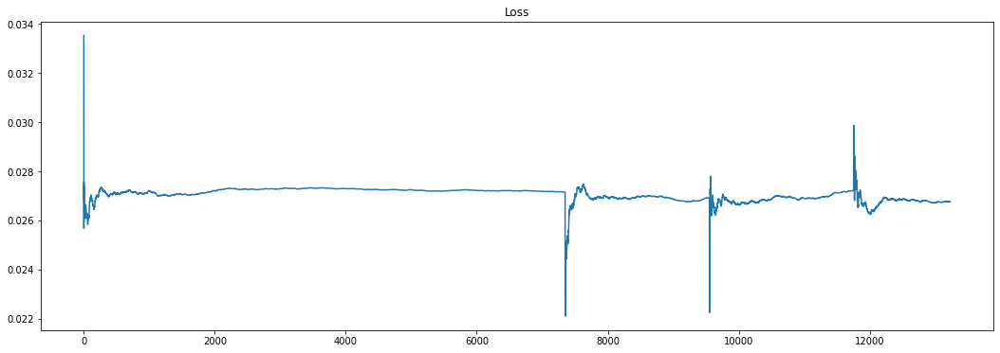

In [ ]:
fig, (ax1) = plt.subplots(1, 1, figsize=(18, 6))

ax1.plot(np.arange(len(loss_results)), loss_results)
ax1.set_title('Loss')

Text(0.5, 1.0, 'Loss')

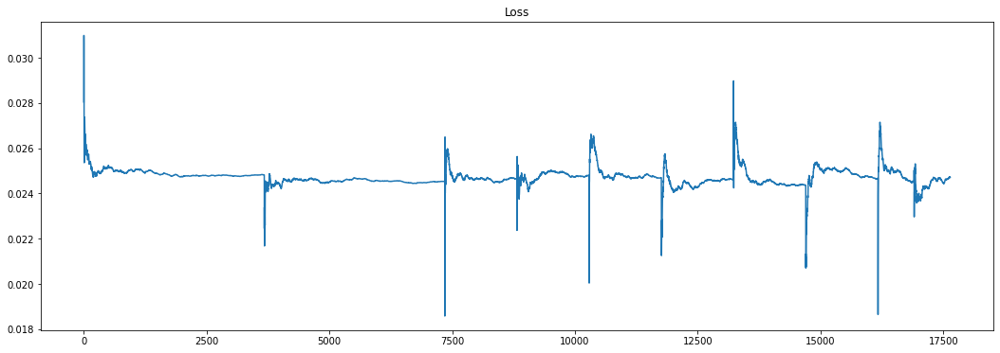

In [ ]:
fig, (ax1) = plt.subplots(1, 1, figsize=(18, 6))

ax1.plot(np.arange(len(loss_results)), loss_results)
ax1.set_title('Loss')

Text(0.5, 1.0, 'Loss')

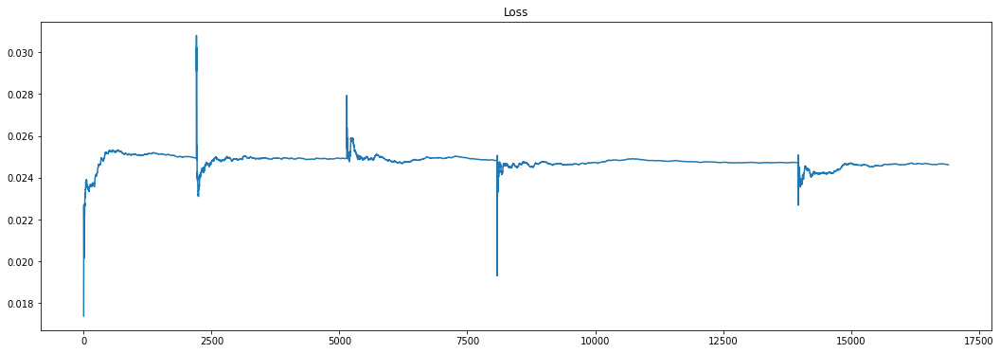

In [ ]:
fig, (ax1) = plt.subplots(1, 1, figsize=(18, 6))

ax1.plot(np.arange(len(loss_results)), loss_results)
ax1.set_title('Loss')

In [ ]:
gt_test_gen = gt_test_dataset.batch(12)
lq_test_gen = lq_test_dataset.batch(12)

In [ ]:
gt_test_gen = iter(gt_test_gen)
lq_test_gen = iter(lq_test_gen)

In [ ]:
gt_test_images = next(gt_test_gen)
lq_test_images = next(lq_test_gen)

In [ ]:
lq_test_images.shape, gt_test_images.shape

(TensorShape([12, 64, 64, 3]), TensorShape([12, 256, 256, 3]))

In [ ]:
output_img = no_gan_model(lq_test_images)

In [ ]:
output_img.shape

TensorShape([12, 256, 256, 3])

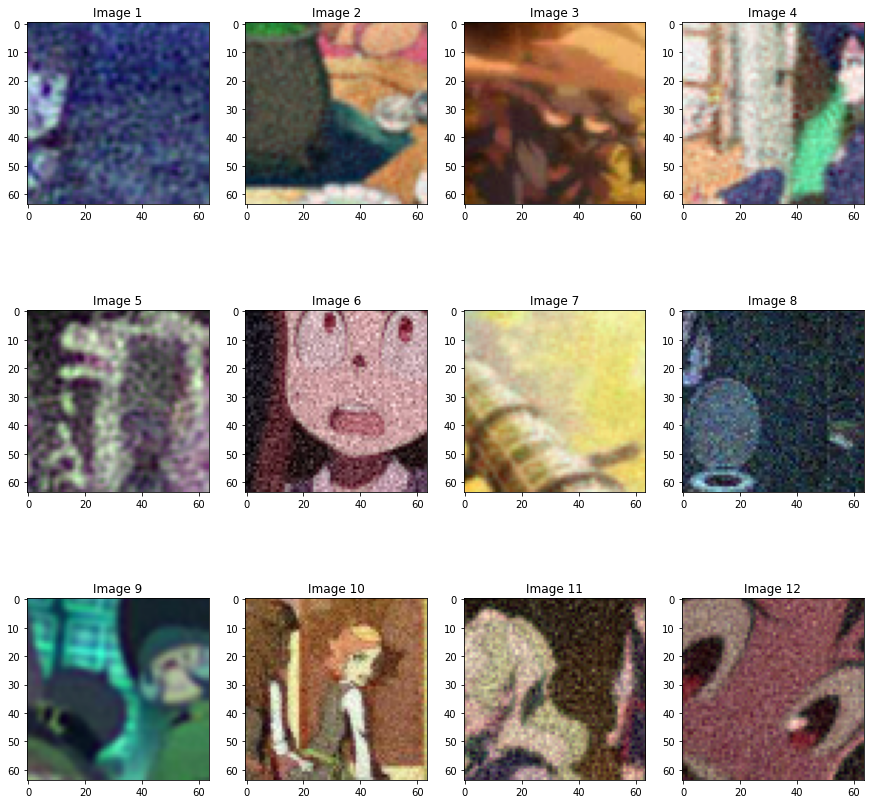

In [ ]:
plot_images(lq_test_images, 3, 4, figsize=(15, 15))

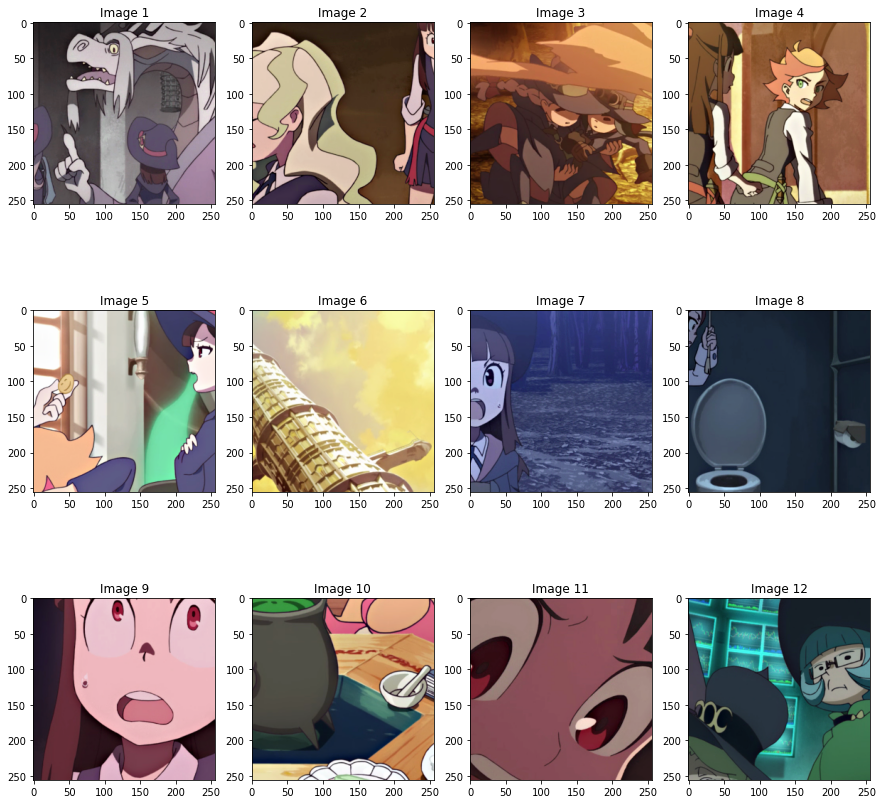

In [ ]:
plot_images(gt_test_images, 3, 4, figsize=(15, 15))

In [ ]:
output_img.numpy().max(), output_img.numpy().min()

(1.0639066, 0.0012198165)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


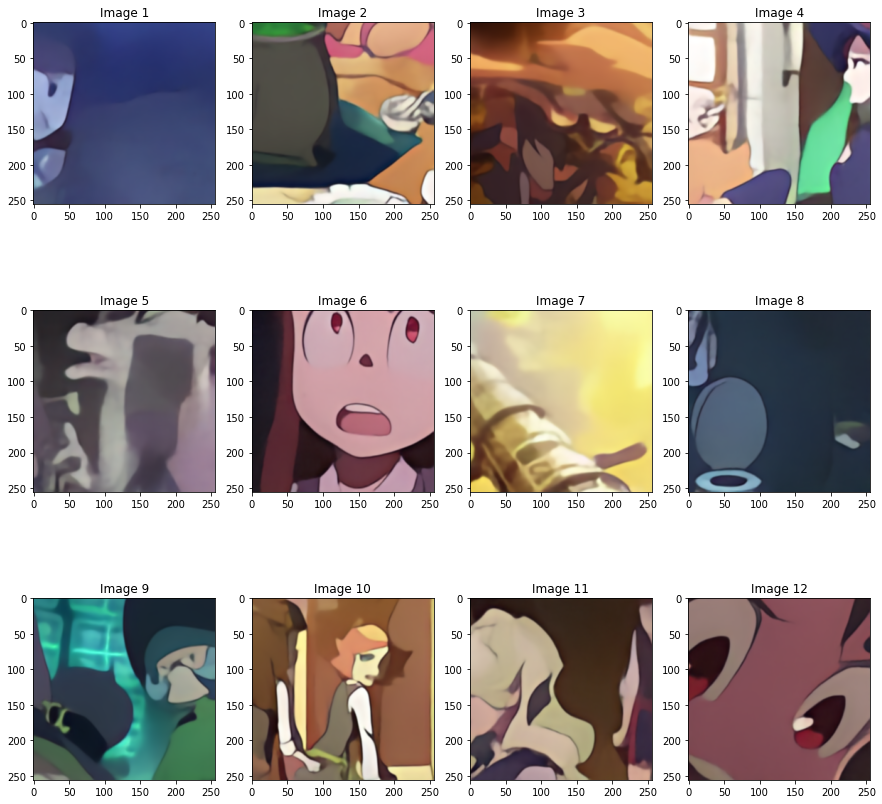

In [ ]:
plot_images(output_img, 3, 4, figsize=(15, 15))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


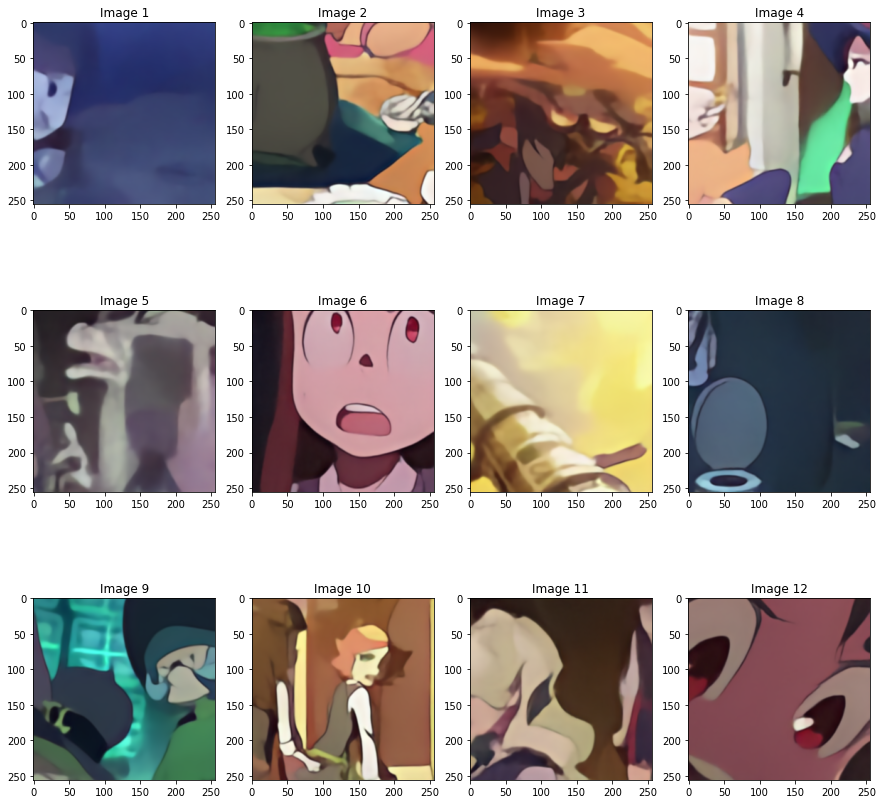

In [ ]:
plot_images(output_img, 3, 4, figsize=(15, 15)) #old

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


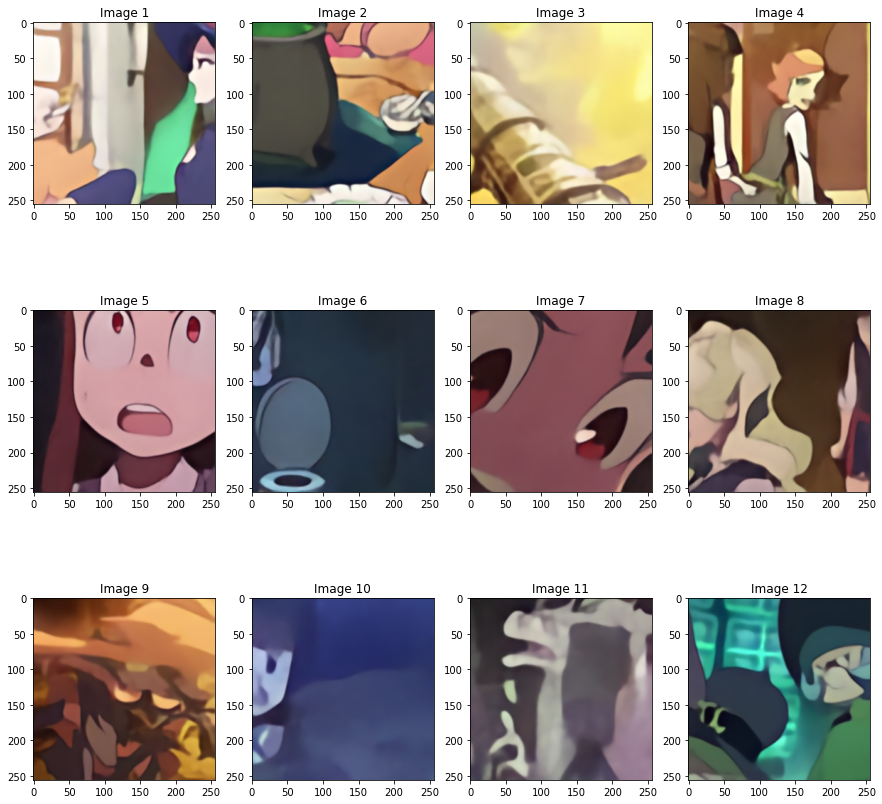

In [ ]:
plot_images(output_img, 3, 4, figsize=(15, 15)) # old

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


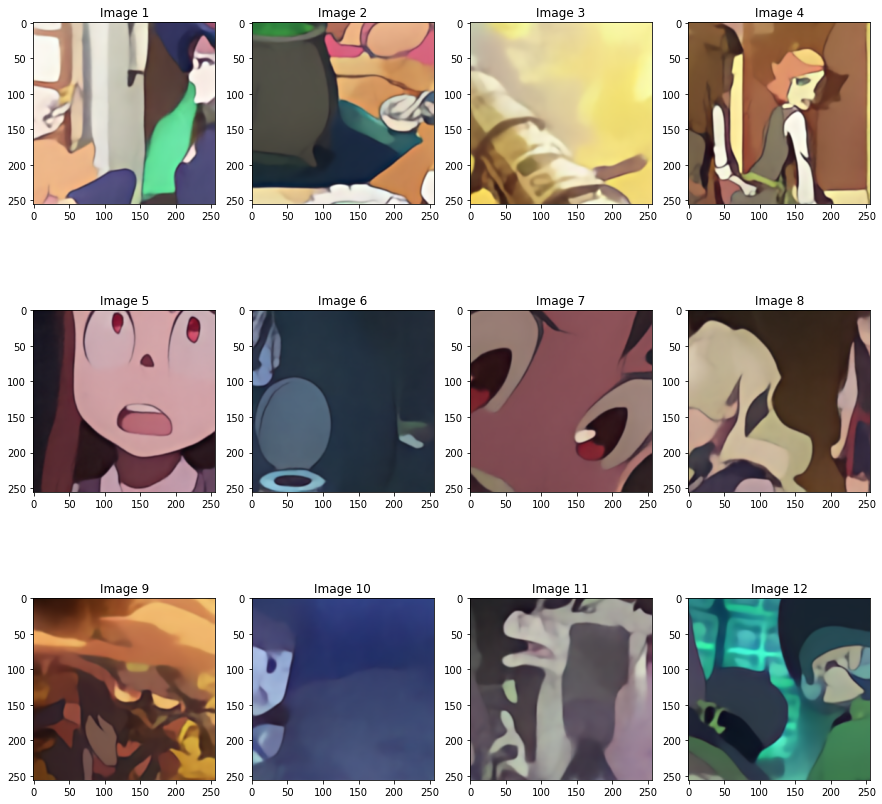

In [ ]:
# 765
plot_images(output_img, 3, 4, figsize=(15, 15))

In [ ]:
ema_output_img = ema_no_gan_model(lq_test_images)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


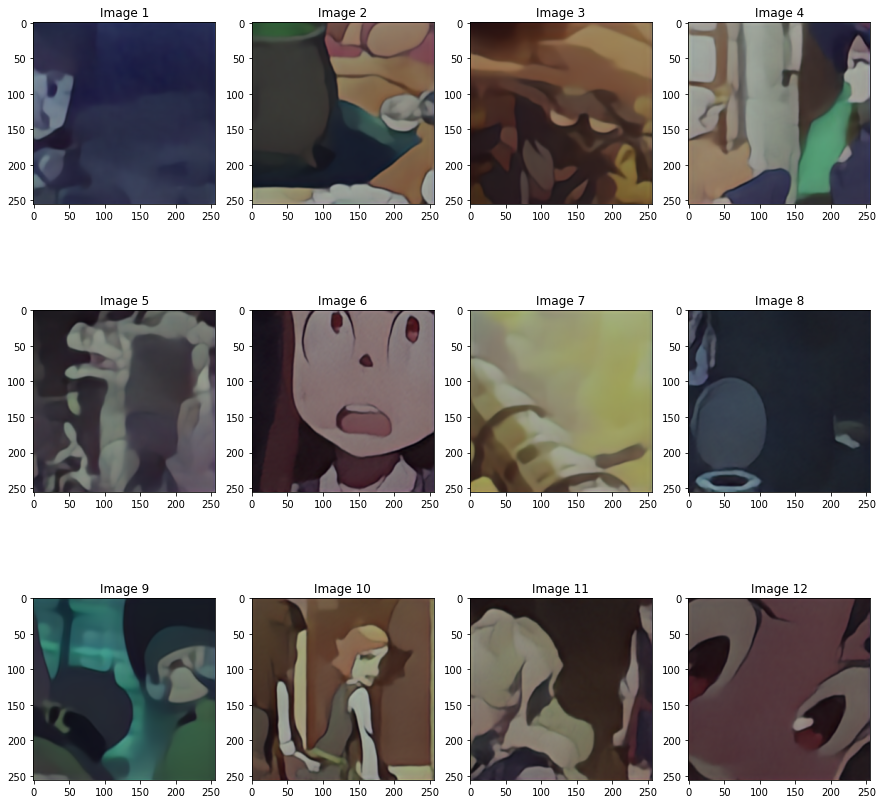

In [ ]:
plot_images(ema_output_img, 3, 4, figsize=(15, 15))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


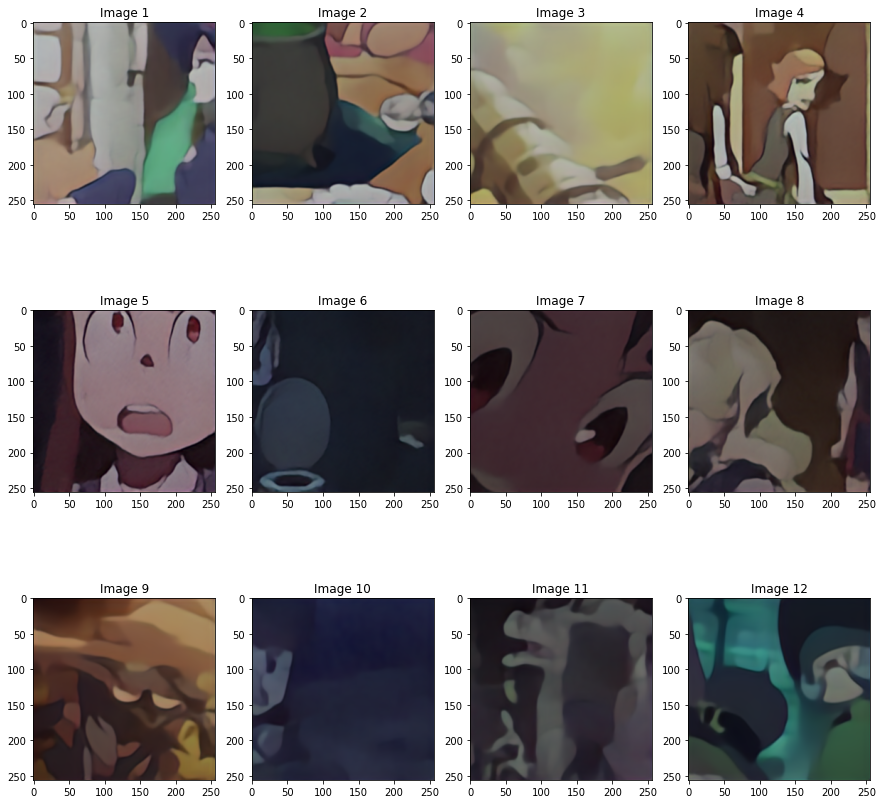

In [ ]:
plot_images(ema_output_img, 3, 4, figsize=(15, 15))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


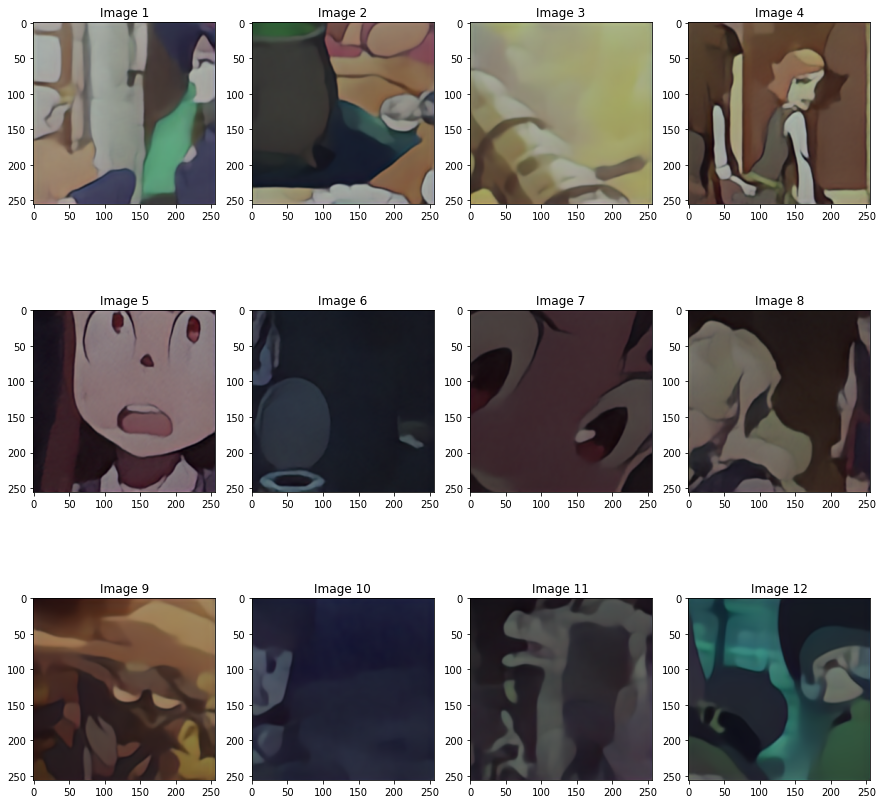

In [ ]:
# 715
plot_images(ema_output_img, 3, 4, figsize=(15, 15))

# Train Complete Framework

In [94]:
# <TrainFramework>

In [95]:
#! import tensorflow as tf
#! import time
#! import os
#! from train_utils import gan_inner_step, AverageModelWeights

In [96]:
#! from networks.models import RRDBNet, Vgg19FeaturesModel, UNetDiscriminator
#! from data_generator.data_generator import train_dataset, feed_data, PoolData
#! from data_generator.data_generator import feed_props_1, feed_props_2, train_images_paths
#! from data_generator.data_utils import usm_sharpener

In [97]:
import argparse
import builtins

In [98]:
parser = argparse.ArgumentParser()

In [99]:
parser.add_argument('--epochs', type=int, default=12000, help='Number of epochs to train the model')
parser.add_argument('--batch_size', type=int, default=14, help='Number batches')
parser.add_argument('--continue_training', default=True, action='store_true', help='Use training checkpoints to continue training the model')
parser.add_argument('--load_gan', default=False, action='store_true', help='Load the original gan model')

_StoreTrueAction(option_strings=['--load_gan'], dest='load_gan', nargs=0, const=True, default=False, type=None, choices=None, help='Load the original gan model', metavar=None)

In [100]:
using_notebook = getattr(builtins, "__IPYTHON__", False)

In [101]:
opts = parser.parse_args([]) if using_notebook else parser.parse_args()

In [102]:
batch_size = opts.batch_size
epochs = opts.epochs
lr = 1e-4

gen_optimizer = tf.keras.optimizers.Adam(learning_rate=lr, beta_1=0.9, beta_2=0.99)
disc_optimizer = tf.keras.optimizers.Adam(learning_rate=lr, beta_1=0.9, beta_2=0.99)

pool_size = 182

In [103]:
gan_model = RRDBNet()

In [ ]:
if opts.load_gan:
  gan_model.load_weights('./checkpoint_weights/last_weights')

In [104]:
gan_model.build((None, 256, 256, 3))

In [105]:
ema_gan_model = RRDBNet()
ema_gan_model.build((None, 256, 256, 3))

In [106]:
ema_api = AverageModelWeights(ema_gan_model, gan_model.get_weights())

In [107]:
discriminator = UNetDiscriminator()
vgg_model = Vgg19FeaturesModel()

80150528/80134624 [==============================] - 0s 0us/step


In [108]:
checkpoint_dir = './training_gan_checkpoints'
ema_checkpoint_dir = './ema_training_gan_checkpoints'

In [118]:
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator=gan_model, gen_optimizer=gen_optimizer, discriminator=discriminator, disc_optimizer=disc_optimizer)

In [119]:
ema_checkpoint_prefix = os.path.join(ema_checkpoint_dir, "ema_ckpt")
ema_checkpoint = tf.train.Checkpoint(model=ema_gan_model)

In [120]:
if opts.continue_training:
  print("loading training checkpoints: ")                   
  print(tf.train.latest_checkpoint(checkpoint_dir))
  checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

  print("loading EMA training checkpoints: ")                   
  print(tf.train.latest_checkpoint(ema_checkpoint_dir))
  ema_checkpoint.restore(tf.train.latest_checkpoint(ema_checkpoint_dir))

loading training checkpoints: 
./training_gan_checkpoints/ckpt-120
loading EMA training checkpoints: 
./ema_training_gan_checkpoints/ema_ckpt-120


In [121]:
train_generator = train_dataset.batch(batch_size)

In [175]:
pool_train_data = PoolData(pool_size, batch_size)

## Train

In [139]:
@tf.function
def train_step(gt_images, usm_gt_images, lq_images):
  return gan_inner_step(gt_images, usm_gt_images, lq_images, gan_model, discriminator, vgg_model, gen_optimizer, disc_optimizer)

In [140]:
train_steps = int(len(train_images_paths) // batch_size)

In [141]:
epochs = opts.epochs
start_epoch = 0

In [142]:
train_loss_metric = tf.keras.metrics.Mean()
loss_results = []

discriminator_loss_metric = tf.keras.metrics.Mean()
discriminator_loss_results = []

generator_loss_metric = tf.keras.metrics.Mean()
generator_loss_results = []

perceptual_loss_metric = tf.keras.metrics.Mean()
perceptual_loss_results = []

l1_loss_metric = tf.keras.metrics.Mean()
l1_loss_results = []

In [182]:
def train(epochs):
  for epoch in range(start_epoch, epochs):
    train_loss_metric.reset_states()
    discriminator_loss_metric.reset_states()
    generator_loss_metric.reset_states()
    perceptual_loss_metric.reset_states()
    l1_loss_metric.reset_states()

    epoch_time = time.time()
    batch_time = time.time()
    step = 0
    
    epoch_count = f"0{epoch + 1}/{epochs}" if epoch < 9 else f"{epoch + 1}/{epochs}"

    for img, first_kernel, second_kernel, sinc_kernel in train_generator:
      gt_img, lq_img = feed_data(img, first_kernel, second_kernel, sinc_kernel, [feed_props_1, feed_props_2])
      gt_img, lq_img = pool_train_data.get_pool_data(gt_img, lq_img)

      usm_gt_img = usm_sharpener.sharp(gt_img)
      
      total_generator_loss, gen_loss, perceptual_loss, l1_loss, disc_loss = train_step(gt_img, usm_gt_img, lq_img)

      print('\r', 'Epoch', epoch_count, '| Step', f"{step}/{train_steps}",
            '| disc_loss:', f"{disc_loss:.5f}", '| total_generator_loss:', f"{total_generator_loss:.5f}", 
            "| Step Time:", f"{time.time() - batch_time:.2f}", end='')  
      
      train_loss_metric.update_state(total_generator_loss + disc_loss)
      total_loss = train_loss_metric.result().numpy()
      loss_results.append(total_loss)

      discriminator_loss_metric.update_state(disc_loss)
      discriminator_loss = discriminator_loss_metric.result().numpy()
      discriminator_loss_results.append(discriminator_loss)

      generator_loss_metric.update_state(gen_loss)
      loss = generator_loss_metric.result().numpy()
      generator_loss_results.append(loss)

      perceptual_loss_metric.update_state(perceptual_loss)
      loss = perceptual_loss_metric.result().numpy()
      perceptual_loss_results.append(loss)

      l1_loss_metric.update_state(l1_loss)
      loss = l1_loss_metric.result().numpy()
      l1_loss_results.append(loss)

      step += 1

      batch_time = time.time()

    checkpoint.save(file_prefix=checkpoint_prefix)
    ema_api.compute_ema_weights(gan_model)
    ema_checkpoint.save(file_prefix=ema_checkpoint_prefix)

    print('\r', 'Epoch', epoch_count, '| Step', f"{step}/{train_steps}",
          '| disc_loss:', f"{discriminator_loss:.5f}", '| total_generator_loss:', f"{total_loss:.5f}",  
          "| Epoch Time:", f"{time.time() - epoch_time:.2f}")

In [ ]:
#! train(epochs)

In [ ]:
# <TrainFrameworkEnd>

In [ ]:
train(10)

 Epoch 01/10 | Step 147/147 | disc_loss: 1.35817 | total_generator_loss: 378.28806 | Epoch Time: 383.21
 Epoch 02/10 | Step 147/147 | disc_loss: 1.36712 | total_generator_loss: 378.79660 | Epoch Time: 370.05
 Epoch 03/10 | Step 147/147 | disc_loss: 1.25191 | total_generator_loss: 428.08749 | Epoch Time: 383.01
 Epoch 04/10 | Step 147/147 | disc_loss: 1.23414 | total_generator_loss: 528.12988 | Epoch Time: 352.98
 Epoch 05/10 | Step 147/147 | disc_loss: 1.33640 | total_generator_loss: 396.26010 | Epoch Time: 323.05
 Epoch 06/10 | Step 147/147 | disc_loss: 1.20961 | total_generator_loss: 444.34766 | Epoch Time: 383.04
 Epoch 07/10 | Step 147/147 | disc_loss: 1.19990 | total_generator_loss: 407.56747 | Epoch Time: 383.02
 Epoch 08/10 | Step 147/147 | disc_loss: 1.06472 | total_generator_loss: 445.56982 | Epoch Time: 328.81
 Epoch 09/10 | Step 147/147 | disc_loss: 0.96682 | total_generator_loss: 372.21280 | Epoch Time: 383.02
 Epoch 10/10 | Step 147/147 | disc_loss: 0.84616 | total_generat

In [ ]:
train(10)

 Epoch 01/10 | Step 147/147 | disc_loss: 0.89058 | total_generator_loss: 395.81436 | Epoch Time: 326.27
 Epoch 02/10 | Step 147/147 | disc_loss: 0.97537 | total_generator_loss: 422.14597 | Epoch Time: 383.11
 Epoch 03/10 | Step 147/147 | disc_loss: 0.84224 | total_generator_loss: 564.19720 | Epoch Time: 323.08
 Epoch 04/10 | Step 147/147 | disc_loss: 0.90067 | total_generator_loss: 348.53772 | Epoch Time: 326.25
 Epoch 05/10 | Step 147/147 | disc_loss: 0.78305 | total_generator_loss: 428.76495 | Epoch Time: 323.05
 Epoch 06/10 | Step 147/147 | disc_loss: 0.99239 | total_generator_loss: 367.35226 | Epoch Time: 308.54
 Epoch 07/10 | Step 147/147 | disc_loss: 0.87173 | total_generator_loss: 333.43265 | Epoch Time: 323.06
 Epoch 08/10 | Step 147/147 | disc_loss: 1.09395 | total_generator_loss: 295.20789 | Epoch Time: 314.30
 Epoch 09/10 | Step 147/147 | disc_loss: 0.89328 | total_generator_loss: 417.54858 | Epoch Time: 383.07
 Epoch 10/10 | Step 147/147 | disc_loss: 1.23420 | total_generat

In [ ]:
train(10)

 Epoch 01/10 | Step 147/147 | disc_loss: 0.95636 | total_generator_loss: 352.79321 | Epoch Time: 306.55
 Epoch 02/10 | Step 147/147 | disc_loss: 0.67318 | total_generator_loss: 477.64563 | Epoch Time: 323.05
 Epoch 03/10 | Step 147/147 | disc_loss: 0.93822 | total_generator_loss: 377.37347 | Epoch Time: 311.01
 Epoch 04/10 | Step 147/147 | disc_loss: 0.98090 | total_generator_loss: 472.75595 | Epoch Time: 300.85
 Epoch 05/10 | Step 147/147 | disc_loss: 0.68334 | total_generator_loss: 408.57166 | Epoch Time: 316.36
 Epoch 06/10 | Step 147/147 | disc_loss: 0.61576 | total_generator_loss: 509.44443 | Epoch Time: 323.05
 Epoch 07/10 | Step 147/147 | disc_loss: 0.50260 | total_generator_loss: 388.29514 | Epoch Time: 323.06
 Epoch 08/10 | Step 147/147 | disc_loss: 0.61402 | total_generator_loss: 459.40262 | Epoch Time: 323.10
 Epoch 09/10 | Step 147/147 | disc_loss: 0.88332 | total_generator_loss: 352.09085 | Epoch Time: 323.00
 Epoch 10/10 | Step 147/147 | disc_loss: 0.75593 | total_generat

In [ ]:
train(10)

 Epoch 01/10 | Step 147/147 | disc_loss: 0.64378 | total_generator_loss: 485.35944 | Epoch Time: 323.02
 Epoch 02/10 | Step 147/147 | disc_loss: 1.04070 | total_generator_loss: 406.90253 | Epoch Time: 305.69
 Epoch 03/10 | Step 147/147 | disc_loss: 0.63399 | total_generator_loss: 506.20898 | Epoch Time: 314.41
 Epoch 04/10 | Step 147/147 | disc_loss: 0.48092 | total_generator_loss: 411.88318 | Epoch Time: 307.08
 Epoch 05/10 | Step 147/147 | disc_loss: 0.43825 | total_generator_loss: 350.74829 | Epoch Time: 315.88
 Epoch 06/10 | Step 147/147 | disc_loss: 0.44592 | total_generator_loss: 364.74683 | Epoch Time: 313.98
 Epoch 07/10 | Step 147/147 | disc_loss: 0.67839 | total_generator_loss: 497.35165 | Epoch Time: 324.88
 Epoch 08/10 | Step 147/147 | disc_loss: 0.61018 | total_generator_loss: 432.40512 | Epoch Time: 325.61
 Epoch 09/10 | Step 147/147 | disc_loss: 0.37758 | total_generator_loss: 472.72812 | Epoch Time: 307.70
 Epoch 10/10 | Step 147/147 | disc_loss: 0.46492 | total_generat

In [ ]:
train(10)

 Epoch 01/10 | Step 147/147 | disc_loss: 0.55683 | total_generator_loss: 392.95789 | Epoch Time: 304.62
 Epoch 02/10 | Step 147/147 | disc_loss: 0.47488 | total_generator_loss: 385.91245 | Epoch Time: 300.32
 Epoch 03/10 | Step 147/147 | disc_loss: 0.48986 | total_generator_loss: 431.19495 | Epoch Time: 323.06
 Epoch 04/10 | Step 147/147 | disc_loss: 0.44485 | total_generator_loss: 434.28049 | Epoch Time: 323.05
 Epoch 05/10 | Step 147/147 | disc_loss: 0.45269 | total_generator_loss: 338.95343 | Epoch Time: 323.03
 Epoch 06/10 | Step 147/147 | disc_loss: 0.36399 | total_generator_loss: 448.93082 | Epoch Time: 323.01
 Epoch 07/10 | Step 147/147 | disc_loss: 0.58803 | total_generator_loss: 400.48334 | Epoch Time: 286.28
 Epoch 08/10 | Step 147/147 | disc_loss: 0.44879 | total_generator_loss: 421.85501 | Epoch Time: 323.01
 Epoch 09/10 | Step 147/147 | disc_loss: 0.37936 | total_generator_loss: 383.32739 | Epoch Time: 306.64
 Epoch 10/10 | Step 147/147 | disc_loss: 0.49667 | total_generat

In [ ]:
train(10)

 Epoch 01/10 | Step 147/147 | disc_loss: 0.22194 | total_generator_loss: 396.85037 | Epoch Time: 323.01
 Epoch 02/10 | Step 147/147 | disc_loss: 0.31430 | total_generator_loss: 404.34381 | Epoch Time: 310.39
 Epoch 03/10 | Step 147/147 | disc_loss: 0.23132 | total_generator_loss: 485.92941 | Epoch Time: 301.35
 Epoch 04/10 | Step 147/147 | disc_loss: 0.73193 | total_generator_loss: 413.16611 | Epoch Time: 303.43
 Epoch 05/10 | Step 147/147 | disc_loss: 0.44614 | total_generator_loss: 391.50424 | Epoch Time: 295.01
 Epoch 06/10 | Step 147/147 | disc_loss: 0.30491 | total_generator_loss: 406.79324 | Epoch Time: 323.00
 Epoch 07/10 | Step 147/147 | disc_loss: 0.36268 | total_generator_loss: 413.39053 | Epoch Time: 323.07
 Epoch 08/10 | Step 147/147 | disc_loss: 0.32119 | total_generator_loss: 352.13998 | Epoch Time: 305.85
 Epoch 09/10 | Step 147/147 | disc_loss: 0.29745 | total_generator_loss: 405.22116 | Epoch Time: 323.01
 Epoch 10/10 | Step 147/147 | disc_loss: 0.21150 | total_generat

In [ ]:
train(10)

 Epoch 01/10 | Step 147/147 | disc_loss: 0.45310 | total_generator_loss: 422.73660 | Epoch Time: 302.63
 Epoch 02/10 | Step 147/147 | disc_loss: 0.32176 | total_generator_loss: 412.46002 | Epoch Time: 323.04
 Epoch 03/10 | Step 147/147 | disc_loss: 0.14349 | total_generator_loss: 408.59357 | Epoch Time: 310.45
 Epoch 04/10 | Step 147/147 | disc_loss: 0.24958 | total_generator_loss: 398.38345 | Epoch Time: 313.25
 Epoch 05/10 | Step 147/147 | disc_loss: 0.16966 | total_generator_loss: 430.43356 | Epoch Time: 301.02
 Epoch 06/10 | Step 147/147 | disc_loss: 0.26178 | total_generator_loss: 311.74194 | Epoch Time: 316.31
 Epoch 07/10 | Step 147/147 | disc_loss: 0.39205 | total_generator_loss: 402.60025 | Epoch Time: 299.31
 Epoch 08/10 | Step 147/147 | disc_loss: 0.24471 | total_generator_loss: 378.61176 | Epoch Time: 310.58
 Epoch 09/10 | Step 147/147 | disc_loss: 0.30084 | total_generator_loss: 386.39423 | Epoch Time: 299.85
 Epoch 10/10 | Step 147/147 | disc_loss: 1.21485 | total_generat

In [ ]:
train(10)

 Epoch 01/10 | Step 147/147 | disc_loss: 0.12171 | total_generator_loss: 451.89804 | Epoch Time: 304.02
 Epoch 02/10 | Step 147/147 | disc_loss: 0.14238 | total_generator_loss: 453.33932 | Epoch Time: 310.40
 Epoch 03/10 | Step 147/147 | disc_loss: 0.16792 | total_generator_loss: 430.95325 | Epoch Time: 323.04
 Epoch 04/10 | Step 147/147 | disc_loss: 0.43072 | total_generator_loss: 303.31702 | Epoch Time: 319.32
 Epoch 05/10 | Step 147/147 | disc_loss: 0.24251 | total_generator_loss: 316.40225 | Epoch Time: 308.65
 Epoch 06/10 | Step 147/147 | disc_loss: 0.21812 | total_generator_loss: 410.66199 | Epoch Time: 293.75
 Epoch 07/10 | Step 147/147 | disc_loss: 0.21368 | total_generator_loss: 395.37515 | Epoch Time: 296.24
 Epoch 08/10 | Step 147/147 | disc_loss: 0.15871 | total_generator_loss: 391.29184 | Epoch Time: 302.21
 Epoch 09/10 | Step 147/147 | disc_loss: 0.11933 | total_generator_loss: 365.86465 | Epoch Time: 320.71
 Epoch 10/10 | Step 147/147 | disc_loss: 0.51122 | total_generat

In [ ]:
train(10)

 Epoch 01/10 | Step 147/147 | disc_loss: 0.19375 | total_generator_loss: 353.47272 | Epoch Time: 306.39
 Epoch 02/10 | Step 147/147 | disc_loss: 0.13065 | total_generator_loss: 471.29141 | Epoch Time: 323.01
 Epoch 03/10 | Step 147/147 | disc_loss: 0.18428 | total_generator_loss: 504.25696 | Epoch Time: 323.03
 Epoch 04/10 | Step 147/147 | disc_loss: 0.41729 | total_generator_loss: 476.17209 | Epoch Time: 299.17
 Epoch 05/10 | Step 147/147 | disc_loss: 0.20407 | total_generator_loss: 449.13770 | Epoch Time: 323.01
 Epoch 06/10 | Step 147/147 | disc_loss: 0.19799 | total_generator_loss: 386.44708 | Epoch Time: 299.42
 Epoch 07/10 | Step 147/147 | disc_loss: 0.20996 | total_generator_loss: 337.29892 | Epoch Time: 323.19
 Epoch 08/10 | Step 147/147 | disc_loss: 0.38463 | total_generator_loss: 411.79202 | Epoch Time: 323.03
 Epoch 09/10 | Step 147/147 | disc_loss: 0.14737 | total_generator_loss: 412.72018 | Epoch Time: 323.09
 Epoch 10/10 | Step 147/147 | disc_loss: 0.17314 | total_generat

In [ ]:
train(10)

 Epoch 01/10 | Step 147/147 | disc_loss: 0.27167 | total_generator_loss: 421.39554 | Epoch Time: 299.13
 Epoch 02/10 | Step 147/147 | disc_loss: 0.11977 | total_generator_loss: 343.85489 | Epoch Time: 296.96
 Epoch 03/10 | Step 147/147 | disc_loss: 0.43072 | total_generator_loss: 425.86581 | Epoch Time: 323.02
 Epoch 04/10 | Step 147/147 | disc_loss: 0.11641 | total_generator_loss: 451.86890 | Epoch Time: 309.09
 Epoch 05/10 | Step 147/147 | disc_loss: 0.26036 | total_generator_loss: 356.57401 | Epoch Time: 298.86
 Epoch 06/10 | Step 147/147 | disc_loss: 0.09475 | total_generator_loss: 460.30179 | Epoch Time: 304.66
 Epoch 07/10 | Step 147/147 | disc_loss: 0.11194 | total_generator_loss: 415.93307 | Epoch Time: 299.10
 Epoch 08/10 | Step 147/147 | disc_loss: 0.17659 | total_generator_loss: 346.90424 | Epoch Time: 305.09
 Epoch 09/10 | Step 147/147 | disc_loss: 0.32162 | total_generator_loss: 347.18066 | Epoch Time: 323.02
 Epoch 10/10 | Step 147/147 | disc_loss: 0.12949 | total_generat

In [ ]:
train(10)

 Epoch 01/10 | Step 147/147 | disc_loss: 0.16328 | total_generator_loss: 392.18970 | Epoch Time: 317.71
 Epoch 02/10 | Step 147/147 | disc_loss: 0.07151 | total_generator_loss: 359.86328 | Epoch Time: 322.99
 Epoch 03/10 | Step 147/147 | disc_loss: 0.12894 | total_generator_loss: 419.73468 | Epoch Time: 301.46
 Epoch 04/10 | Step 147/147 | disc_loss: 0.13856 | total_generator_loss: 515.18640 | Epoch Time: 323.01
 Epoch 05/10 | Step 147/147 | disc_loss: 0.06855 | total_generator_loss: 428.40741 | Epoch Time: 308.46
 Epoch 06/10 | Step 147/147 | disc_loss: 0.10719 | total_generator_loss: 391.51059 | Epoch Time: 322.98
 Epoch 07/10 | Step 147/147 | disc_loss: 0.11411 | total_generator_loss: 385.61902 | Epoch Time: 304.29
 Epoch 08/10 | Step 147/147 | disc_loss: 0.26113 | total_generator_loss: 377.84393 | Epoch Time: 311.13
 Epoch 09/10 | Step 147/147 | disc_loss: 0.05605 | total_generator_loss: 380.93259 | Epoch Time: 323.03
 Epoch 10/10 | Step 147/147 | disc_loss: 0.18648 | total_generat

In [ ]:
train(10)

 Epoch 01/10 | Step 147/147 | disc_loss: 0.12497 | total_generator_loss: 393.11212 | Epoch Time: 323.04
 Epoch 02/10 | Step 147/147 | disc_loss: 0.21667 | total_generator_loss: 403.96960 | Epoch Time: 305.66
 Epoch 03/10 | Step 147/147 | disc_loss: 0.12818 | total_generator_loss: 395.32675 | Epoch Time: 322.98
 Epoch 04/10 | Step 147/147 | disc_loss: 0.14210 | total_generator_loss: 396.84027 | Epoch Time: 311.57
 Epoch 05/10 | Step 147/147 | disc_loss: 0.13518 | total_generator_loss: 408.77975 | Epoch Time: 305.66
 Epoch 06/10 | Step 147/147 | disc_loss: 0.17445 | total_generator_loss: 406.40842 | Epoch Time: 323.33
 Epoch 07/10 | Step 147/147 | disc_loss: 0.09562 | total_generator_loss: 402.62735 | Epoch Time: 303.04
 Epoch 08/10 | Step 147/147 | disc_loss: 0.13420 | total_generator_loss: 398.82974 | Epoch Time: 323.02
 Epoch 09/10 | Step 147/147 | disc_loss: 0.11233 | total_generator_loss: 404.43353 | Epoch Time: 315.59
 Epoch 10/10 | Step 147/147 | disc_loss: 0.16458 | total_generat

In [179]:
epoch_loss = [loss_results[index] for index in range(146, len(loss_results), 147)]

In [180]:
len(epoch_loss)

20

Text(0.5, 1.0, 'Complete epoch Loss')

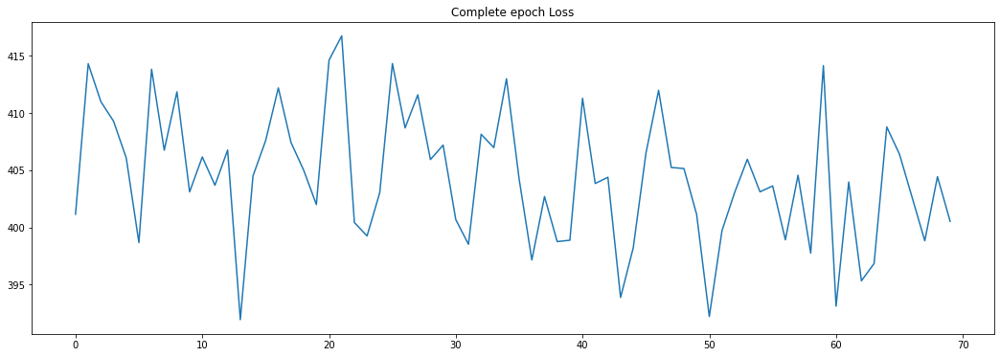

In [ ]:
fig, (ax1) = plt.subplots(1, 1, figsize=(18, 6))

ax1.plot(np.arange(len(epoch_loss)), epoch_loss)
ax1.set_title('Complete epoch Loss')

Text(0.5, 1.0, 'Complete Loss')

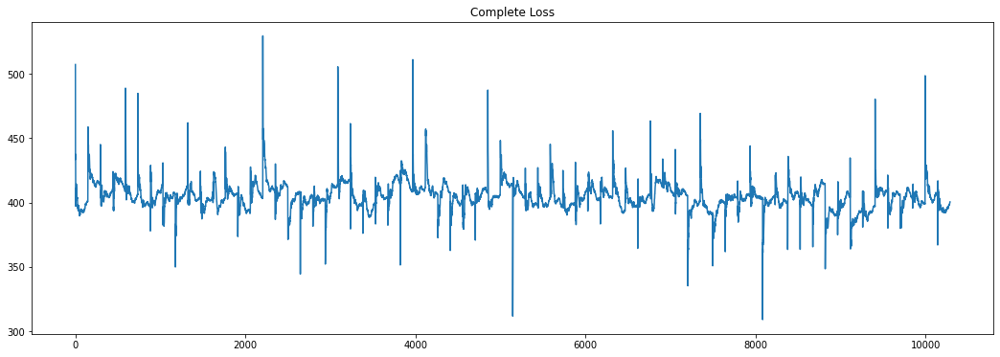

In [ ]:
fig, (ax1) = plt.subplots(1, 1, figsize=(18, 6))

ax1.plot(np.arange(len(loss_results)), loss_results)
ax1.set_title('Complete Loss')

Text(0.5, 1.0, 'Perceptual Loss')

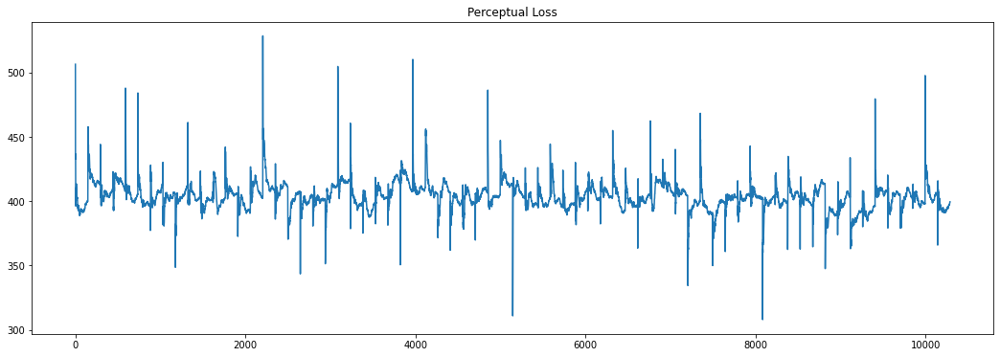

In [ ]:
fig, (ax1) = plt.subplots(1, 1, figsize=(18, 6))

ax1.plot(np.arange(len(perceptual_loss_results)), perceptual_loss_results)
ax1.set_title('Perceptual Loss')

Text(0.5, 1.0, 'Discriminator Loss')

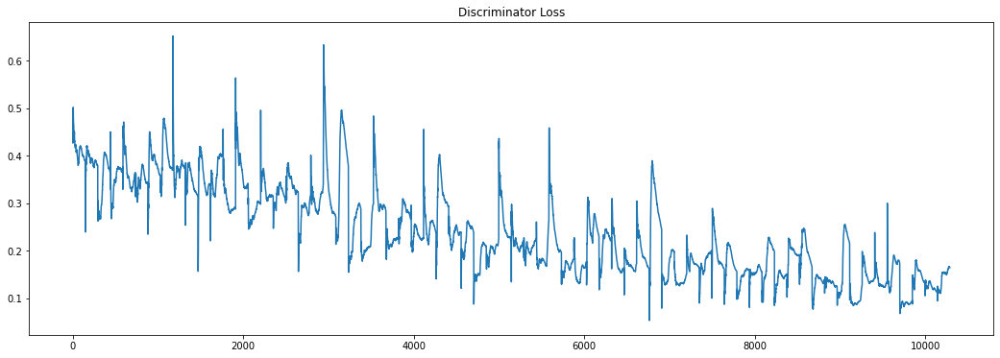

In [ ]:
fig, (ax1) = plt.subplots(1, 1, figsize=(18, 6))

ax1.plot(np.arange(len(discriminator_loss_results)), discriminator_loss_results)
ax1.set_title('Discriminator Loss')

Text(0.5, 1.0, 'Generator Loss')

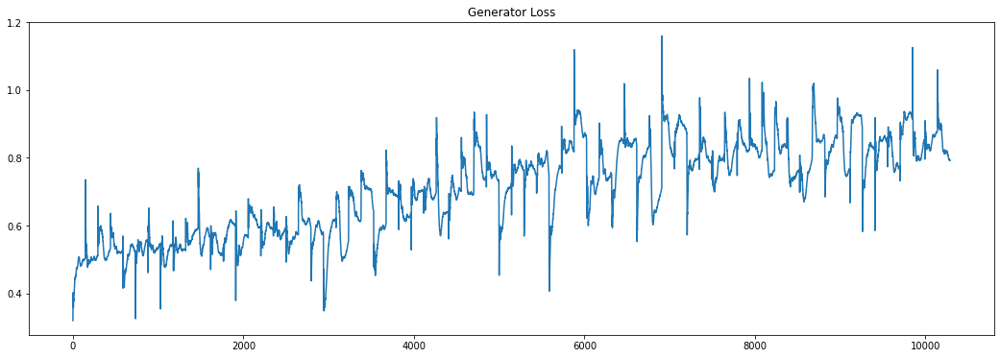

In [ ]:
fig, (ax1) = plt.subplots(1, 1, figsize=(18, 6))

ax1.plot(np.arange(len(generator_loss_results)), generator_loss_results)
ax1.set_title('Generator Loss')

In [144]:
train(10)

 Epoch 01/10 | Step 147/147 | disc_loss: 0.09525 | total_generator_loss: 433.02234 | Epoch Time: 443.26
 Epoch 02/10 | Step 147/147 | disc_loss: 0.14229 | total_generator_loss: 420.75970 | Epoch Time: 367.32
 Epoch 03/10 | Step 147/147 | disc_loss: 0.10390 | total_generator_loss: 422.79443 | Epoch Time: 383.05
 Epoch 04/10 | Step 147/147 | disc_loss: 0.20457 | total_generator_loss: 436.70703 | Epoch Time: 324.03
 Epoch 05/10 | Step 147/147 | disc_loss: 0.10102 | total_generator_loss: 422.32123 | Epoch Time: 383.04
 Epoch 06/10 | Step 147/147 | disc_loss: 0.09189 | total_generator_loss: 424.18140 | Epoch Time: 347.61
 Epoch 07/10 | Step 147/147 | disc_loss: 0.18533 | total_generator_loss: 416.94107 | Epoch Time: 336.72
 Epoch 08/10 | Step 147/147 | disc_loss: 0.09997 | total_generator_loss: 420.94962 | Epoch Time: 383.03
 Epoch 09/10 | Step 147/147 | disc_loss: 0.12748 | total_generator_loss: 419.71436 | Epoch Time: 383.07
 Epoch 10/10 | Step 147/147 | disc_loss: 0.10357 | total_generat

In [151]:
train(10)

 Epoch 01/10 | Step 147/147 | disc_loss: 0.15150 | total_generator_loss: 409.81360 | Epoch Time: 344.65
 Epoch 02/10 | Step 147/147 | disc_loss: 0.08234 | total_generator_loss: 418.69687 | Epoch Time: 330.40
 Epoch 03/10 | Step 147/147 | disc_loss: 0.14079 | total_generator_loss: 411.44000 | Epoch Time: 383.05
 Epoch 04/10 | Step 147/147 | disc_loss: 0.11802 | total_generator_loss: 423.55240 | Epoch Time: 331.11
 Epoch 05/10 | Step 147/147 | disc_loss: 0.13487 | total_generator_loss: 421.54904 | Epoch Time: 323.03
 Epoch 06/10 | Step 147/147 | disc_loss: 0.10067 | total_generator_loss: 424.58426 | Epoch Time: 311.57
 Epoch 07/10 | Step 147/147 | disc_loss: 0.09945 | total_generator_loss: 429.66348 | Epoch Time: 318.87
 Epoch 08/10 | Step 147/147 | disc_loss: 0.11031 | total_generator_loss: 415.54086 | Epoch Time: 320.74
 Epoch 09/10 | Step 147/147 | disc_loss: 0.13108 | total_generator_loss: 420.27344 | Epoch Time: 323.10
 Epoch 10/10 | Step 147/147 | disc_loss: 0.09744 | total_generat

In [222]:
train(10)

 Epoch 01/10 | Step 147/147 | disc_loss: 0.06929 | total_generator_loss: 407.92462 | Epoch Time: 382.99
 Epoch 02/10 | Step 147/147 | disc_loss: 0.10157 | total_generator_loss: 418.97668 | Epoch Time: 323.03
 Epoch 03/10 | Step 147/147 | disc_loss: 0.10952 | total_generator_loss: 415.08160 | Epoch Time: 334.64
 Epoch 04/10 | Step 147/147 | disc_loss: 0.08103 | total_generator_loss: 430.20221 | Epoch Time: 312.38
 Epoch 05/10 | Step 147/147 | disc_loss: 0.10011 | total_generator_loss: 414.52686 | Epoch Time: 316.78
 Epoch 06/10 | Step 147/147 | disc_loss: 0.10247 | total_generator_loss: 412.66068 | Epoch Time: 322.97
 Epoch 07/10 | Step 147/147 | disc_loss: 0.11390 | total_generator_loss: 423.21429 | Epoch Time: 323.00
 Epoch 08/10 | Step 147/147 | disc_loss: 0.05868 | total_generator_loss: 426.72073 | Epoch Time: 326.13
 Epoch 09/10 | Step 147/147 | disc_loss: 0.07445 | total_generator_loss: 422.11151 | Epoch Time: 318.62
 Epoch 10/10 | Step 147/147 | disc_loss: 0.23127 | total_generat

In [223]:
train(10)

 Epoch 01/10 | Step 147/147 | disc_loss: 0.04969 | total_generator_loss: 420.11063 | Epoch Time: 301.56
 Epoch 02/10 | Step 147/147 | disc_loss: 0.07761 | total_generator_loss: 418.07278 | Epoch Time: 322.97
 Epoch 03/10 | Step 147/147 | disc_loss: 0.12304 | total_generator_loss: 431.72308 | Epoch Time: 323.00
 Epoch 04/10 | Step 147/147 | disc_loss: 0.06433 | total_generator_loss: 422.33365 | Epoch Time: 323.02
 Epoch 05/10 | Step 147/147 | disc_loss: 0.07602 | total_generator_loss: 420.39151 | Epoch Time: 309.73
 Epoch 06/10 | Step 147/147 | disc_loss: 0.09319 | total_generator_loss: 426.79562 | Epoch Time: 313.58
 Epoch 07/10 | Step 147/147 | disc_loss: 0.06031 | total_generator_loss: 421.86740 | Epoch Time: 324.67
 Epoch 08/10 | Step 147/147 | disc_loss: 0.32461 | total_generator_loss: 409.37561 | Epoch Time: 312.01
 Epoch 09/10 | Step 147/147 | disc_loss: 0.05788 | total_generator_loss: 402.86020 | Epoch Time: 323.00
 Epoch 10/10 | Step 147/147 | disc_loss: 0.17585 | total_generat

In [224]:
train(10)

 Epoch 01/10 | Step 147/147 | disc_loss: 0.06503 | total_generator_loss: 419.79779 | Epoch Time: 383.00
 Epoch 02/10 | Step 147/147 | disc_loss: 0.09324 | total_generator_loss: 422.10367 | Epoch Time: 323.04
 Epoch 03/10 | Step 147/147 | disc_loss: 0.06814 | total_generator_loss: 420.94180 | Epoch Time: 300.77
 Epoch 04/10 | Step 147/147 | disc_loss: 0.08302 | total_generator_loss: 423.12741 | Epoch Time: 326.66
 Epoch 05/10 | Step 147/147 | disc_loss: 0.05232 | total_generator_loss: 428.27618 | Epoch Time: 322.99
 Epoch 06/10 | Step 147/147 | disc_loss: 0.08824 | total_generator_loss: 408.48776 | Epoch Time: 323.21
 Epoch 07/10 | Step 147/147 | disc_loss: 0.07657 | total_generator_loss: 410.84317 | Epoch Time: 322.89
 Epoch 08/10 | Step 147/147 | disc_loss: 0.12770 | total_generator_loss: 416.31931 | Epoch Time: 317.63
 Epoch 09/10 | Step 147/147 | disc_loss: 0.04282 | total_generator_loss: 414.37738 | Epoch Time: 316.67
 Epoch 10/10 | Step 147/147 | disc_loss: 0.07570 | total_generat

In [225]:
train(10)

 Epoch 01/10 | Step 147/147 | disc_loss: 0.06024 | total_generator_loss: 420.24094 | Epoch Time: 309.59
 Epoch 02/10 | Step 147/147 | disc_loss: 0.08681 | total_generator_loss: 410.61703 | Epoch Time: 323.03
 Epoch 03/10 | Step 147/147 | disc_loss: 0.04438 | total_generator_loss: 419.00577 | Epoch Time: 323.00
 Epoch 04/10 | Step 147/147 | disc_loss: 0.09998 | total_generator_loss: 415.93185 | Epoch Time: 322.99
 Epoch 05/10 | Step 147/147 | disc_loss: 0.04702 | total_generator_loss: 418.36533 | Epoch Time: 328.73
 Epoch 06/10 | Step 147/147 | disc_loss: 0.08050 | total_generator_loss: 425.89740 | Epoch Time: 311.77
 Epoch 07/10 | Step 147/147 | disc_loss: 0.04462 | total_generator_loss: 420.64380 | Epoch Time: 323.01
 Epoch 08/10 | Step 147/147 | disc_loss: 0.09000 | total_generator_loss: 414.07562 | Epoch Time: 321.78
 Epoch 09/10 | Step 147/147 | disc_loss: 0.10427 | total_generator_loss: 413.42889 | Epoch Time: 311.59
 Epoch 10/10 | Step 147/147 | disc_loss: 0.03335 | total_generat

In [226]:
epoch_loss = [loss_results[index] for index in range(146, len(loss_results), 147)]

Text(0.5, 1.0, 'Complete epoch Loss')

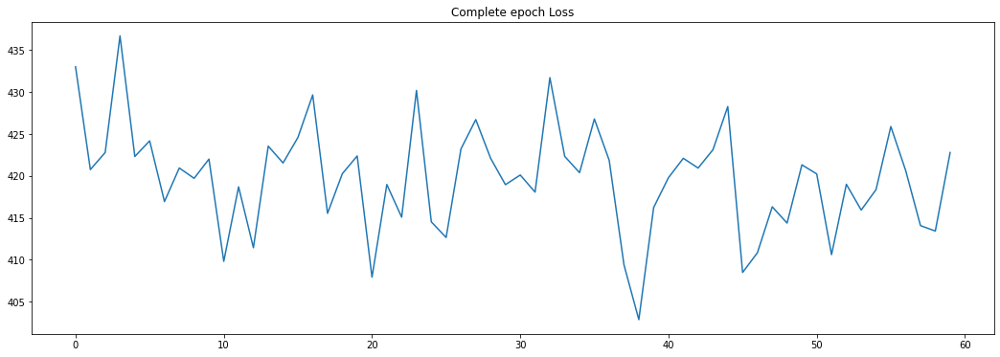

In [227]:
fig, (ax1) = plt.subplots(1, 1, figsize=(18, 6))

ax1.plot(np.arange(len(epoch_loss)), epoch_loss)
ax1.set_title('Complete epoch Loss')

Text(0.5, 1.0, 'Complete Loss')

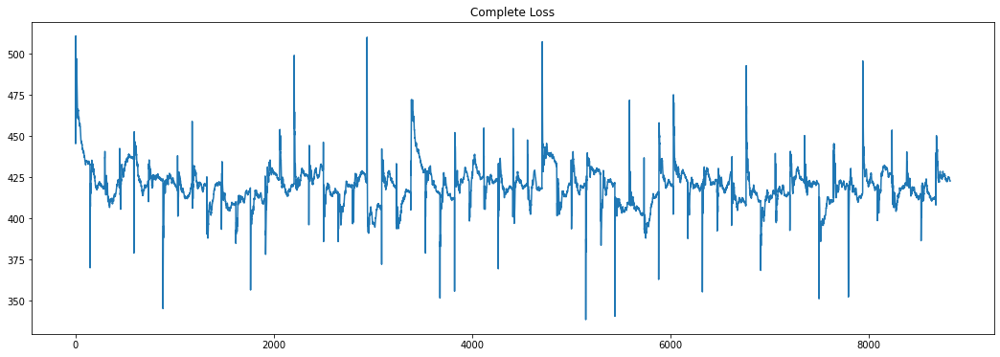

In [228]:
fig, (ax1) = plt.subplots(1, 1, figsize=(18, 6))

ax1.plot(np.arange(len(loss_results)), loss_results)
ax1.set_title('Complete Loss')

Text(0.5, 1.0, 'Discriminator Loss')

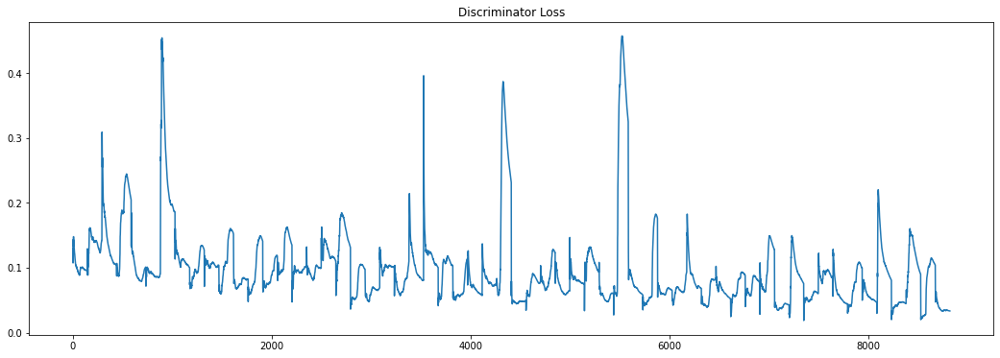

In [229]:
fig, (ax1) = plt.subplots(1, 1, figsize=(18, 6))

ax1.plot(np.arange(len(discriminator_loss_results)), discriminator_loss_results)
ax1.set_title('Discriminator Loss')

Text(0.5, 1.0, 'Generator Loss')

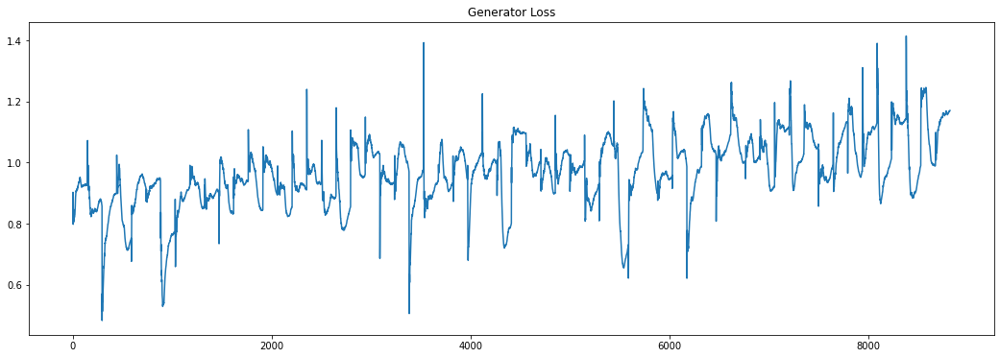

In [230]:
fig, (ax1) = plt.subplots(1, 1, figsize=(18, 6))

ax1.plot(np.arange(len(generator_loss_results)), generator_loss_results)
ax1.set_title('Generator Loss')

In [ ]:
# new training

# Test complete model

In [237]:
!mkdir realGAN_180_weights

In [238]:
name = !ls -t1d training_gan_checkpoints/* | head -3
name

['training_gan_checkpoints/checkpoint',
 'training_gan_checkpoints/ckpt-180.index',
 'training_gan_checkpoints/ckpt-180.data-00000-of-00001']

In [ ]:
# !ls -t1d training_gan_checkpoints/* | head -3

training_gan_checkpoints/checkpoint
training_gan_checkpoints/ckpt-120.index
training_gan_checkpoints/ckpt-120.data-00000-of-00001


In [239]:
!cp -p `ls -t1d training_gan_checkpoints/* | head -3` realGAN_180_weights

In [240]:
!zip -r realGAN_180_weights.zip realGAN_180_weights

  adding: realGAN_180_weights/ (stored 0%)
  adding: realGAN_180_weights/ckpt-180.index (deflated 82%)
  adding: realGAN_180_weights/checkpoint (deflated 38%)
  adding: realGAN_180_weights/ckpt-180.data-00000-of-00001 (deflated 8%)


In [241]:
!mkdir ema_realGAN_180_weights

In [242]:
!cp -p `ls -t1d ema_training_gan_checkpoints/* | head -3` ema_realGAN_180_weights

In [243]:
!zip -r ema_realGAN_180_weights.zip ema_realGAN_180_weights

  adding: ema_realGAN_180_weights/ (stored 0%)
  adding: ema_realGAN_180_weights/ema_ckpt-180.data-00000-of-00001 (deflated 8%)
  adding: ema_realGAN_180_weights/checkpoint (deflated 40%)
  adding: ema_realGAN_180_weights/ema_ckpt-180.index (deflated 80%)


In [ ]:
# zip .... and download or move to drive

In [110]:
def load_single_test_img(image_path):
  img = tf.io.read_file(image_path)
  img = tf.image.decode_jpeg(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  return img

In [125]:
images_list = sorted(glob("anime_test/*.jpeg"))

In [231]:
!mkdir images_180

In [232]:
for index, img_list in enumerate(images_list):
  single_img = load_single_test_img(img_list)
  single_img = tf.expand_dims(single_img, axis=0)
  single_output_img = gan_model(single_img)

  tf.keras.utils.save_img(f"images_180/image{index + 1}.png", single_output_img[0])

In [233]:
!zip -r images_180.zip images_180

  adding: images_180/ (stored 0%)
  adding: images_180/image0.png (deflated 0%)
  adding: images_180/image4.png (deflated 0%)
  adding: images_180/image1.png (deflated 0%)
  adding: images_180/image3.png (deflated 0%)
  adding: images_180/image2.png (deflated 0%)


In [234]:
!mkdir ema_images_180

In [235]:
for index, img_list in enumerate(images_list):
  single_img = load_single_test_img(img_list)
  single_img = tf.expand_dims(single_img, axis=0)
  single_output_img = ema_gan_model(single_img)

  tf.keras.utils.save_img(f"ema_images_180/ema_image{index + 1}.png", single_output_img[0])

In [236]:
!zip -r ema_images_180.zip ema_images_180

  adding: ema_images_180/ (stored 0%)
  adding: ema_images_180/ema_image2.png (deflated 0%)
  adding: ema_images_180/ema_image3.png (deflated 0%)
  adding: ema_images_180/ema_image1.png (deflated 0%)
  adding: ema_images_180/ema_image4.png (deflated 0%)
  adding: ema_images_180/ema_image0.png (deflated 0%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


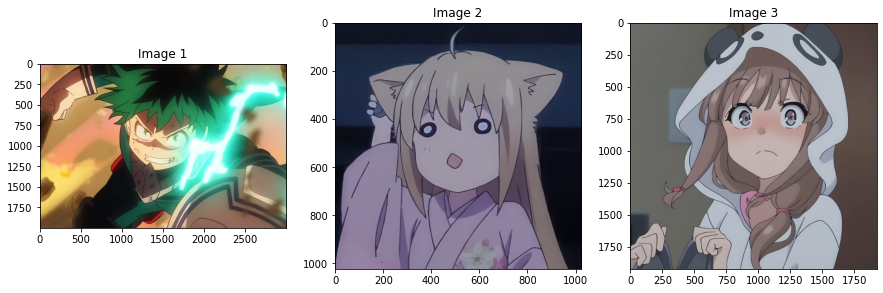

In [132]:
plot_images(final_images[:3], 1, 3, figsize=(15, 15))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


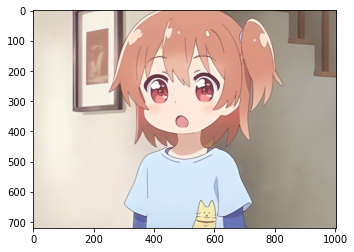

In [ ]:
plt.imshow(final_images[0])

In [ ]:
gt_test_gen = gt_test_dataset.batch(12)
lq_test_gen = lq_test_dataset.batch(12)

In [ ]:
gt_test_gen = iter(gt_test_gen)
lq_test_gen = iter(lq_test_gen)

In [ ]:
gt_test_images = next(gt_test_gen)
lq_test_images = next(lq_test_gen)

In [ ]:
output_img = gan_model(lq_test_images)

In [ ]:
ema_output_img = ema_gan_model(lq_test_images)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


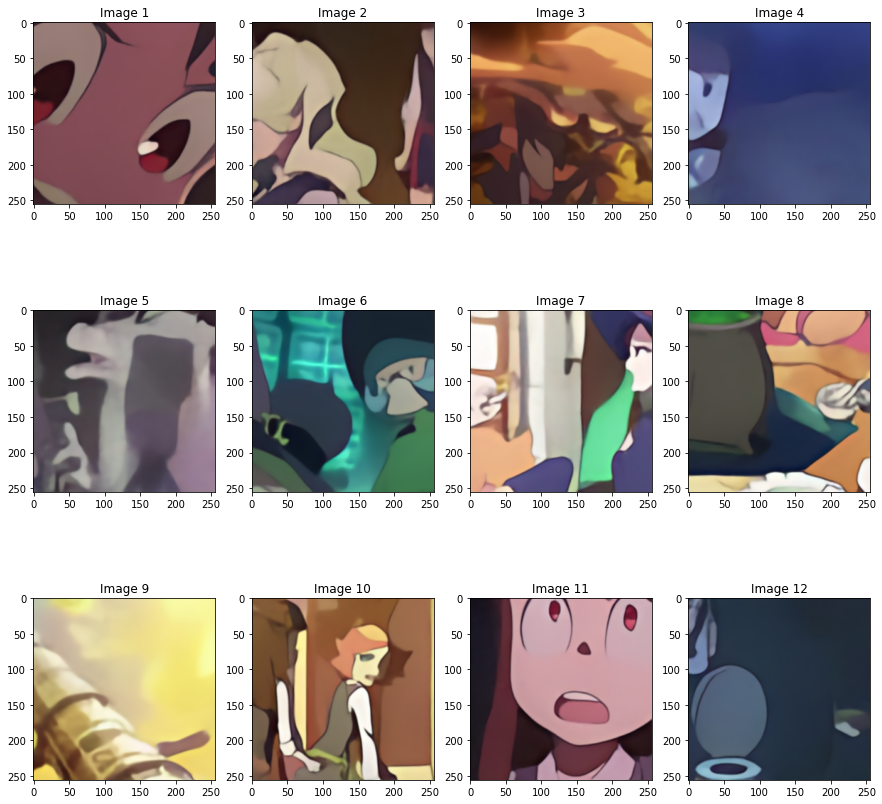

In [ ]:
plot_images(ema_output_img, 3, 4, figsize=(15, 15)) # ema Gan

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


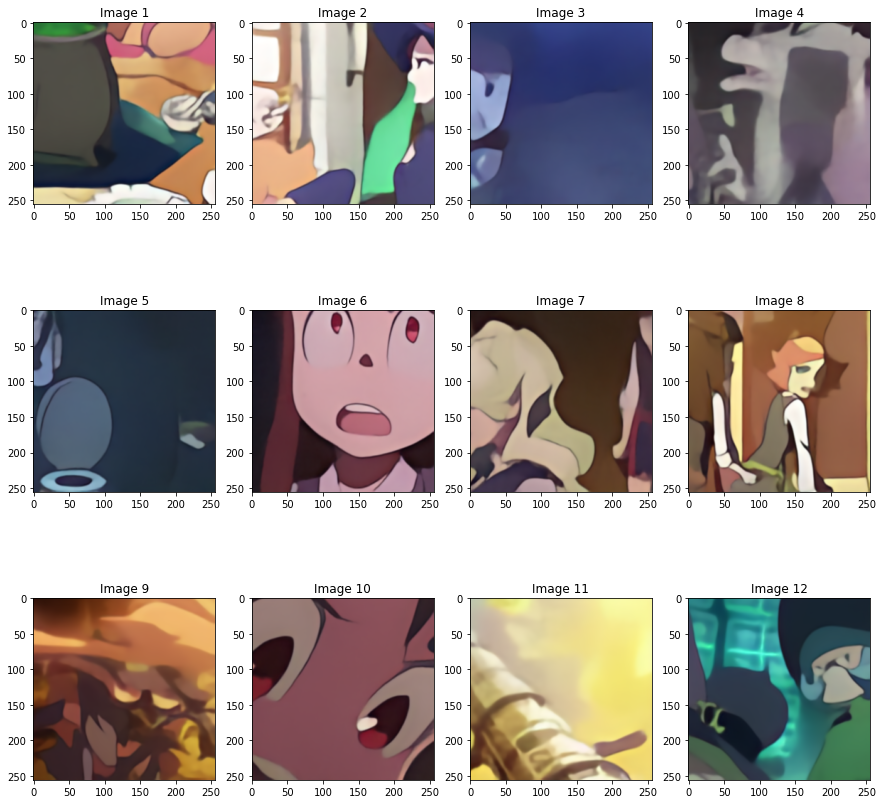

In [ ]:
plot_images(ema_output_img, 3, 4, figsize=(15, 15)) # ema Gan

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


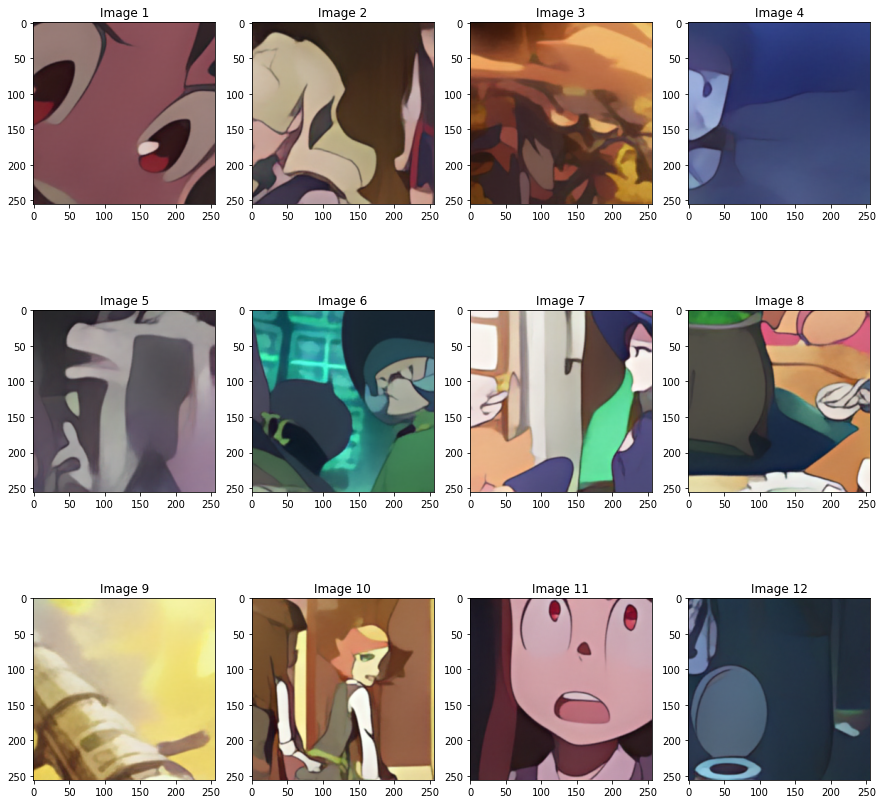

In [ ]:
plot_images(output_img, 3, 4, figsize=(15, 15)) # new Gan no usm

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


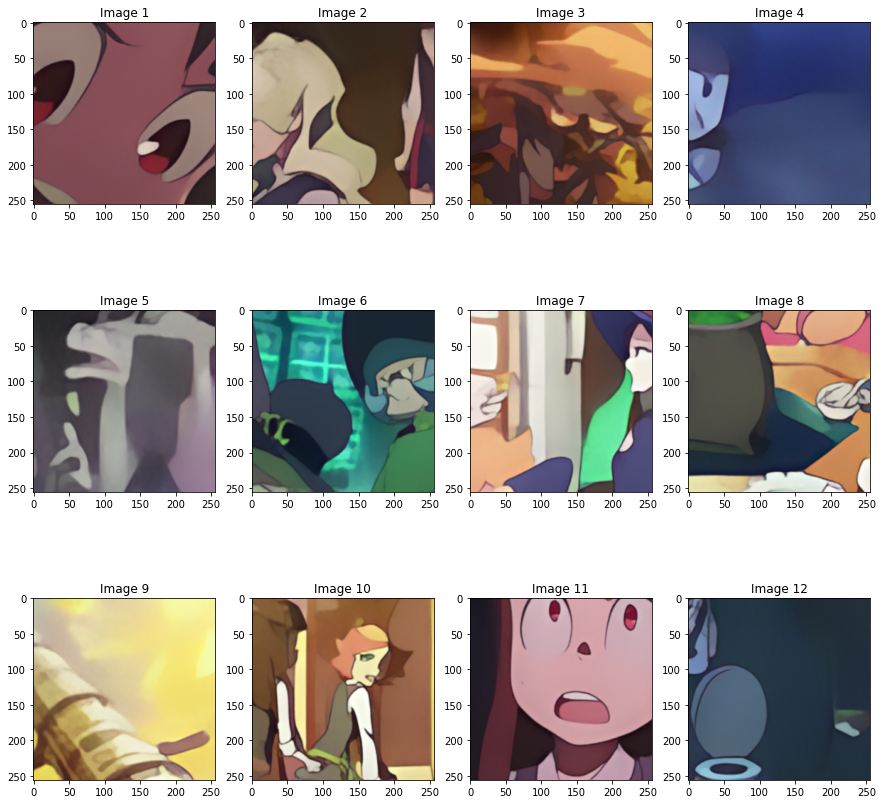

In [ ]:
plot_images(output_img, 3, 4, figsize=(15, 15)) # Gan

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


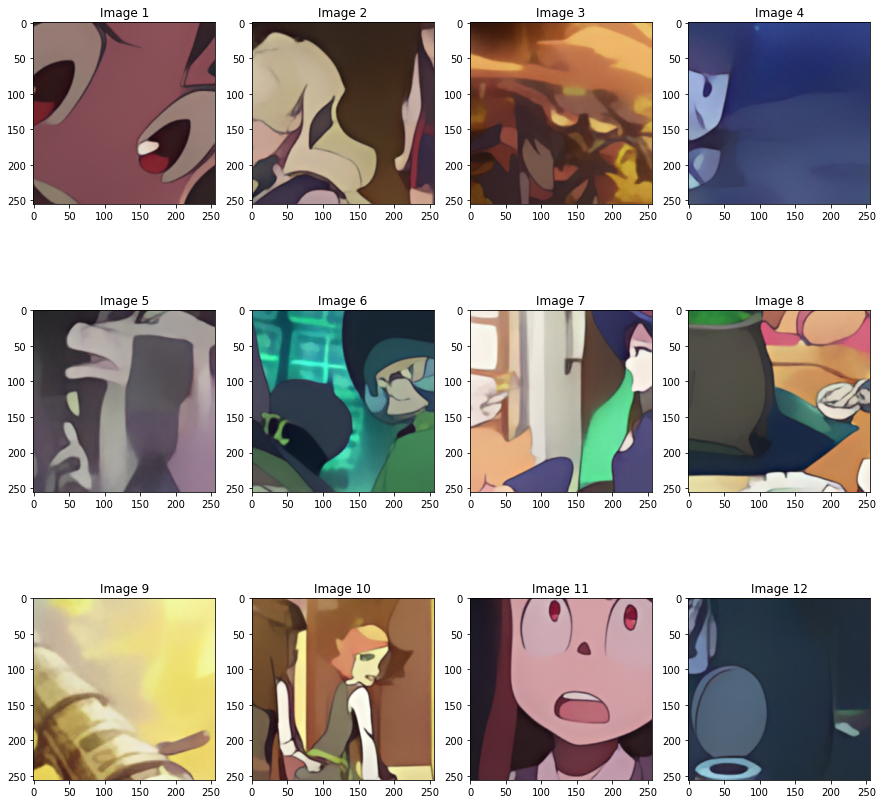

In [ ]:
plot_images(output_img, 3, 4, figsize=(15, 15)) # Gan

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


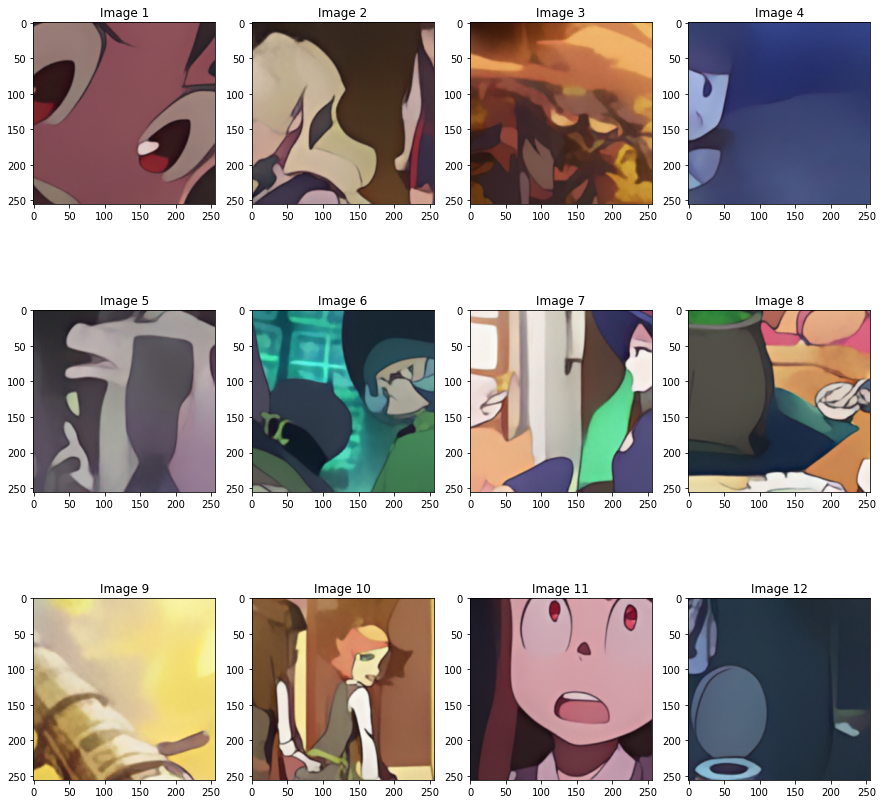

In [ ]:
plot_images(output_img, 3, 4, figsize=(15, 15)) # Gan

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


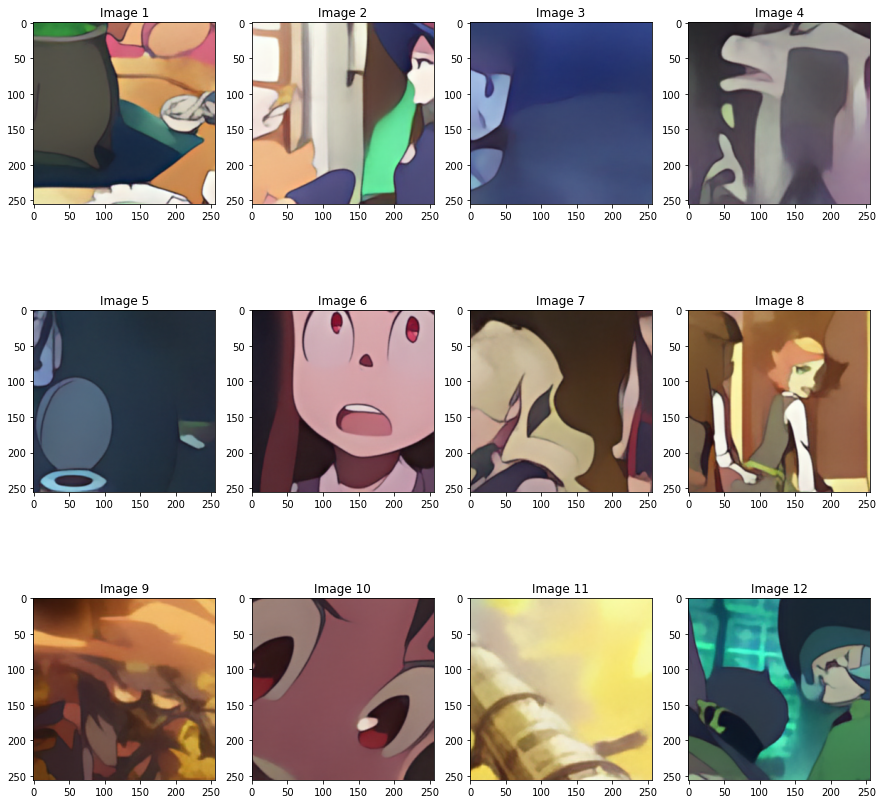

In [ ]:
plot_images(output_img, 3, 4, figsize=(15, 15)) # Gan

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


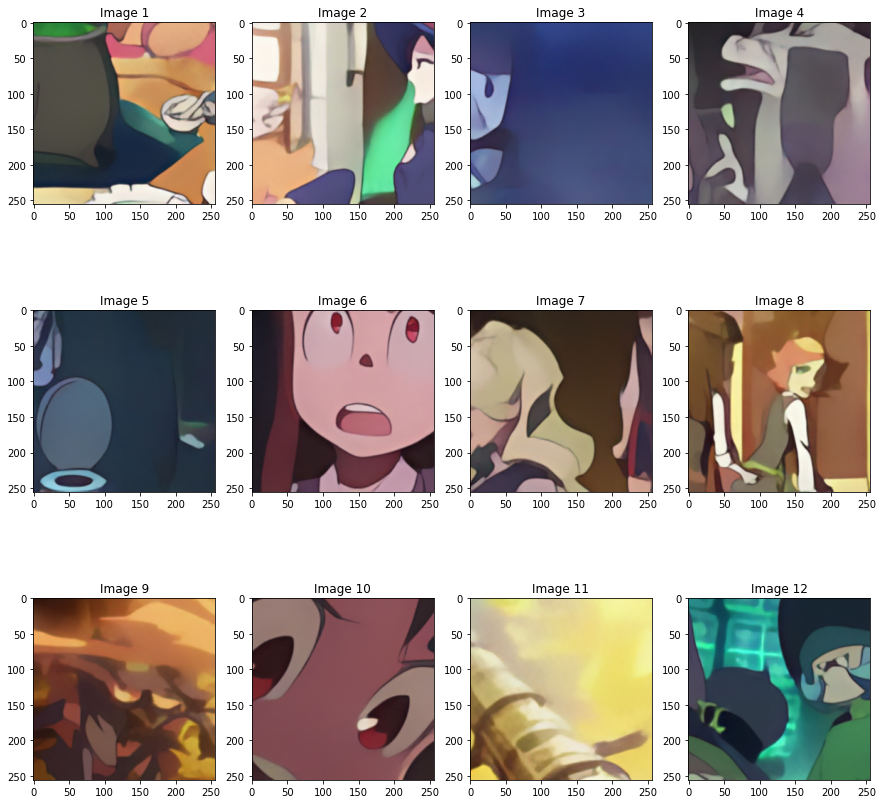

In [ ]:
plot_images(output_img, 3, 4, figsize=(15, 15)) # Gan

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


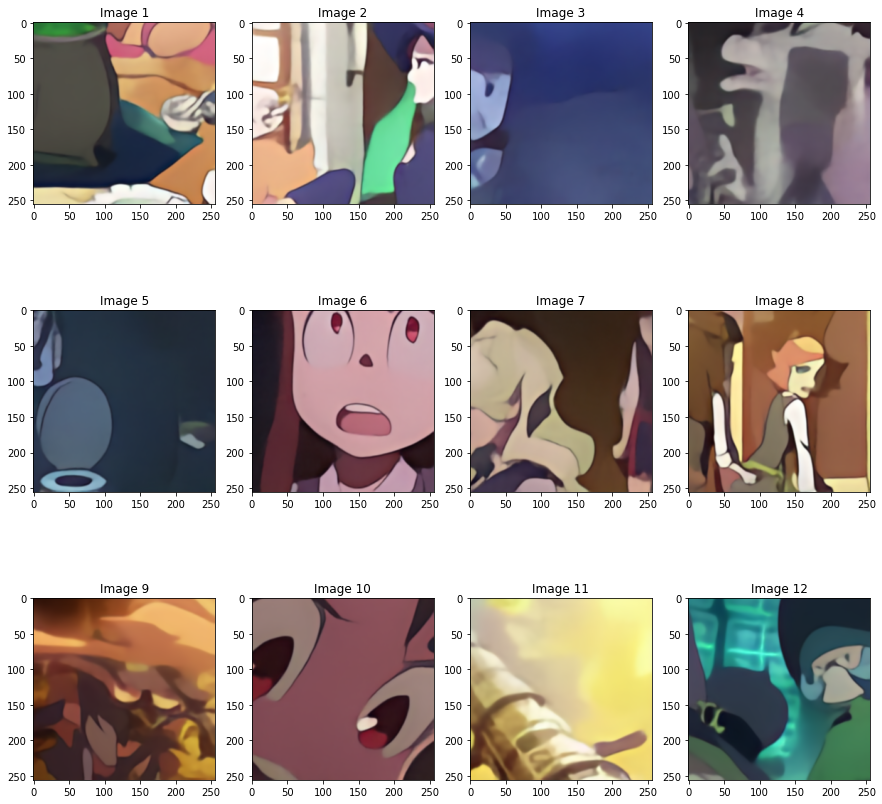

In [ ]:
plot_images(output_img, 3, 4, figsize=(15, 15))

# Commands

In [ ]:
!python folder_with_files/train.py --epochs=10

In [ ]:
!python -m pytest folder_with_files/tests/model_test.py